# MODEL BUILDING USING PROPHET

In this part of the code the model is built for all the stores first part. The second part of the code shows the future sales forecast of the store number which is given as the input. 

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import datetime

In [2]:
wd=pd.read_csv('Walmart.csv',parse_dates=["Date"])

In [3]:
from prophet import Prophet
from prophet.plot import plot_plotly,plot_components_plotly

In [4]:
grouped_data=wd.groupby('Store')
wd

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,2010-05-02,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,2010-12-02,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,2010-05-03,1554806.68,0,46.50,2.625,211.350143,8.106
...,...,...,...,...,...,...,...,...
6430,45,2012-09-28,713173.95,0,64.88,3.997,192.013558,8.684
6431,45,2012-05-10,733455.07,0,64.89,3.985,192.170412,8.667
6432,45,2012-12-10,734464.36,0,54.47,4.000,192.327265,8.667
6433,45,2012-10-19,718125.53,0,56.47,3.969,192.330854,8.667


In [5]:
wd['Date']=pd.to_datetime(wd['Date'],format='%d-%m-%Y')

data1=wd.sort_values(['Store','Date'],ascending=[True,True])
data1.head()
wd=data1
wd=wd.reset_index()
wd=wd.drop(['index'],axis=1)
wd

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,2010-01-10,1453329.50,0,71.89,2.603,211.671989,7.838
1,1,2010-02-04,1594968.28,0,62.27,2.719,210.820450,7.808
2,1,2010-02-07,1492418.14,0,80.91,2.669,211.223533,7.787
3,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106
4,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106
...,...,...,...,...,...,...,...,...
6430,45,2012-10-08,733037.32,0,78.65,3.722,191.162613,8.684
6431,45,2012-10-19,718125.53,0,56.47,3.969,192.330854,8.667
6432,45,2012-10-26,760281.43,0,58.85,3.882,192.308899,8.667
6433,45,2012-11-05,770487.37,0,61.24,3.889,190.976417,8.567


12:48:26 - cmdstanpy - INFO - Chain [1] start processing
12:48:26 - cmdstanpy - INFO - Chain [1] done processing


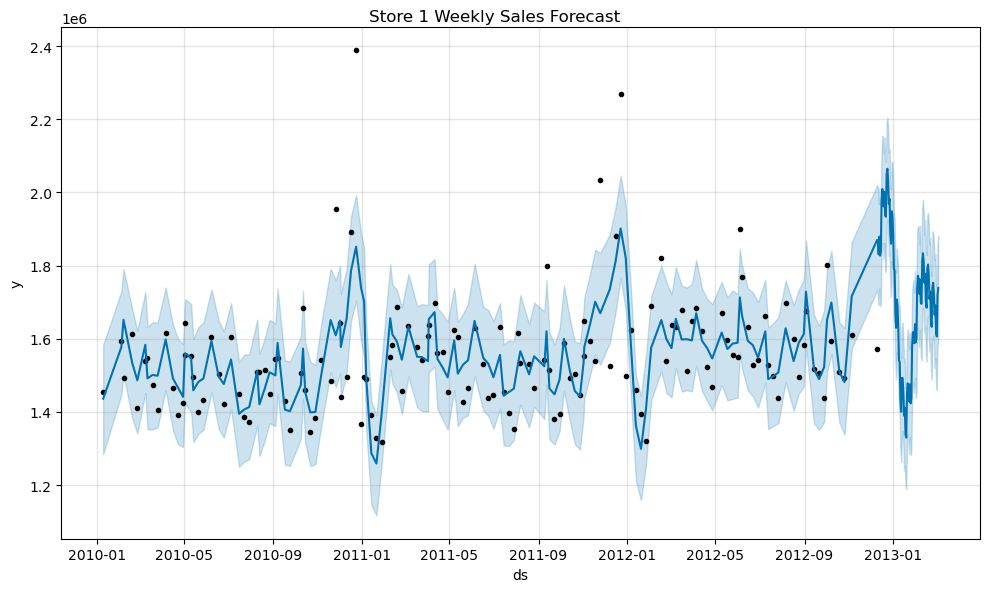

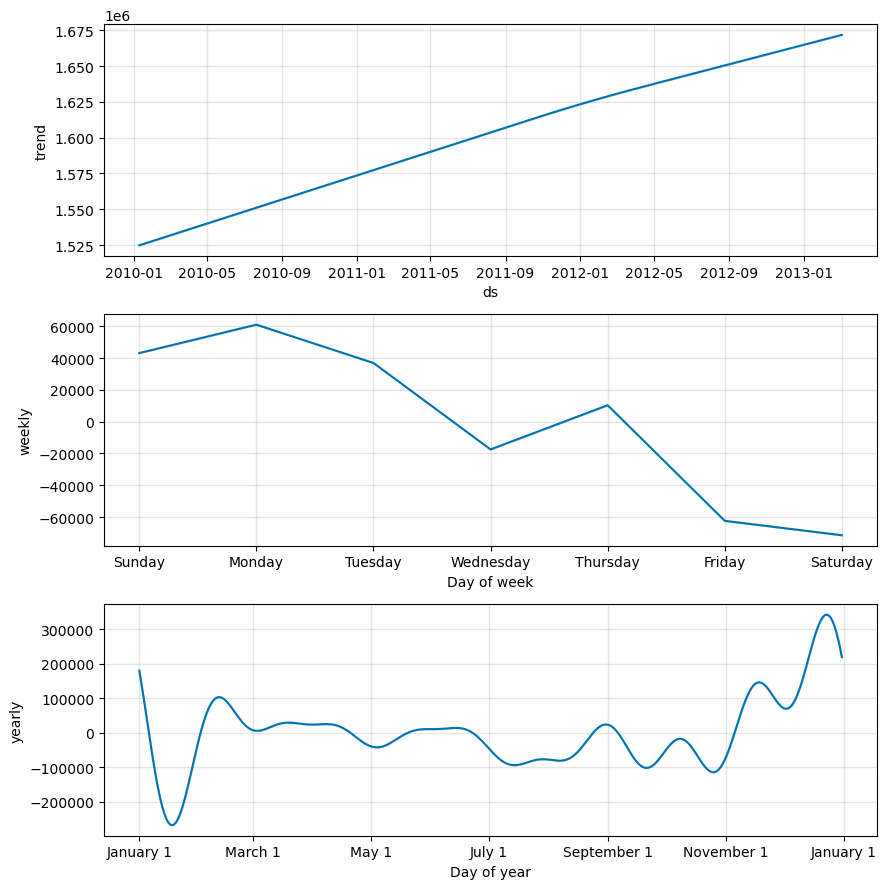

12:48:28 - cmdstanpy - INFO - Chain [1] start processing
12:48:28 - cmdstanpy - INFO - Chain [1] done processing


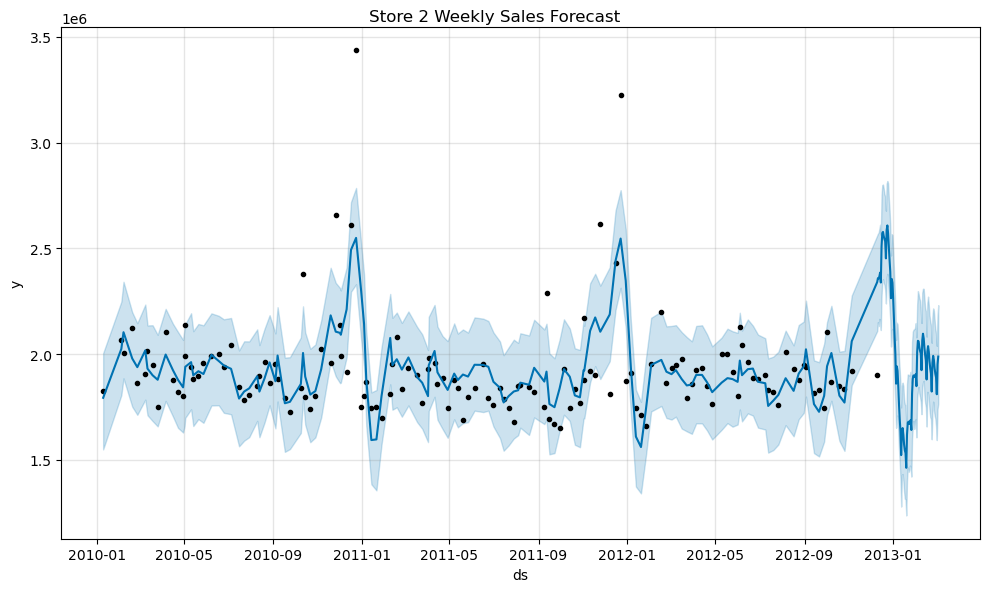

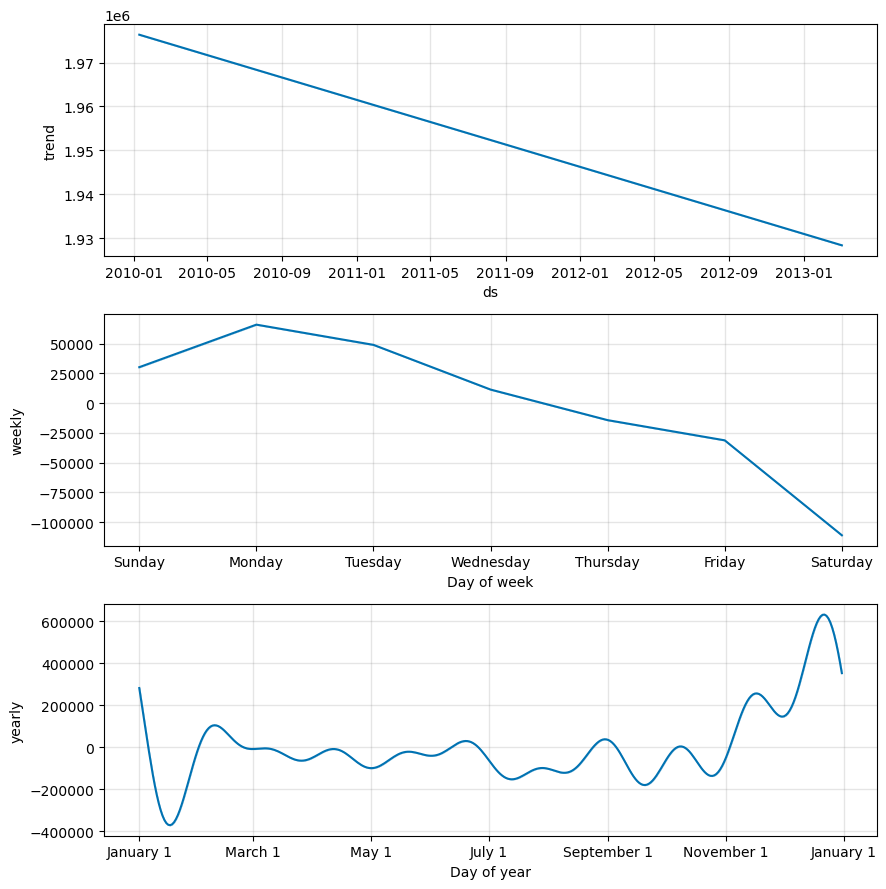

12:48:30 - cmdstanpy - INFO - Chain [1] start processing
12:48:30 - cmdstanpy - INFO - Chain [1] done processing


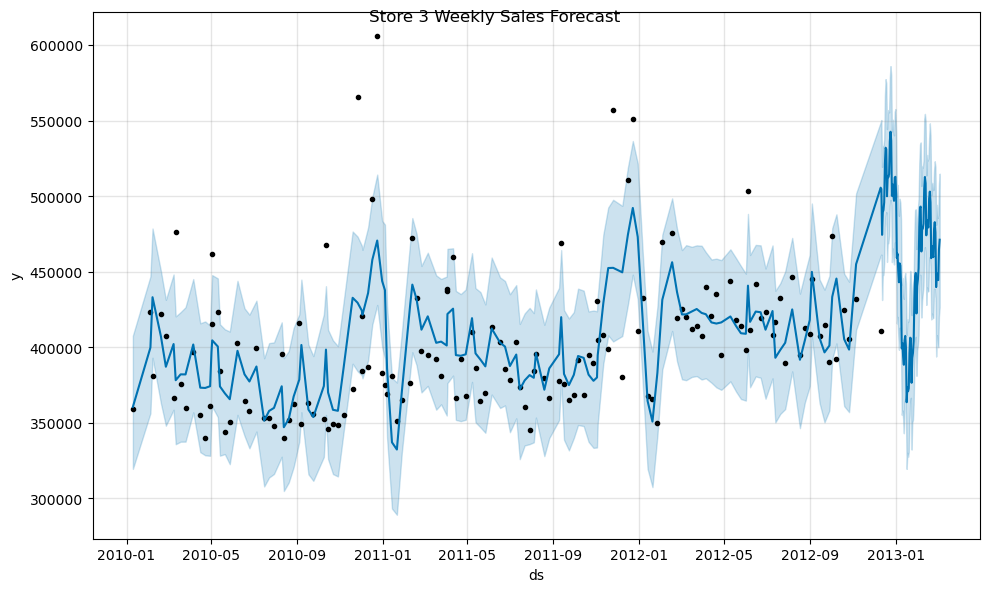

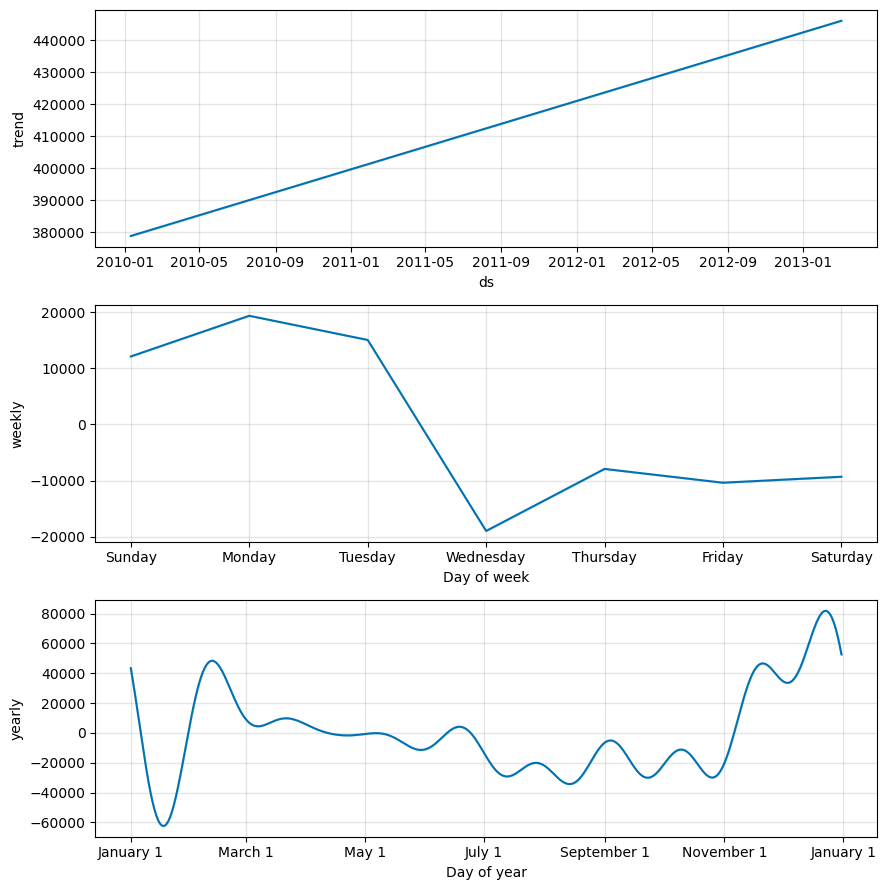

12:48:32 - cmdstanpy - INFO - Chain [1] start processing
12:48:32 - cmdstanpy - INFO - Chain [1] done processing


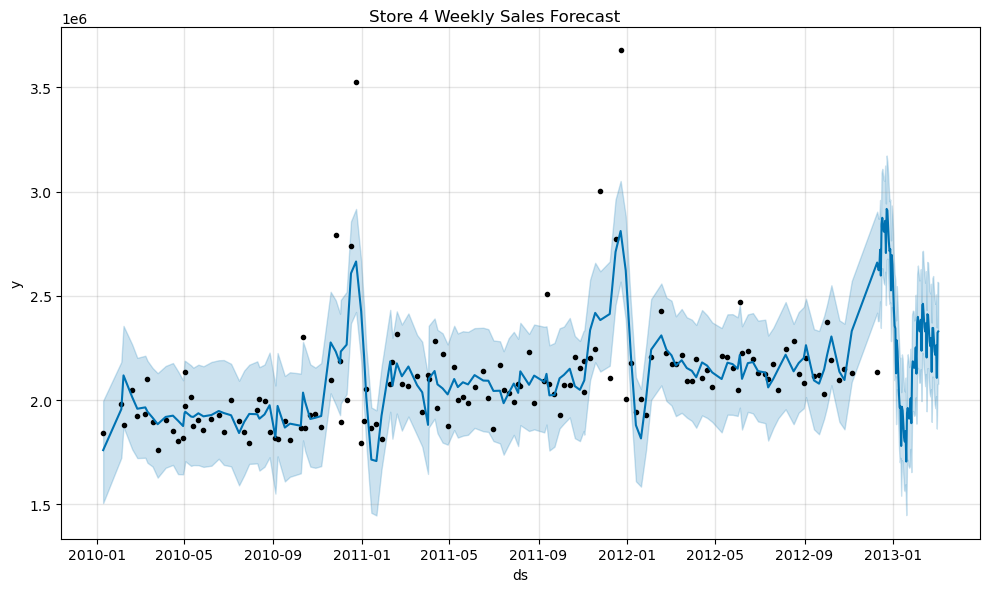

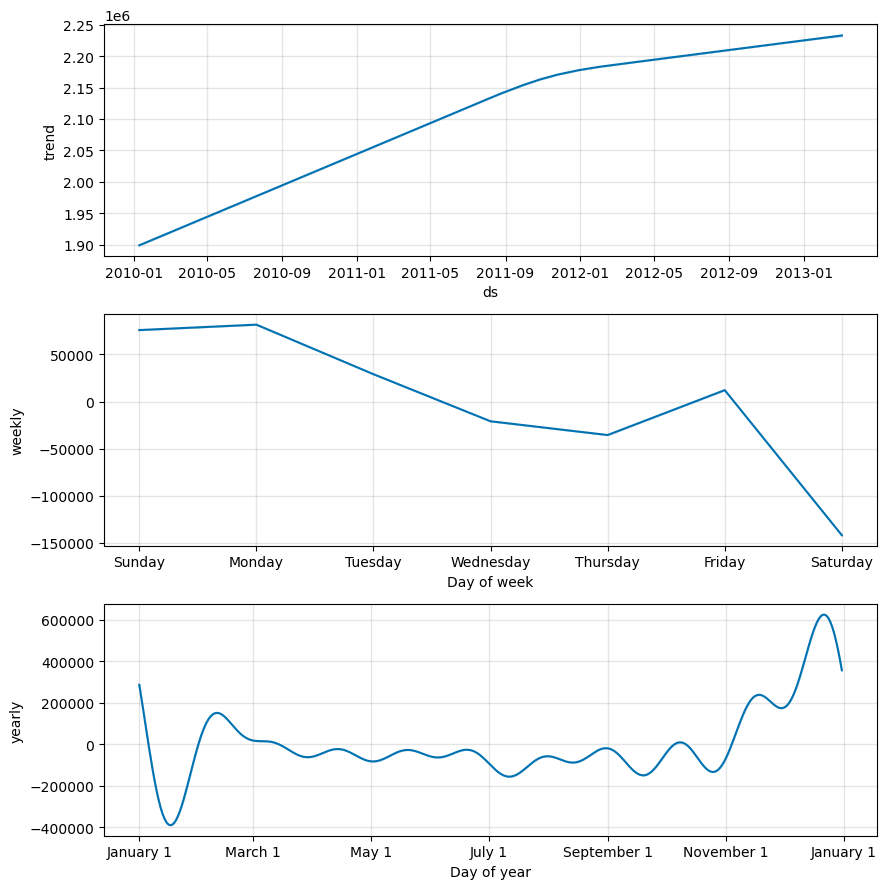

12:48:33 - cmdstanpy - INFO - Chain [1] start processing
12:48:33 - cmdstanpy - INFO - Chain [1] done processing


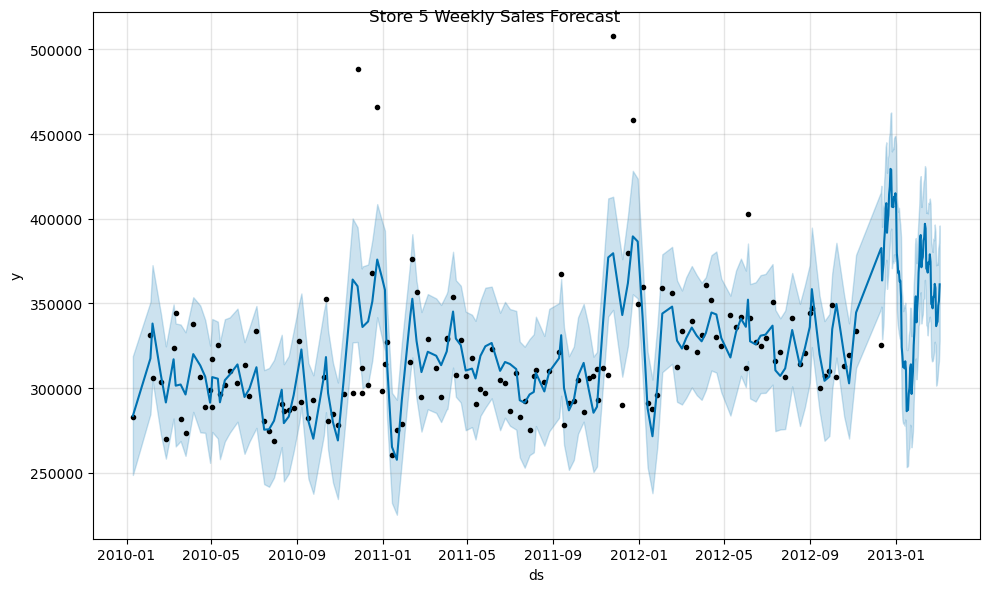

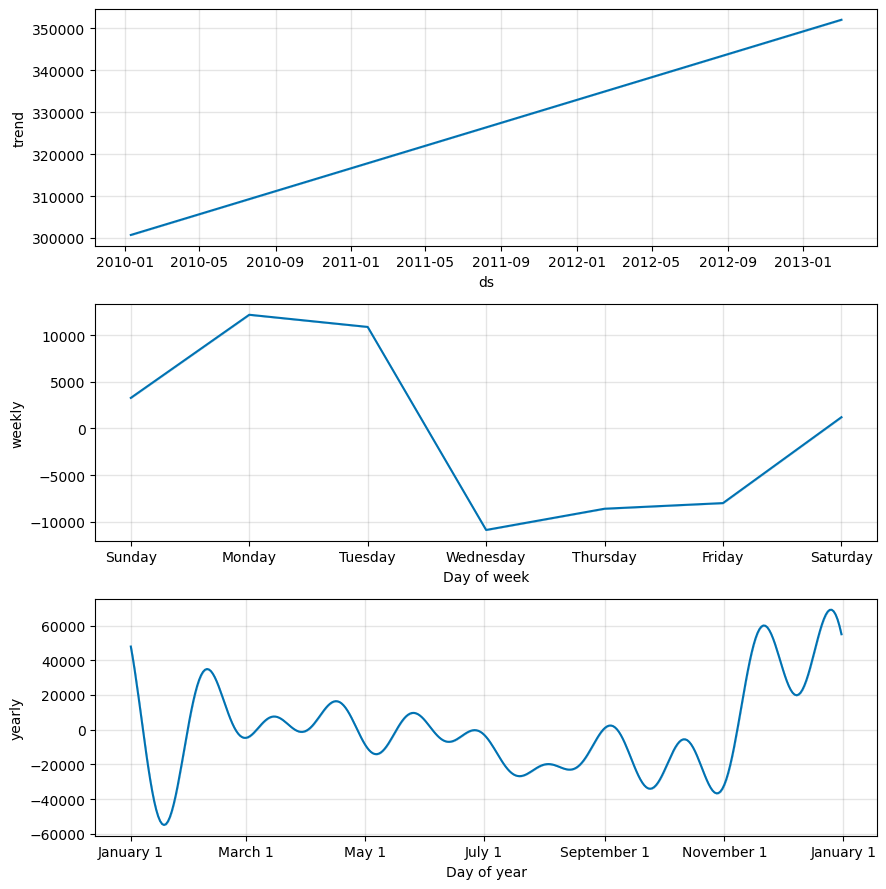

12:48:34 - cmdstanpy - INFO - Chain [1] start processing
12:48:34 - cmdstanpy - INFO - Chain [1] done processing


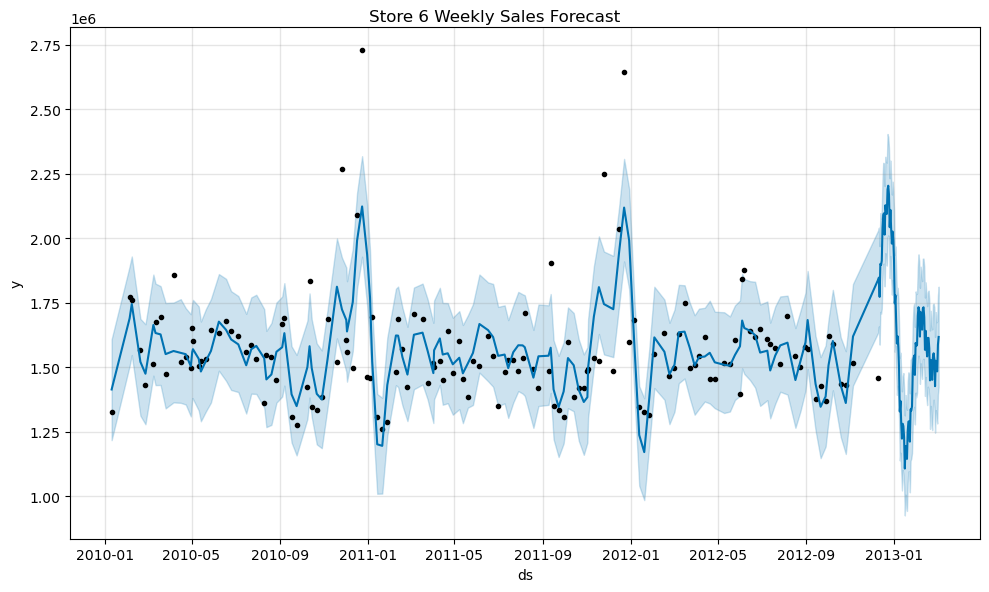

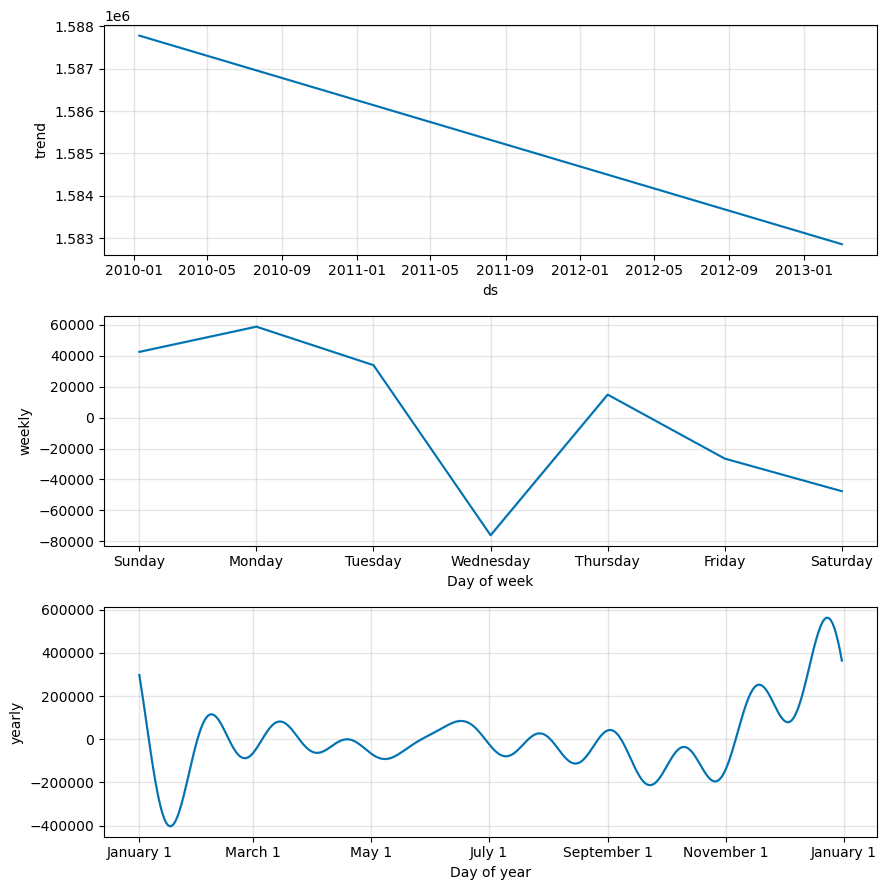

12:48:36 - cmdstanpy - INFO - Chain [1] start processing
12:48:36 - cmdstanpy - INFO - Chain [1] done processing


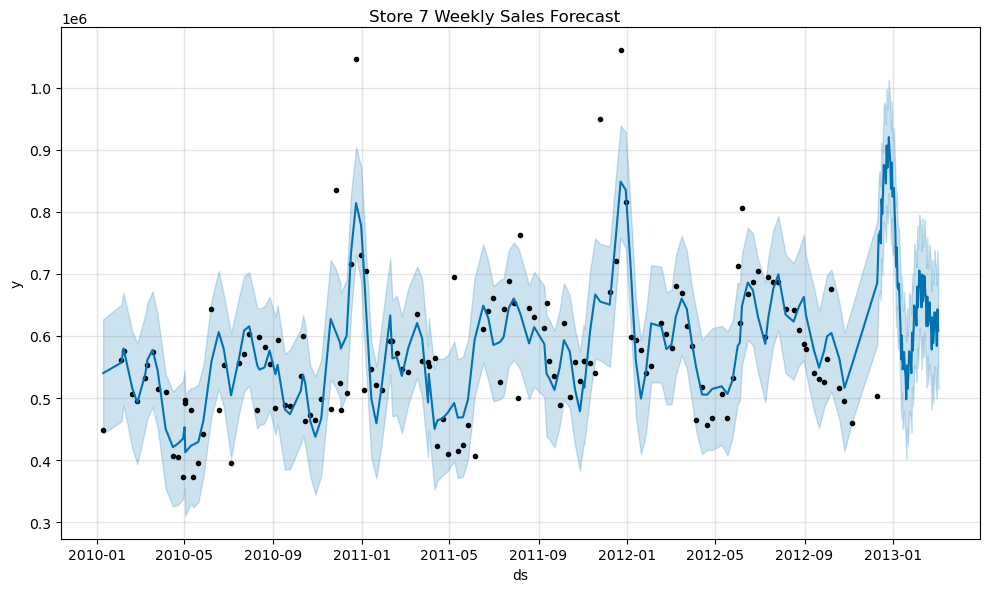

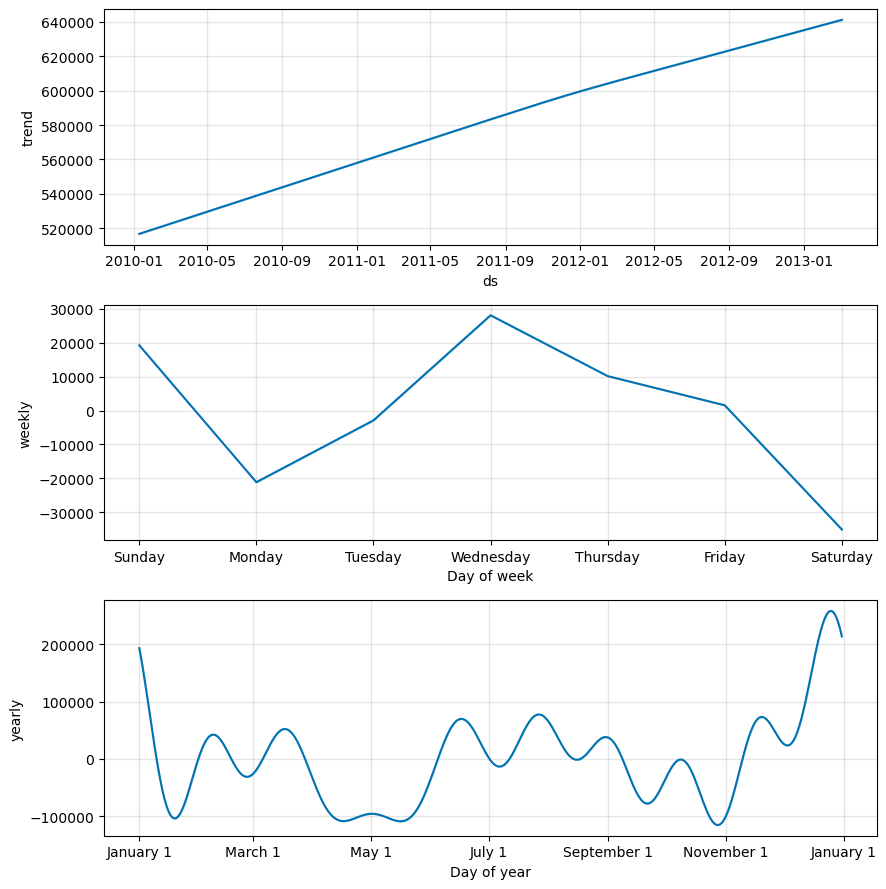

12:48:38 - cmdstanpy - INFO - Chain [1] start processing
12:48:38 - cmdstanpy - INFO - Chain [1] done processing


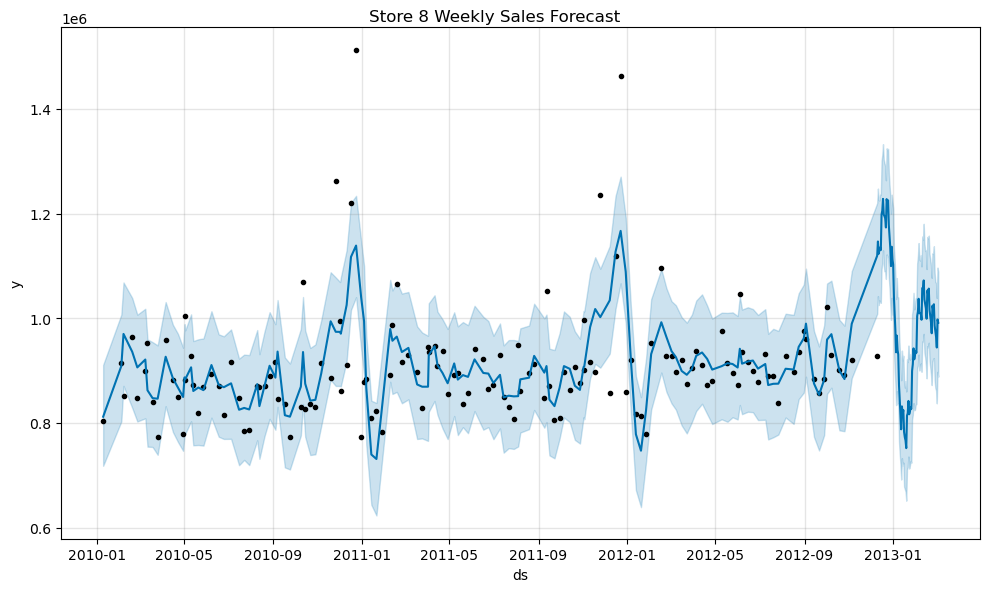

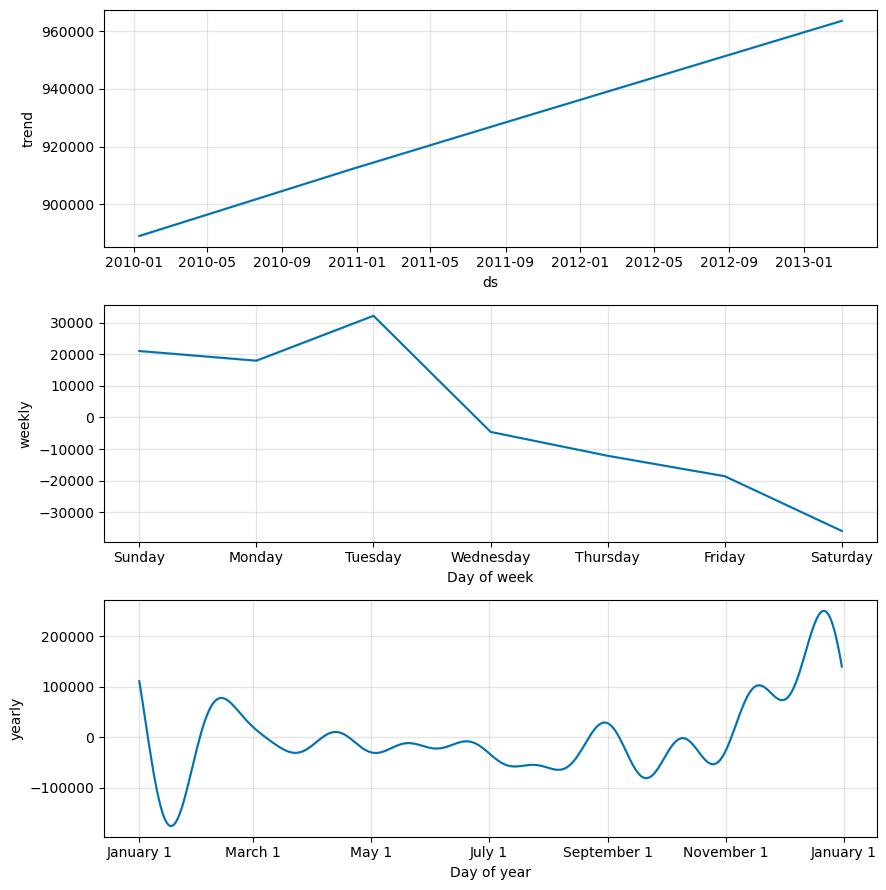

12:48:39 - cmdstanpy - INFO - Chain [1] start processing
12:48:39 - cmdstanpy - INFO - Chain [1] done processing


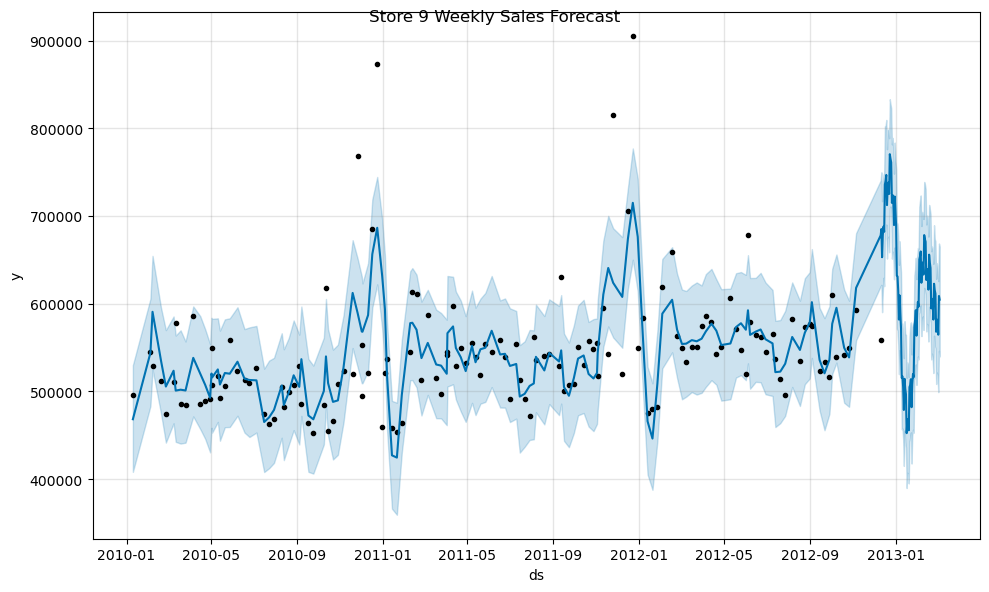

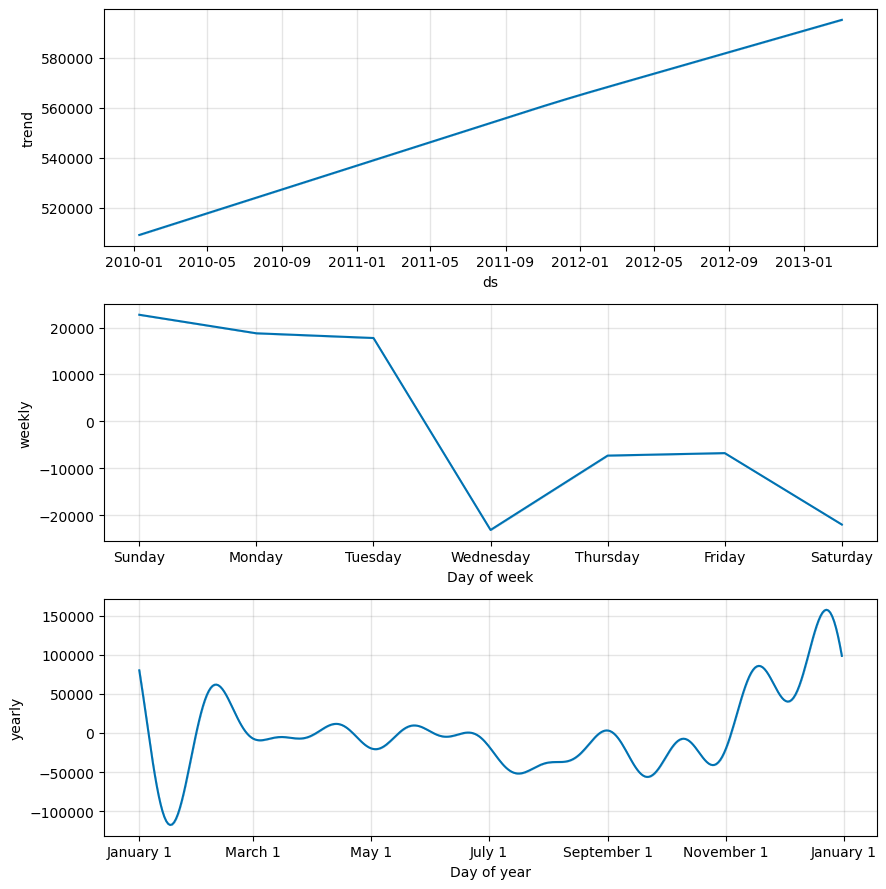

12:48:40 - cmdstanpy - INFO - Chain [1] start processing
12:48:40 - cmdstanpy - INFO - Chain [1] done processing


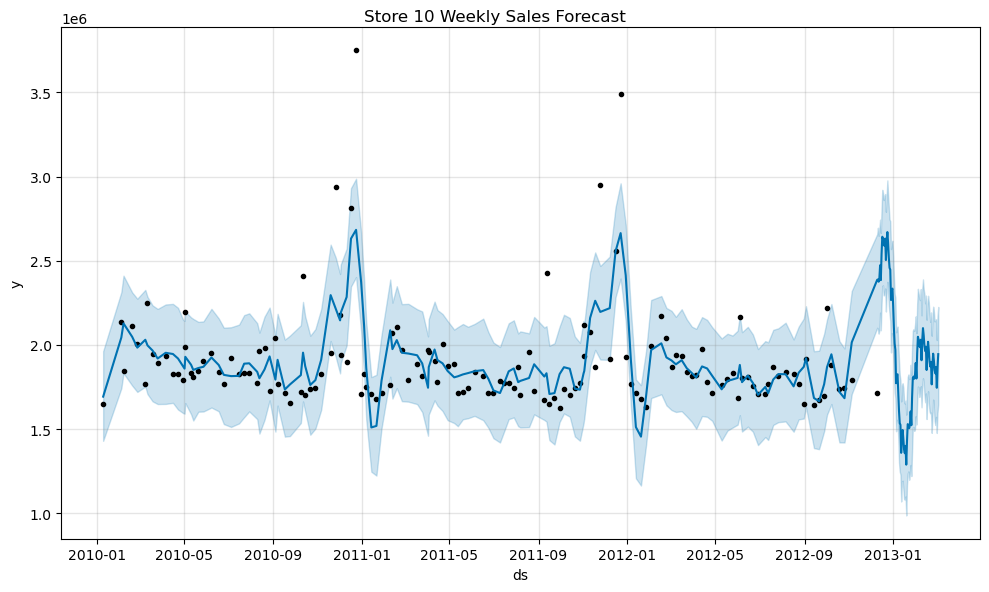

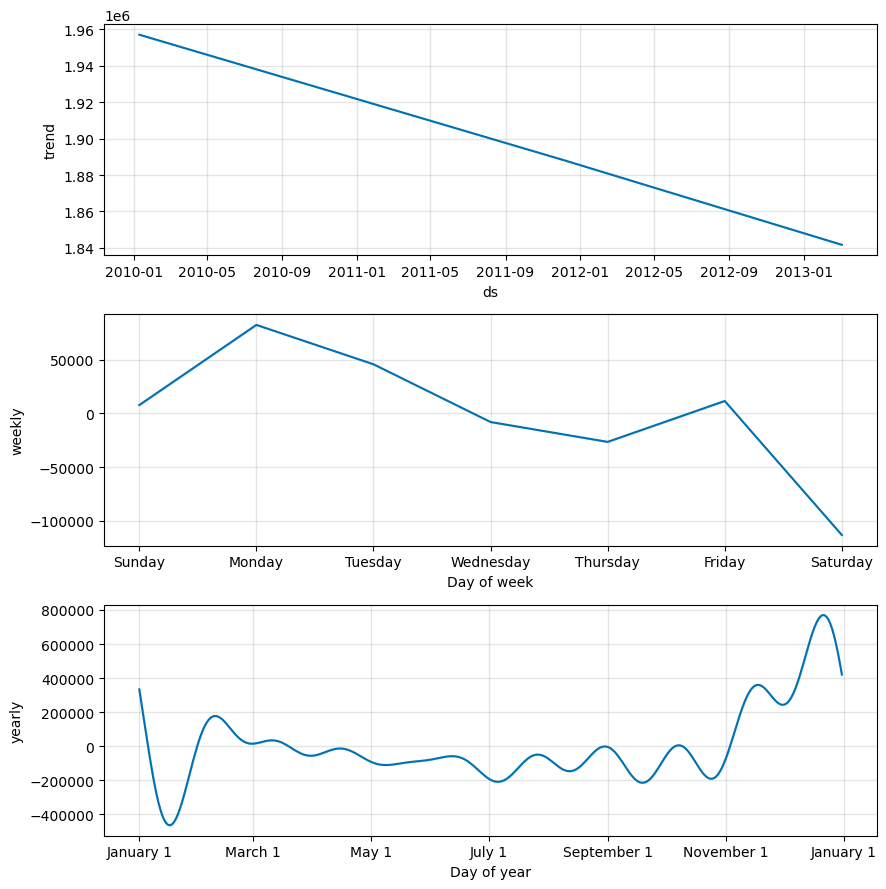

12:48:42 - cmdstanpy - INFO - Chain [1] start processing
12:48:42 - cmdstanpy - INFO - Chain [1] done processing


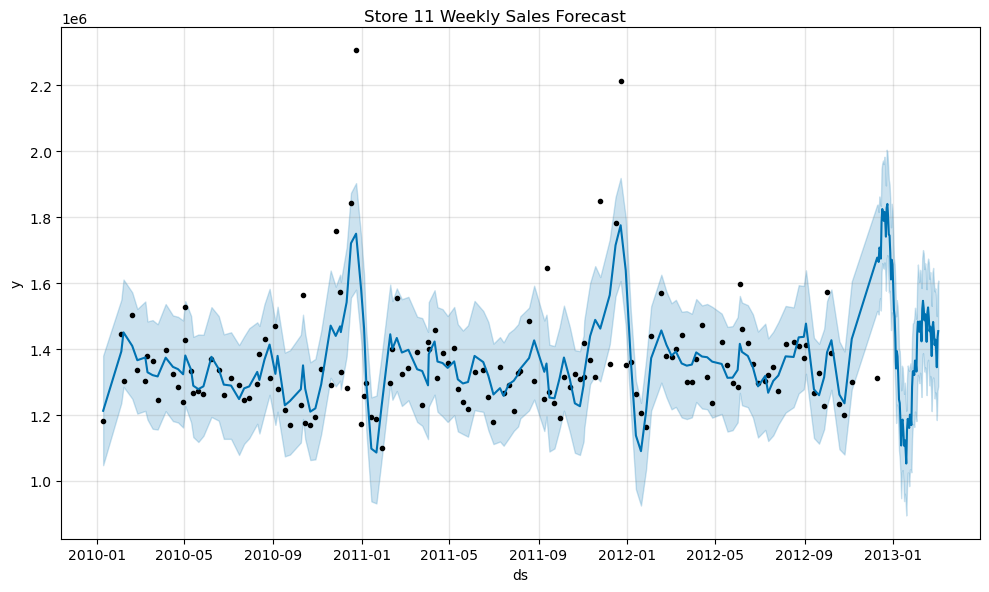

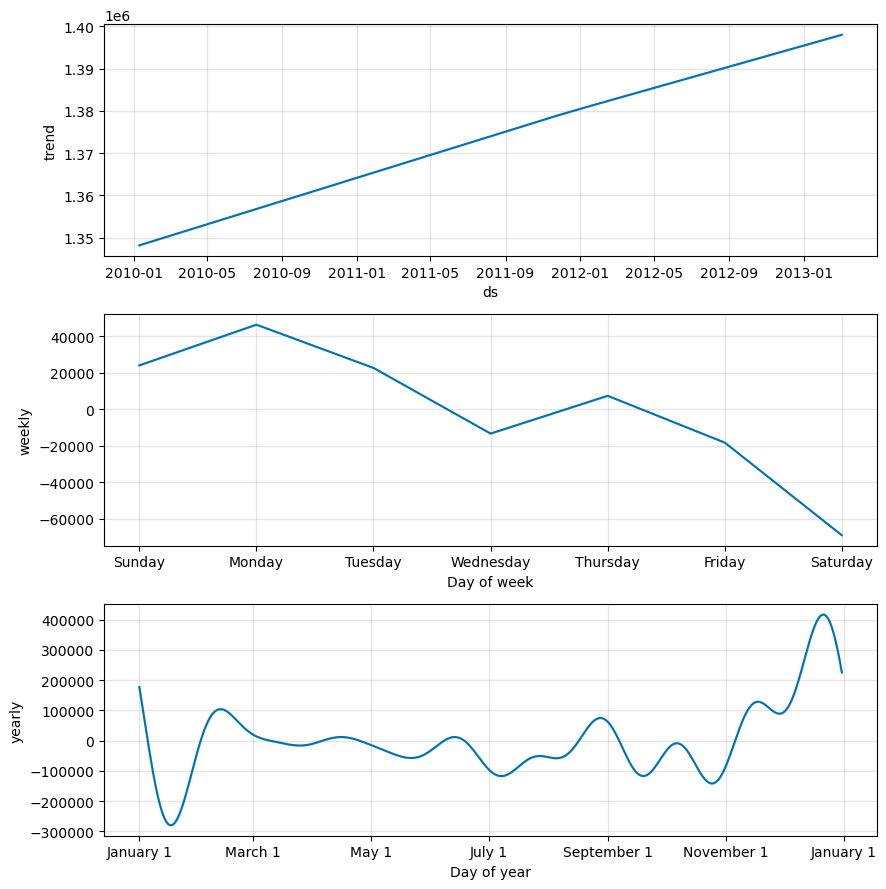

12:48:44 - cmdstanpy - INFO - Chain [1] start processing
12:48:44 - cmdstanpy - INFO - Chain [1] done processing


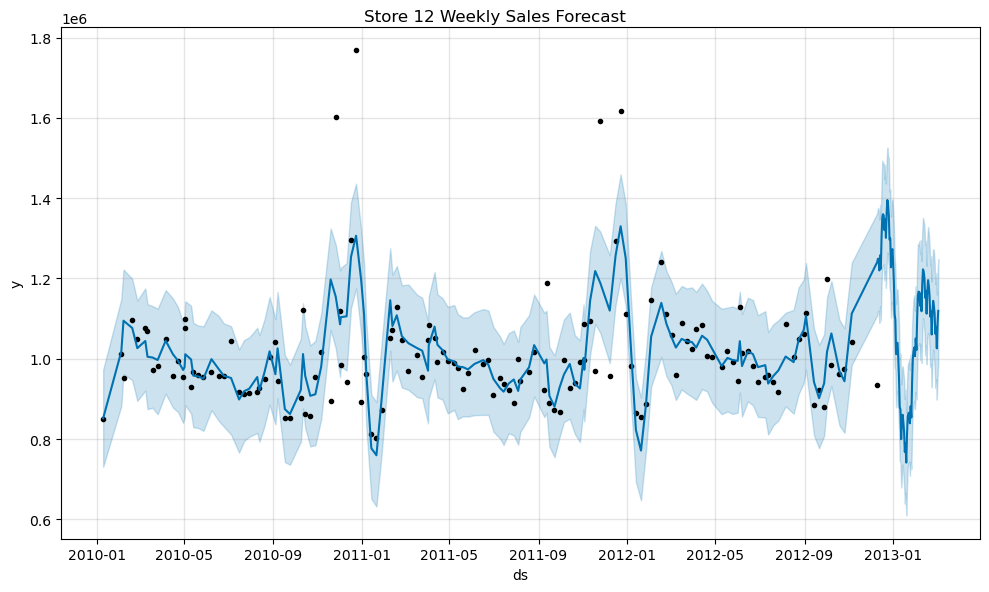

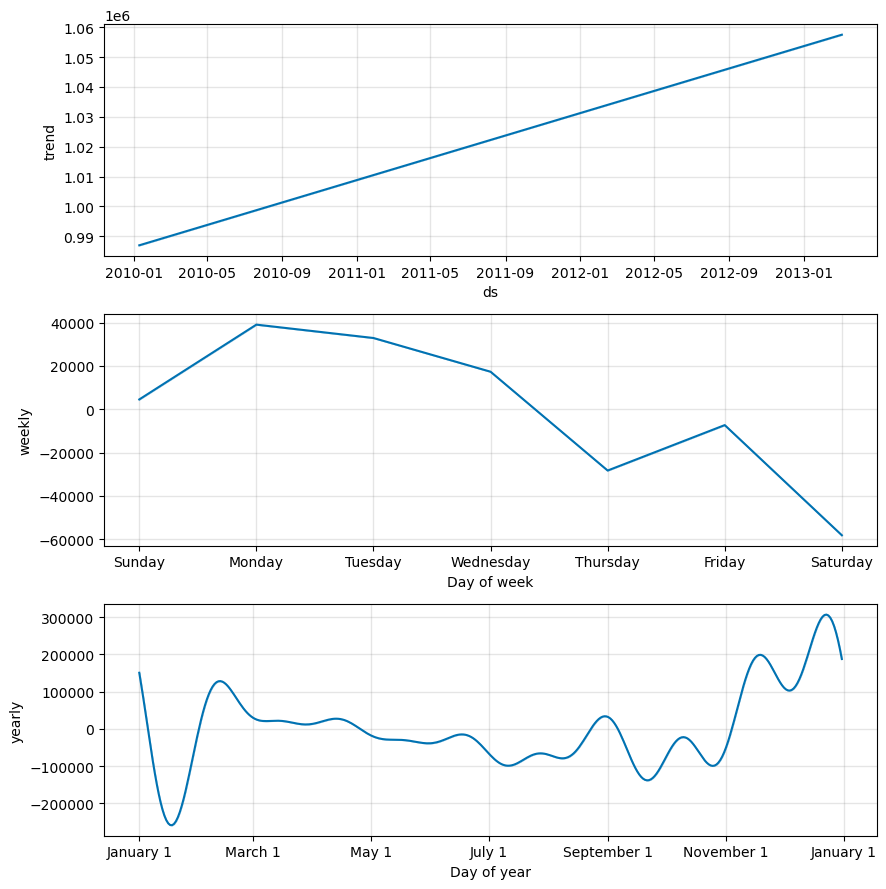

12:48:46 - cmdstanpy - INFO - Chain [1] start processing
12:48:46 - cmdstanpy - INFO - Chain [1] done processing


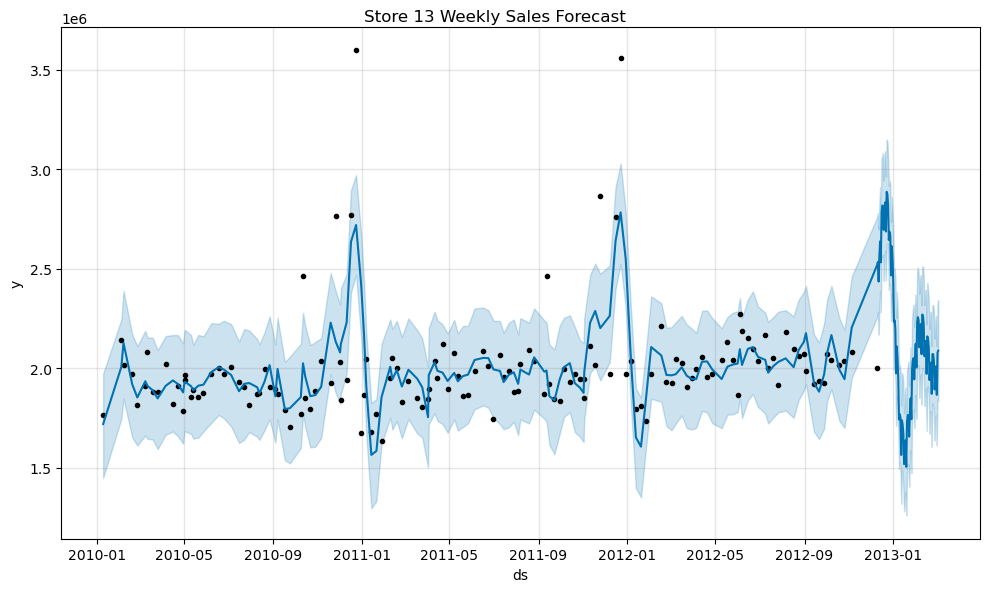

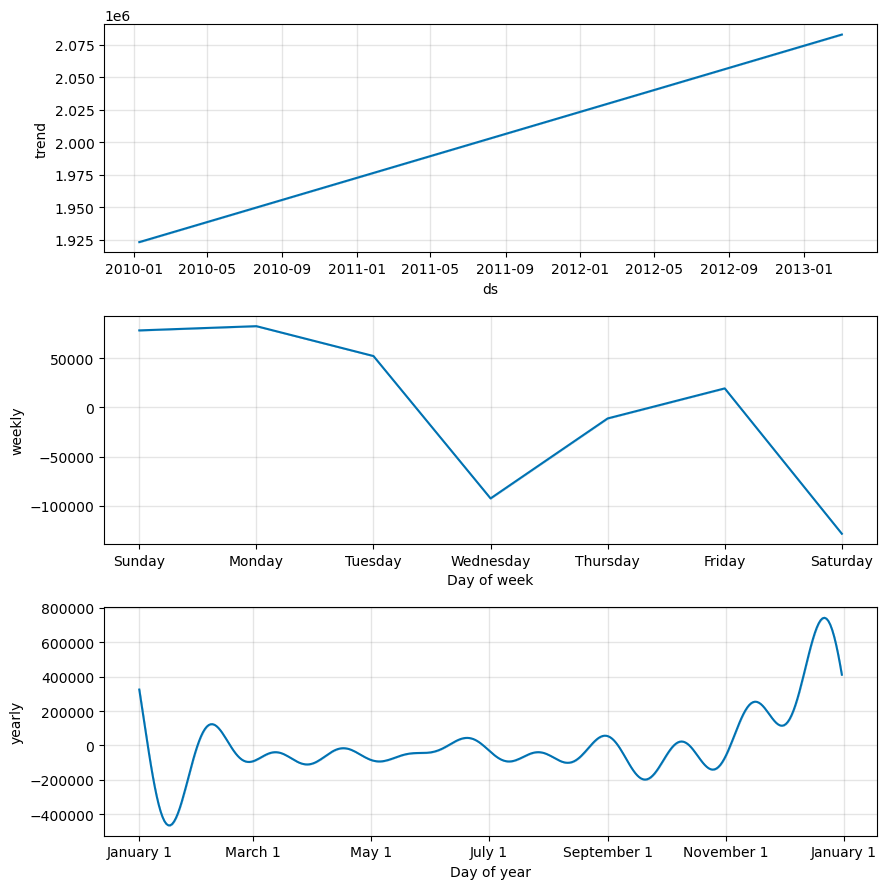

12:48:48 - cmdstanpy - INFO - Chain [1] start processing
12:48:48 - cmdstanpy - INFO - Chain [1] done processing


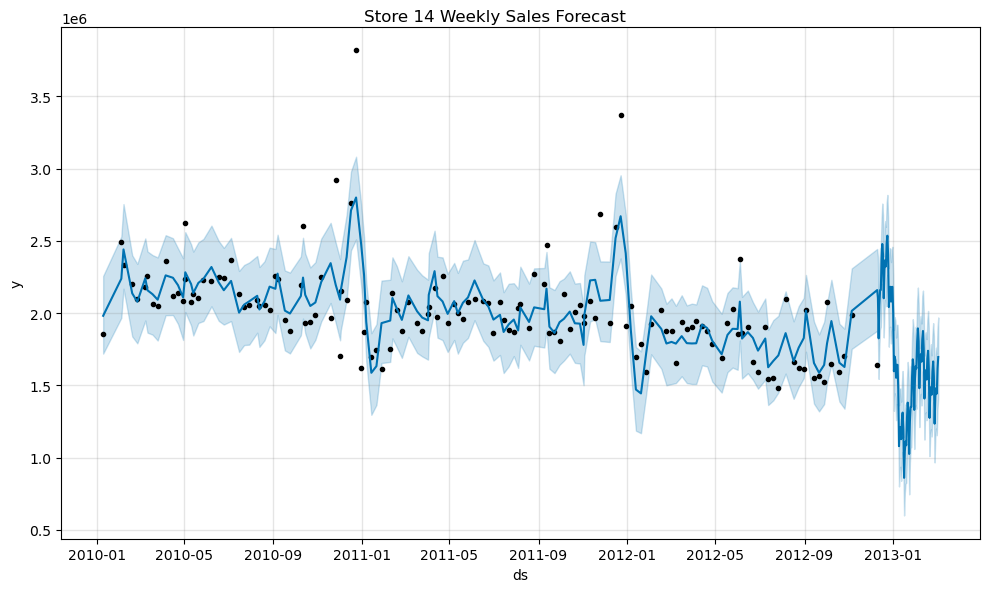

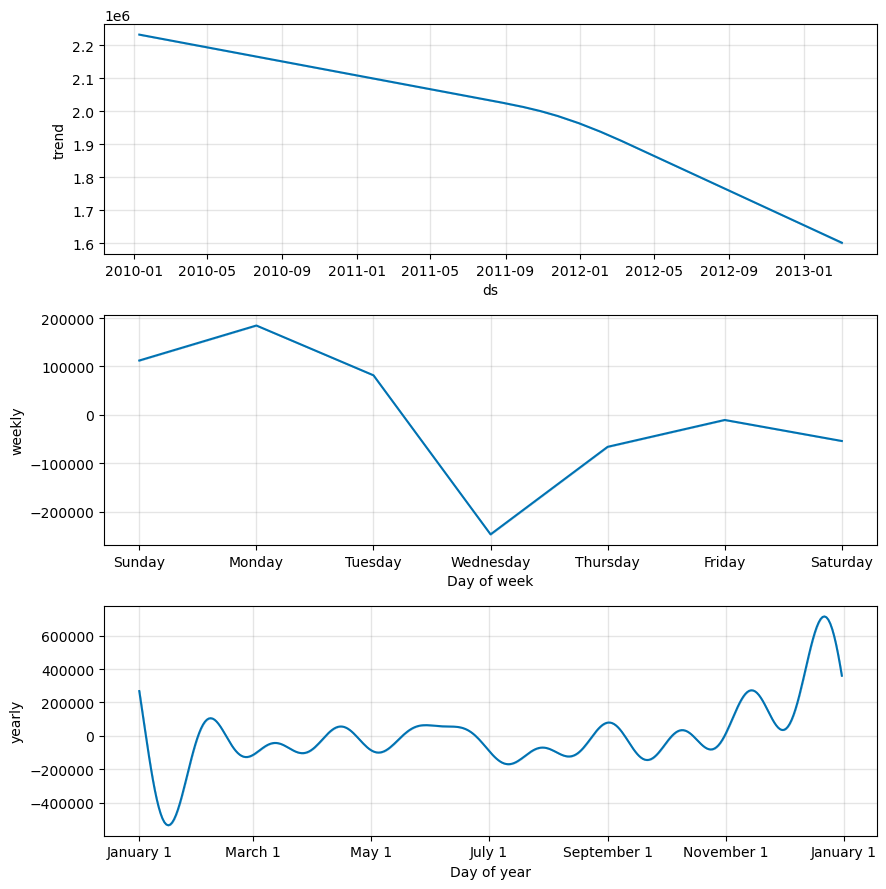

12:48:50 - cmdstanpy - INFO - Chain [1] start processing
12:48:50 - cmdstanpy - INFO - Chain [1] done processing


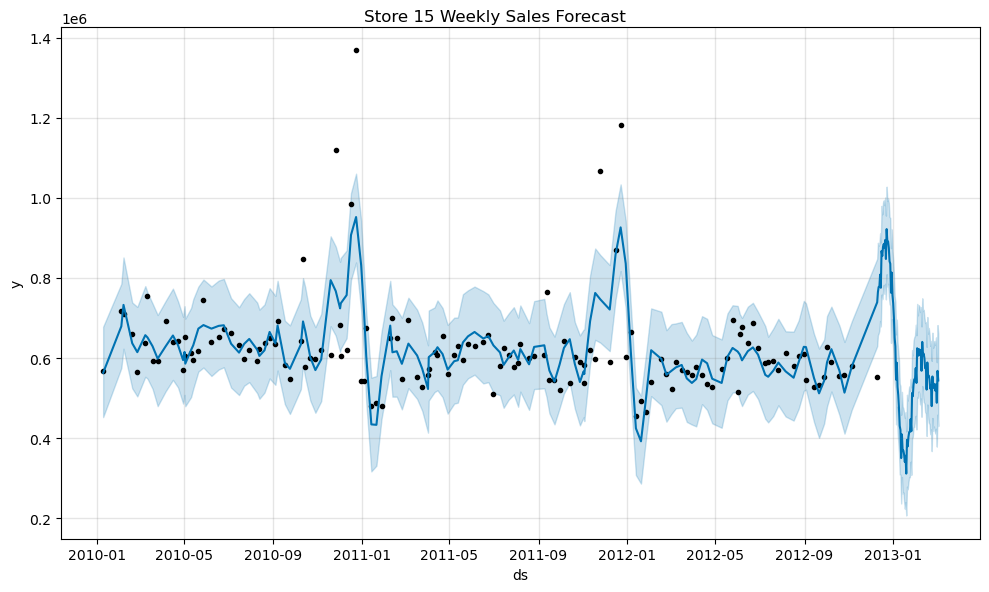

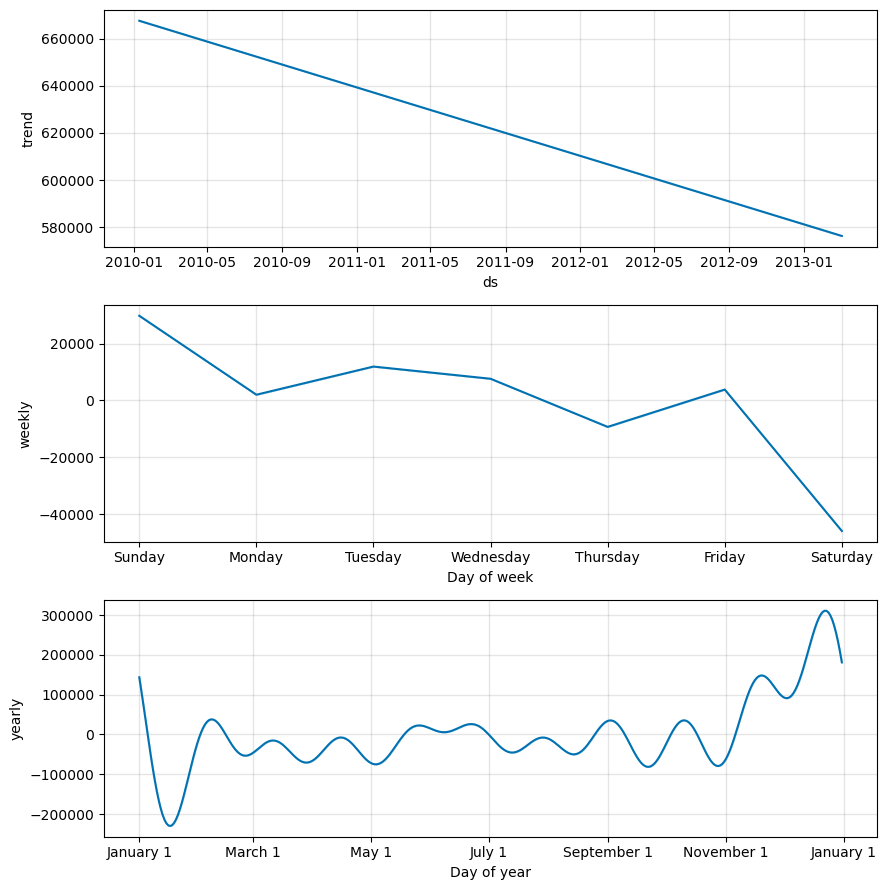

12:48:52 - cmdstanpy - INFO - Chain [1] start processing
12:48:52 - cmdstanpy - INFO - Chain [1] done processing


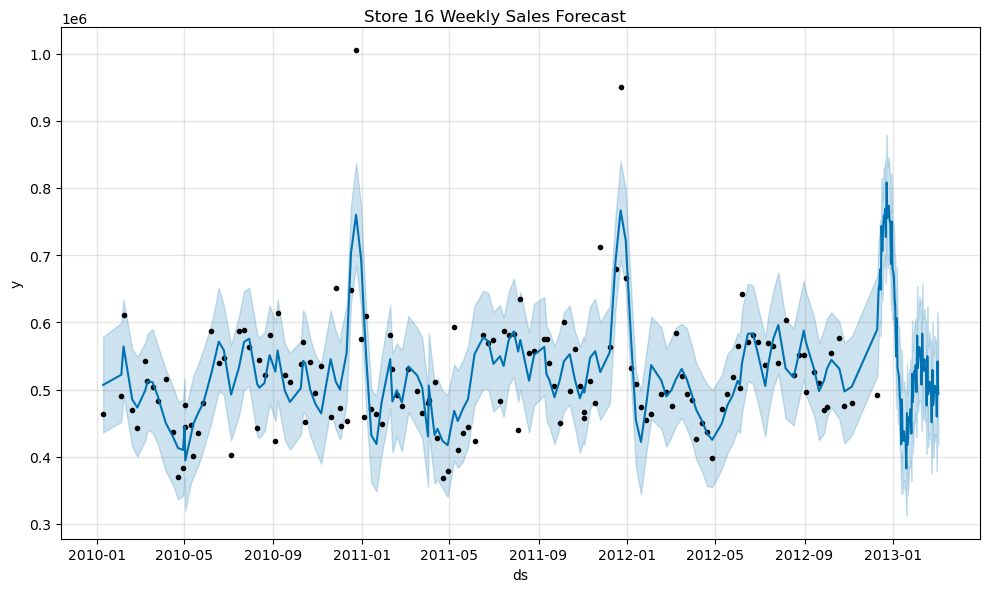

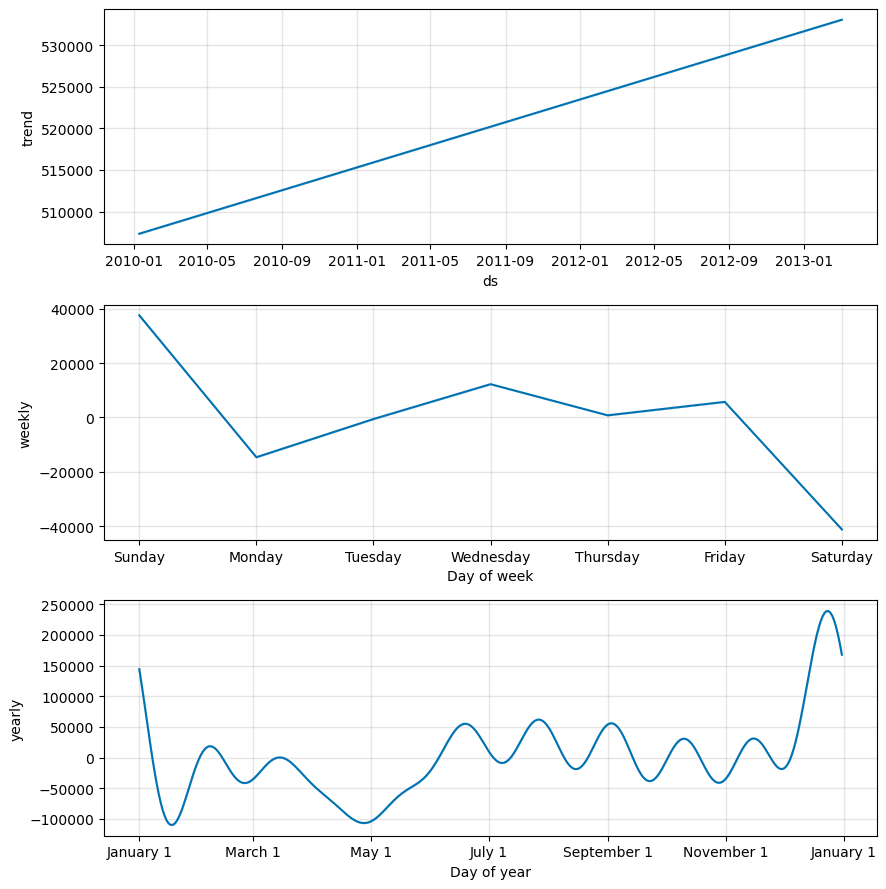

12:48:54 - cmdstanpy - INFO - Chain [1] start processing
12:48:54 - cmdstanpy - INFO - Chain [1] done processing


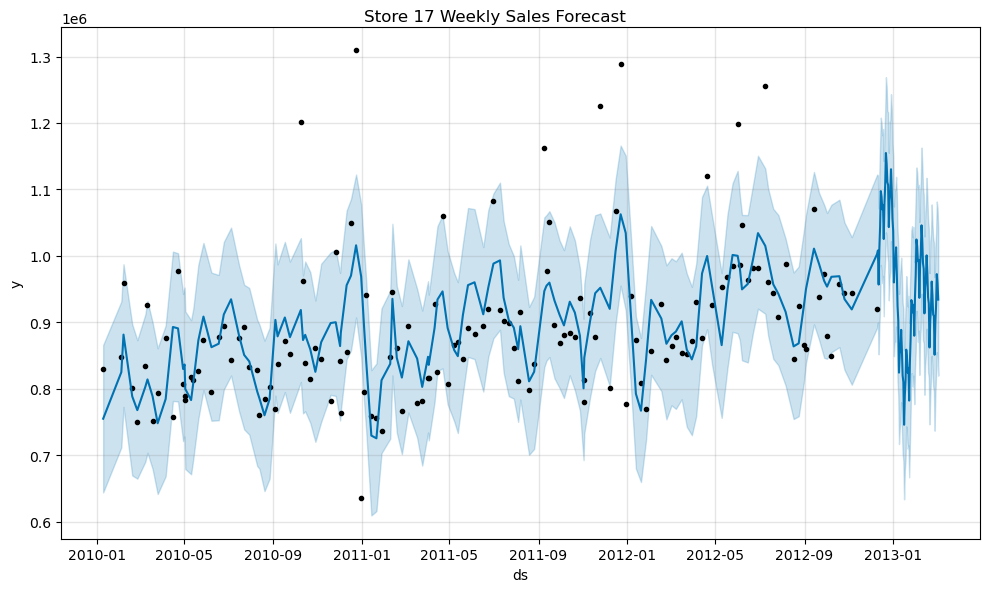

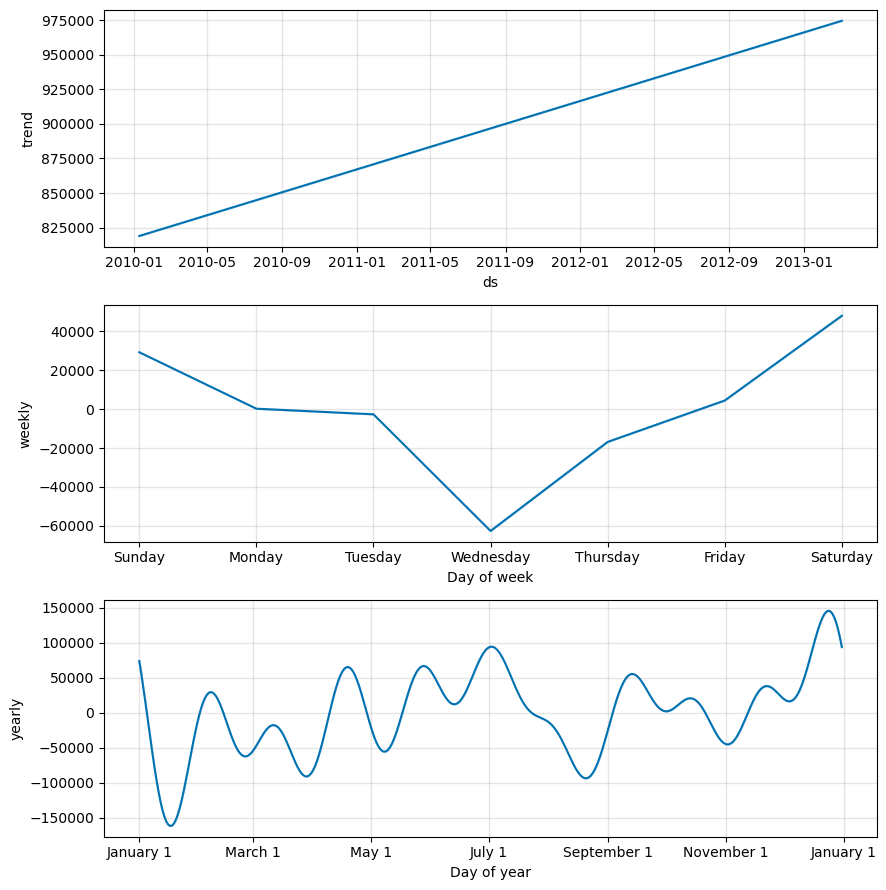

12:48:56 - cmdstanpy - INFO - Chain [1] start processing
12:48:56 - cmdstanpy - INFO - Chain [1] done processing


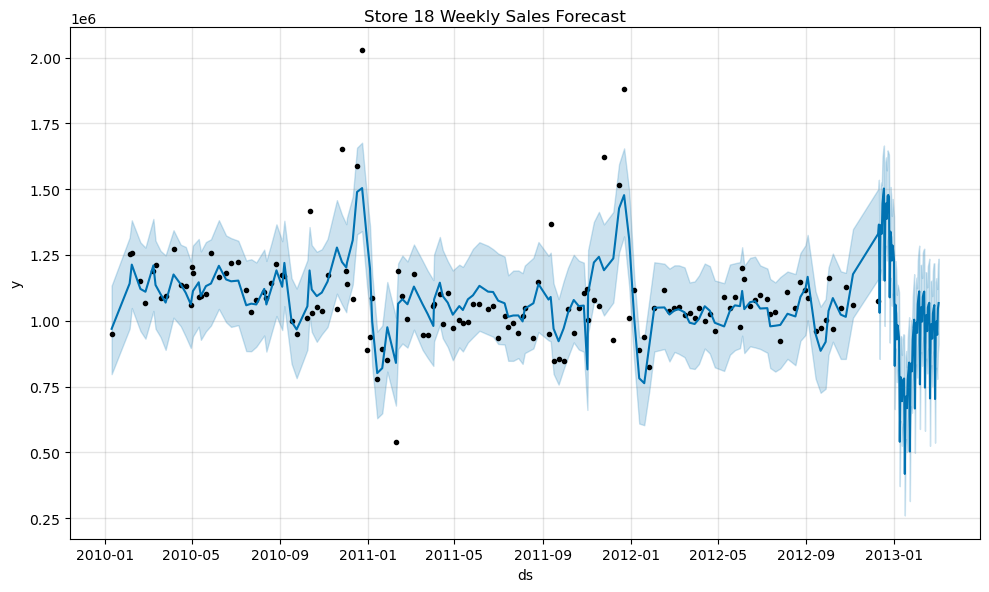

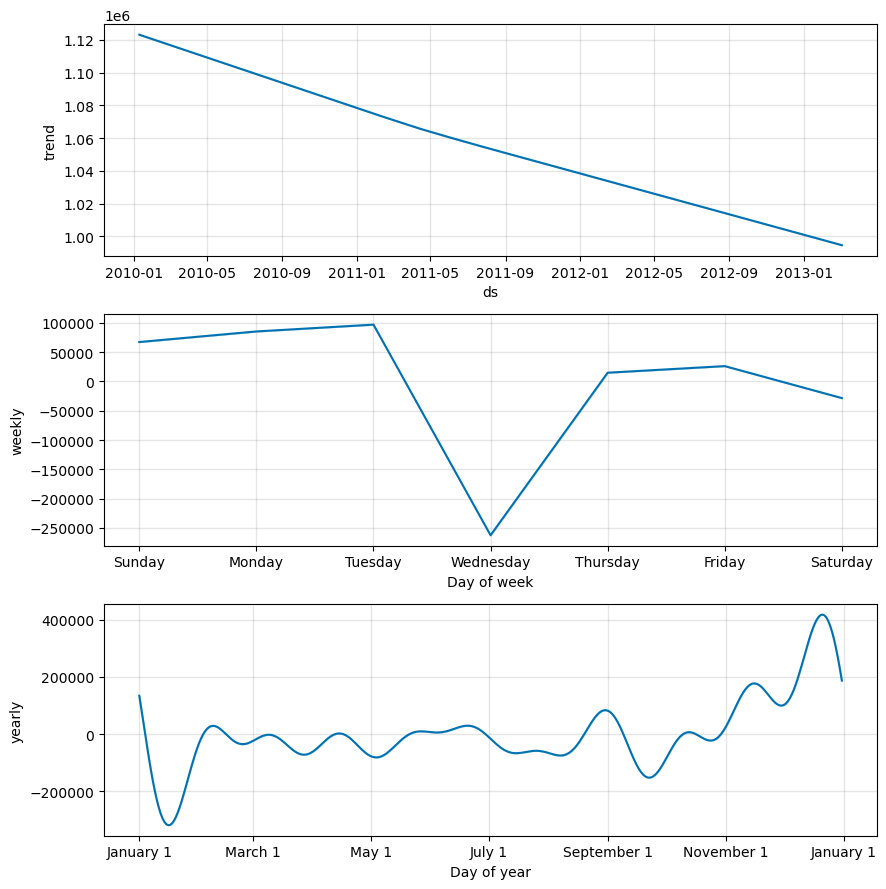

12:48:58 - cmdstanpy - INFO - Chain [1] start processing
12:48:58 - cmdstanpy - INFO - Chain [1] done processing


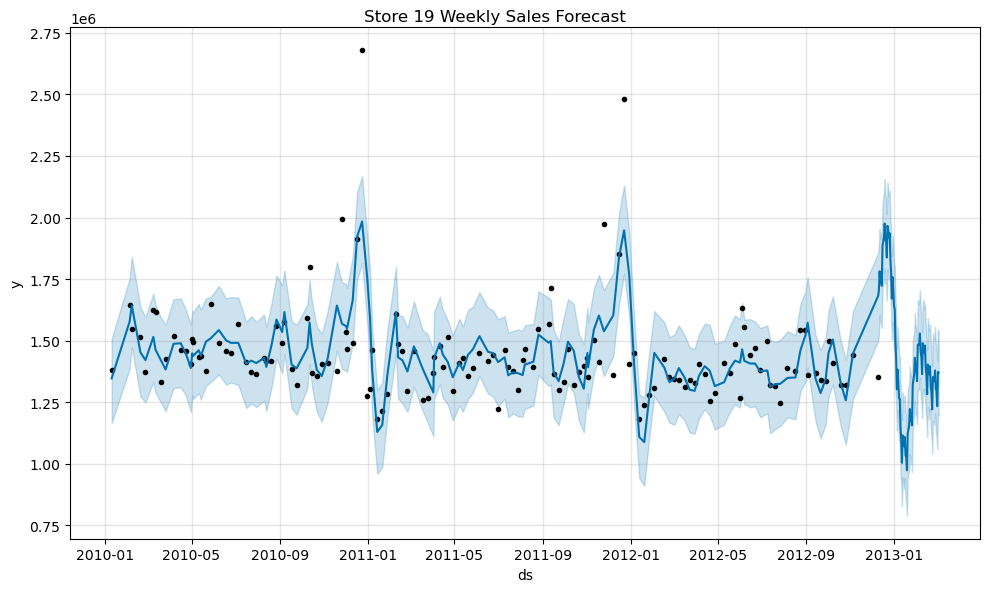

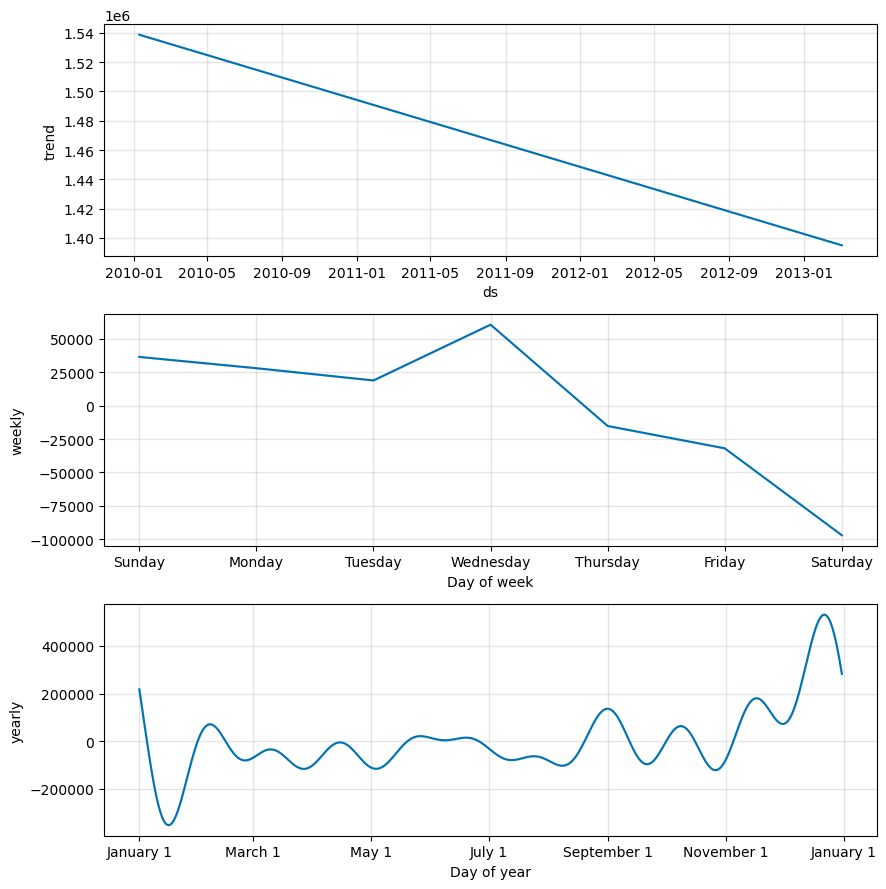

12:48:59 - cmdstanpy - INFO - Chain [1] start processing
12:48:59 - cmdstanpy - INFO - Chain [1] done processing


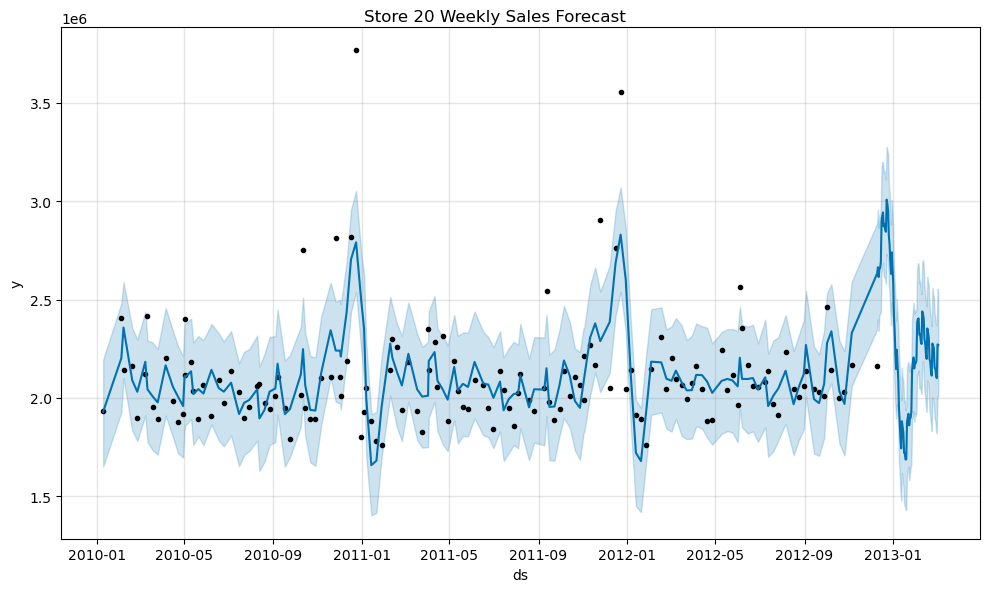

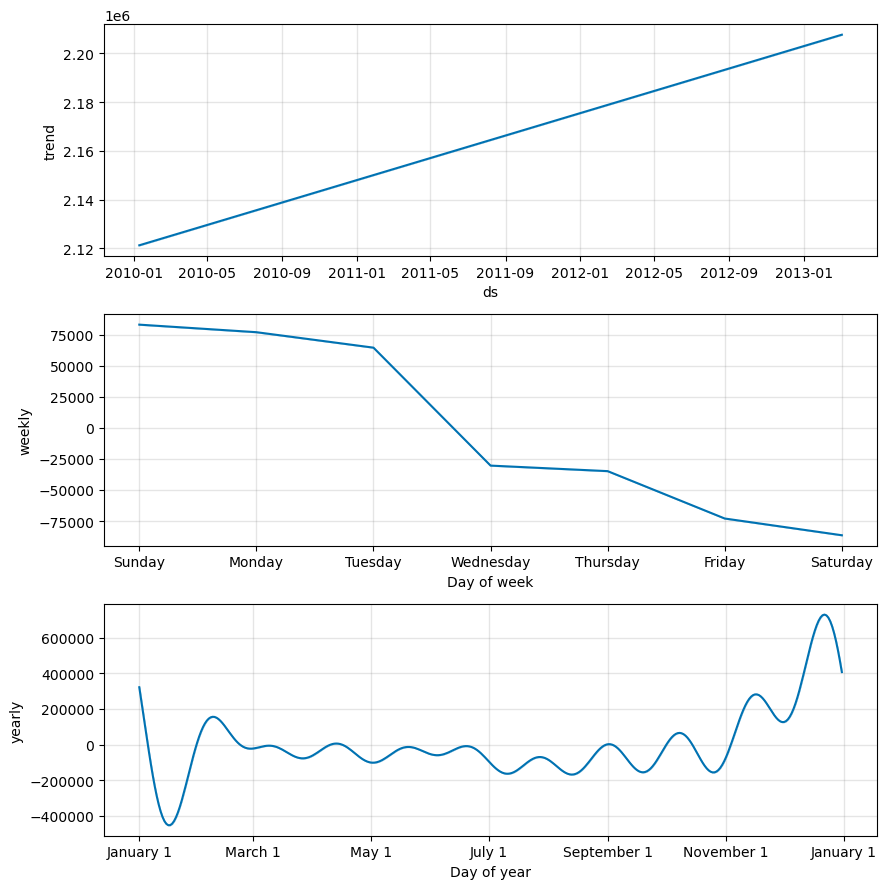

12:49:01 - cmdstanpy - INFO - Chain [1] start processing
12:49:01 - cmdstanpy - INFO - Chain [1] done processing


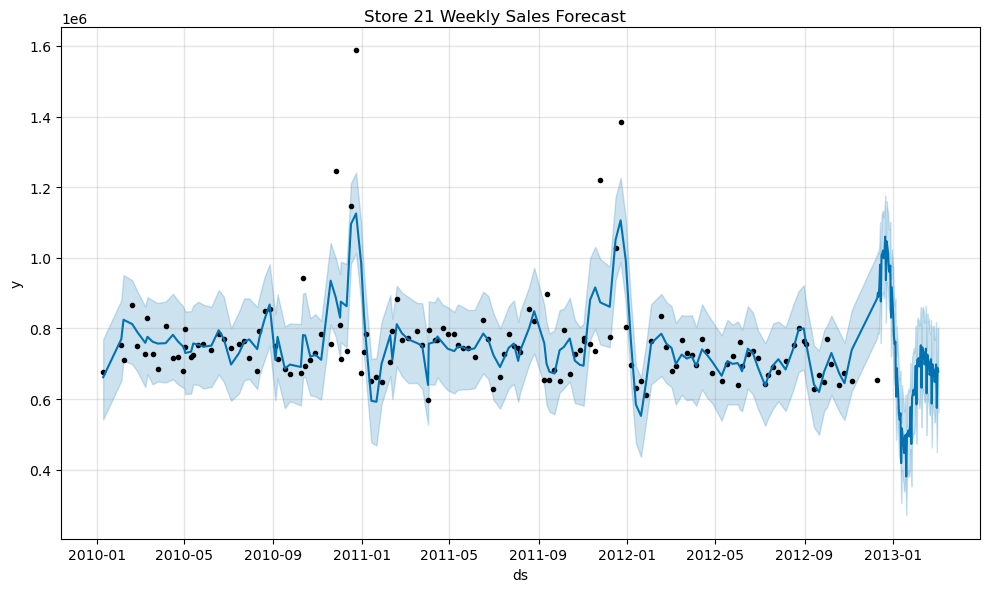

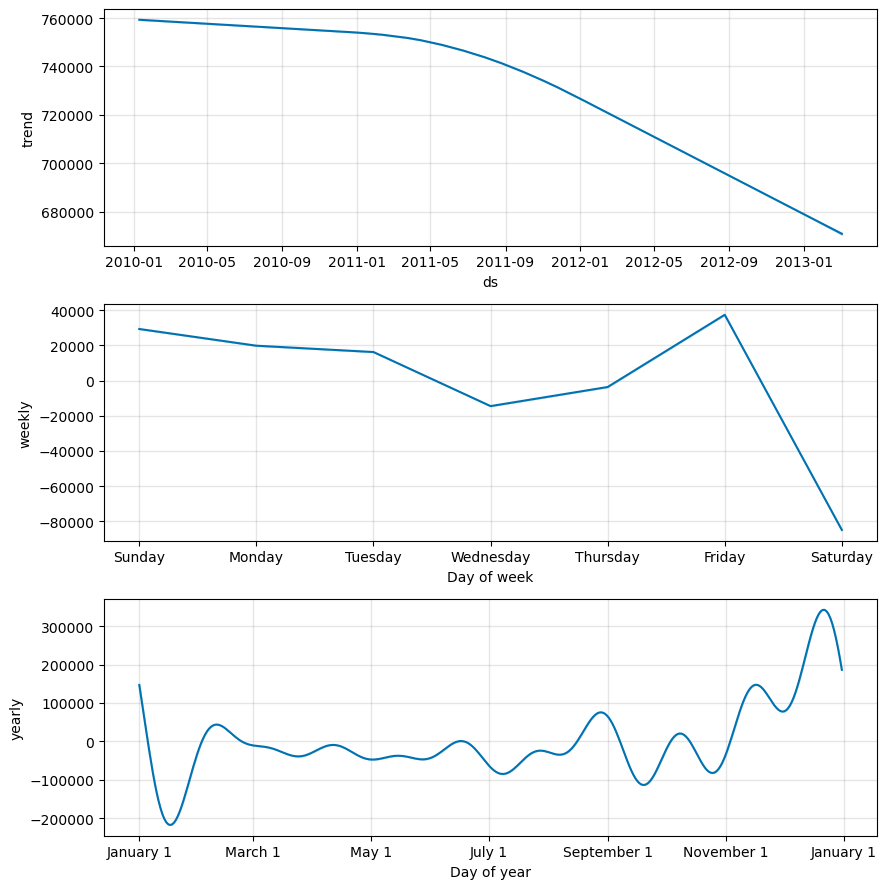

12:49:03 - cmdstanpy - INFO - Chain [1] start processing
12:49:03 - cmdstanpy - INFO - Chain [1] done processing


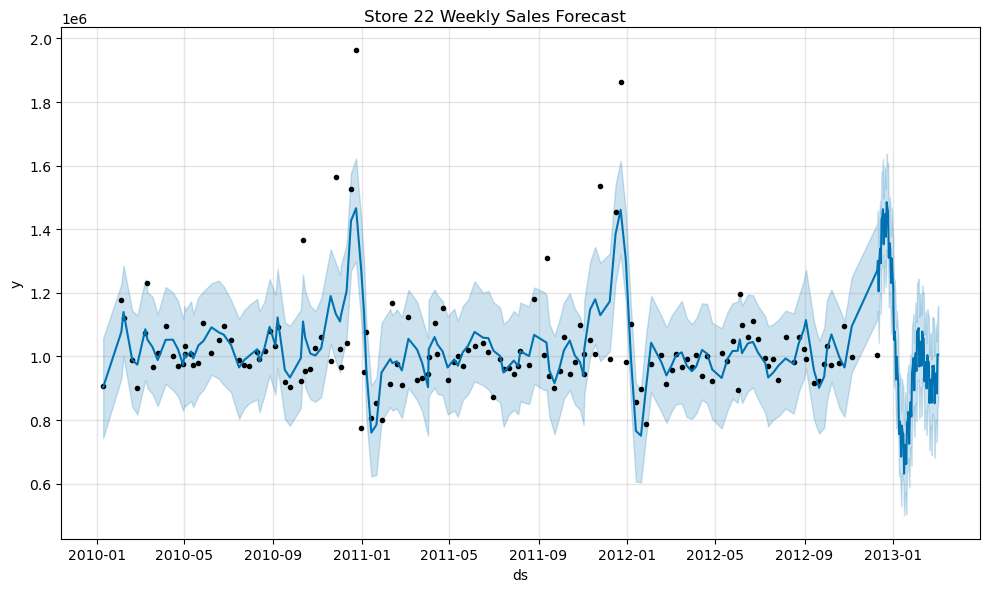

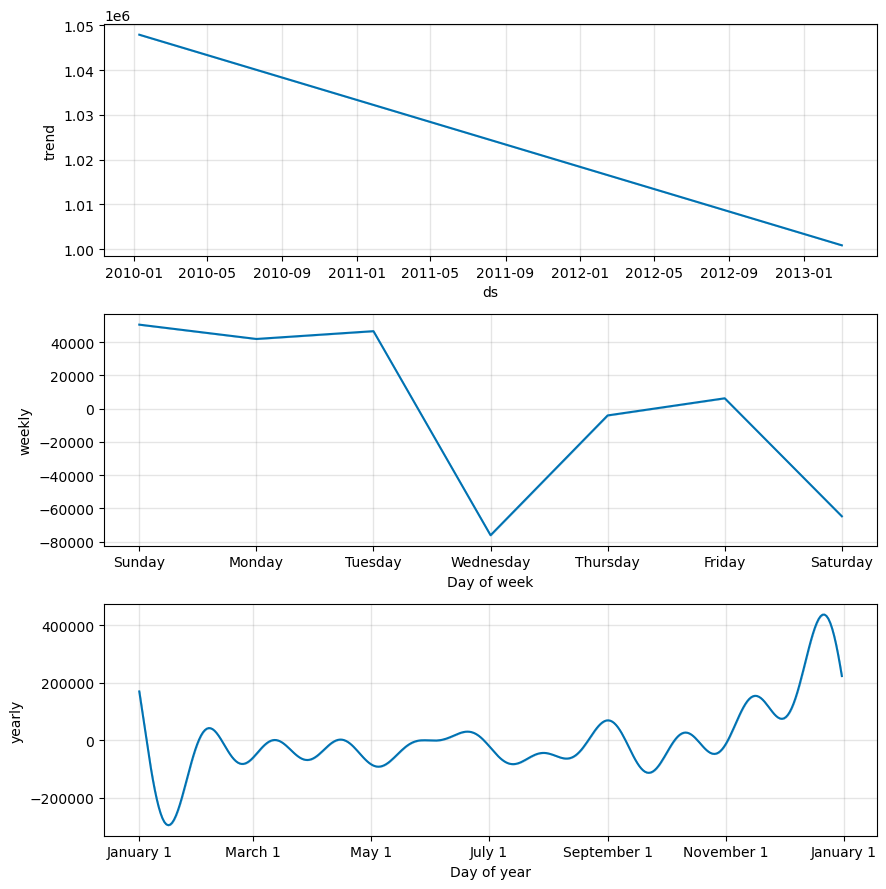

12:49:05 - cmdstanpy - INFO - Chain [1] start processing
12:49:05 - cmdstanpy - INFO - Chain [1] done processing


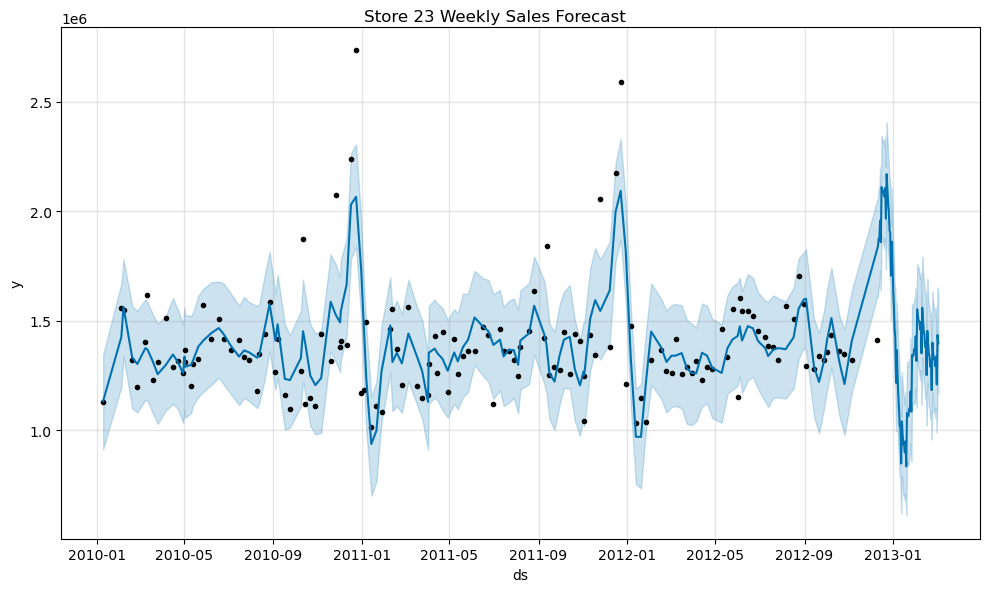

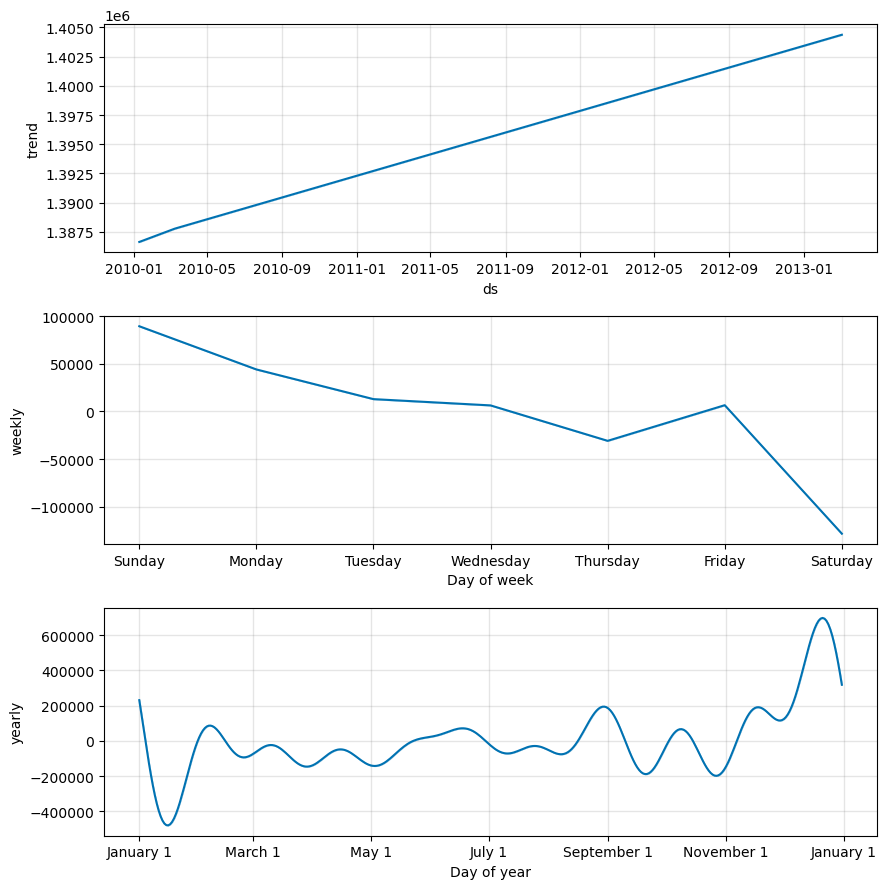

12:49:06 - cmdstanpy - INFO - Chain [1] start processing
12:49:07 - cmdstanpy - INFO - Chain [1] done processing


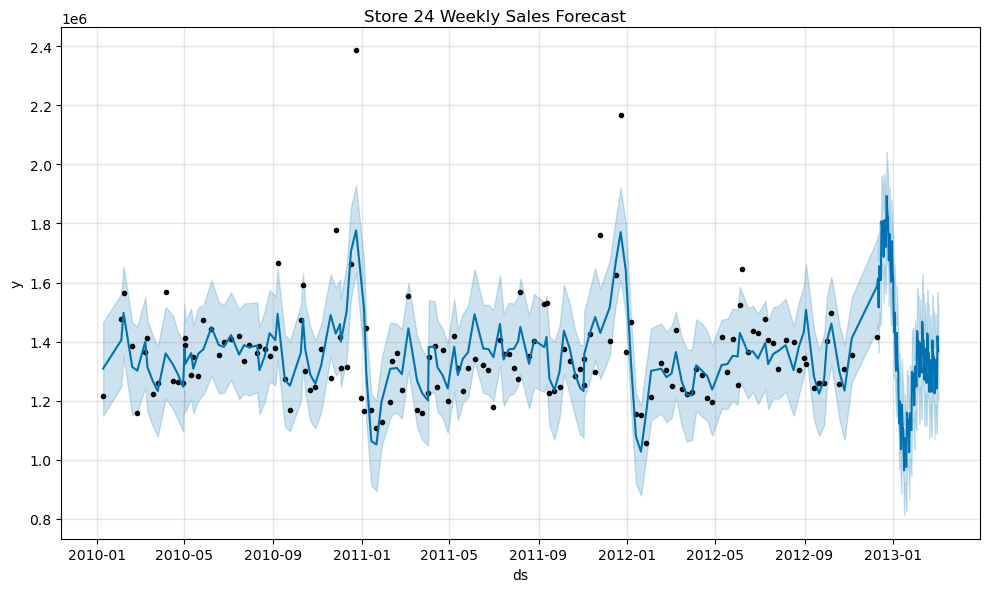

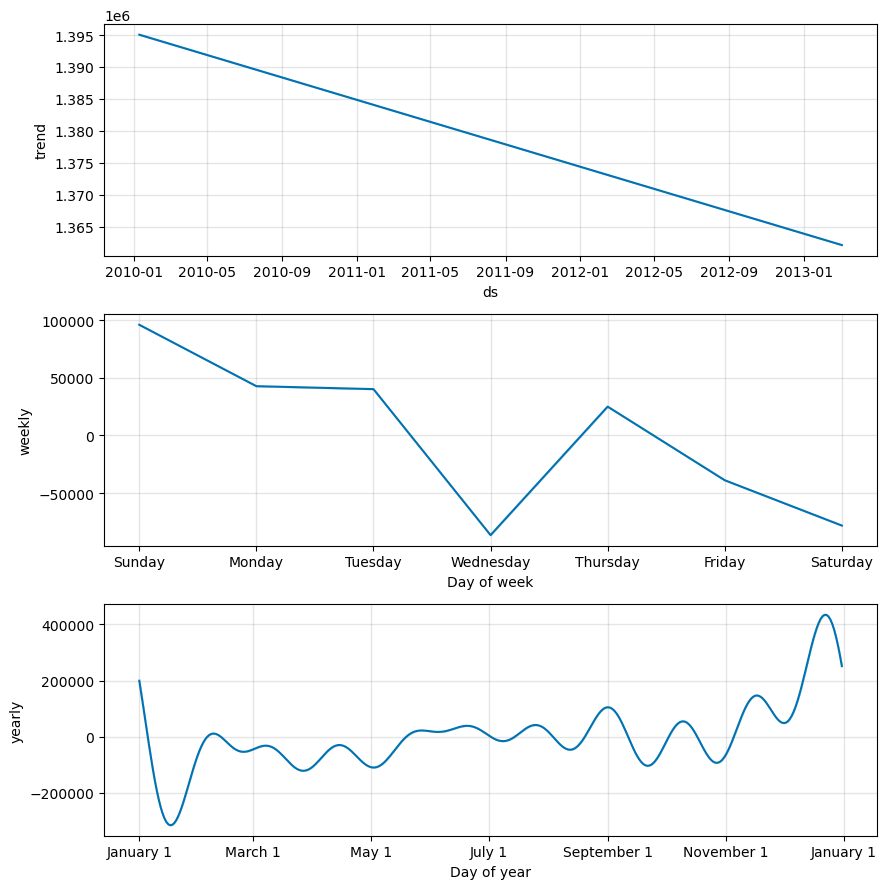

12:49:08 - cmdstanpy - INFO - Chain [1] start processing
12:49:08 - cmdstanpy - INFO - Chain [1] done processing


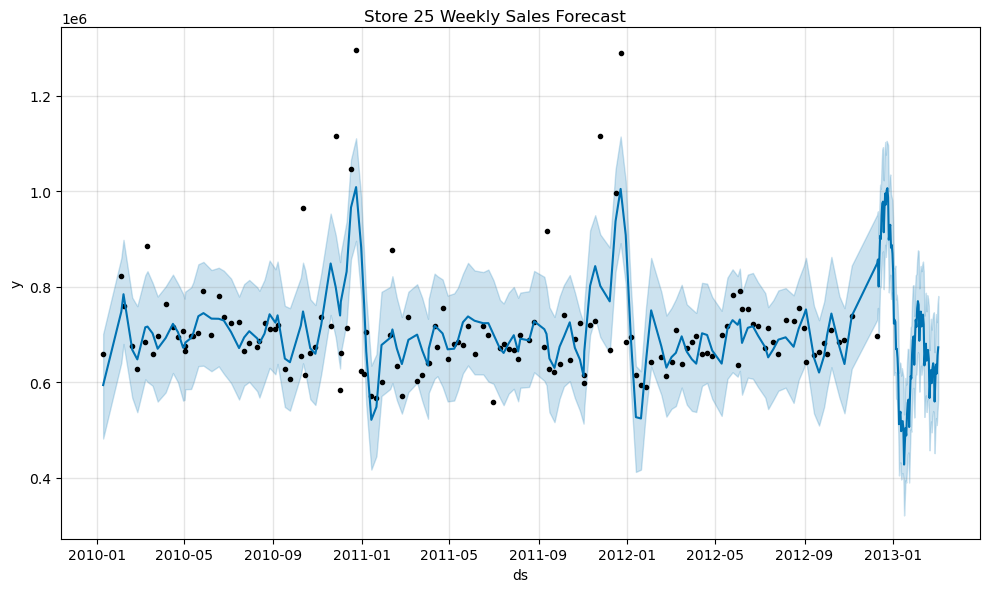

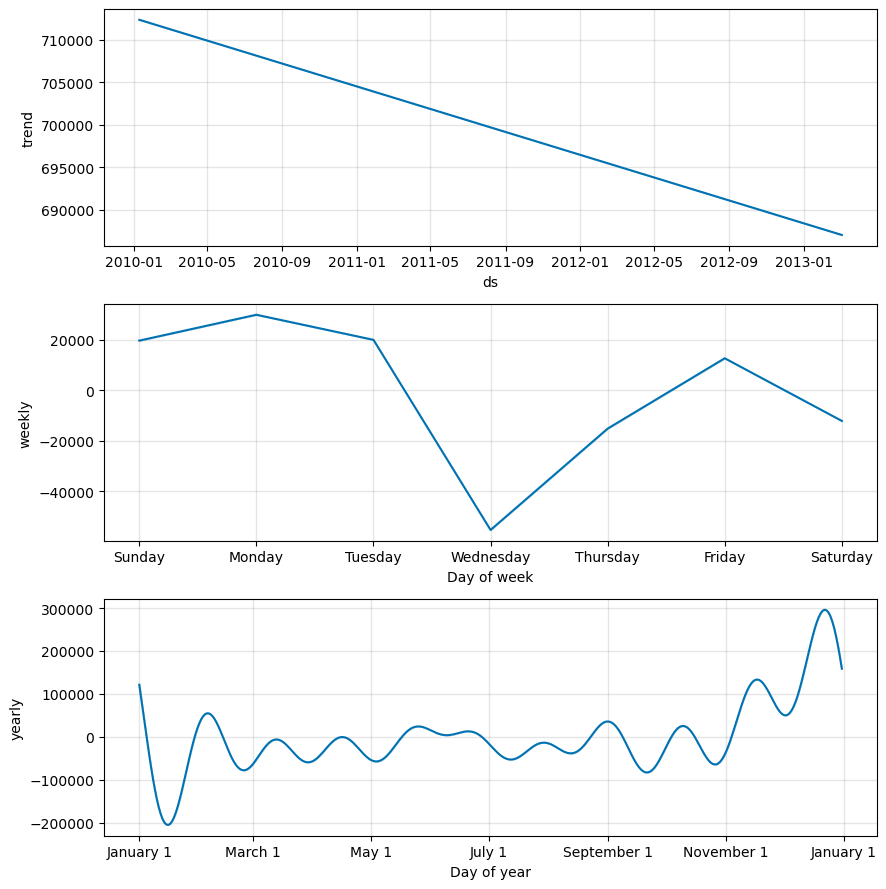

12:49:10 - cmdstanpy - INFO - Chain [1] start processing
12:49:10 - cmdstanpy - INFO - Chain [1] done processing


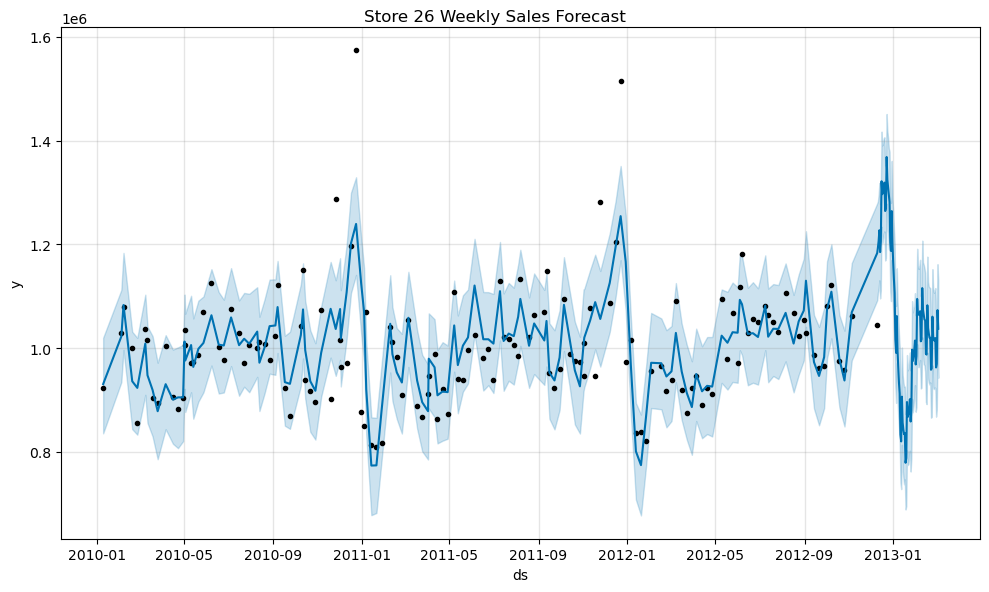

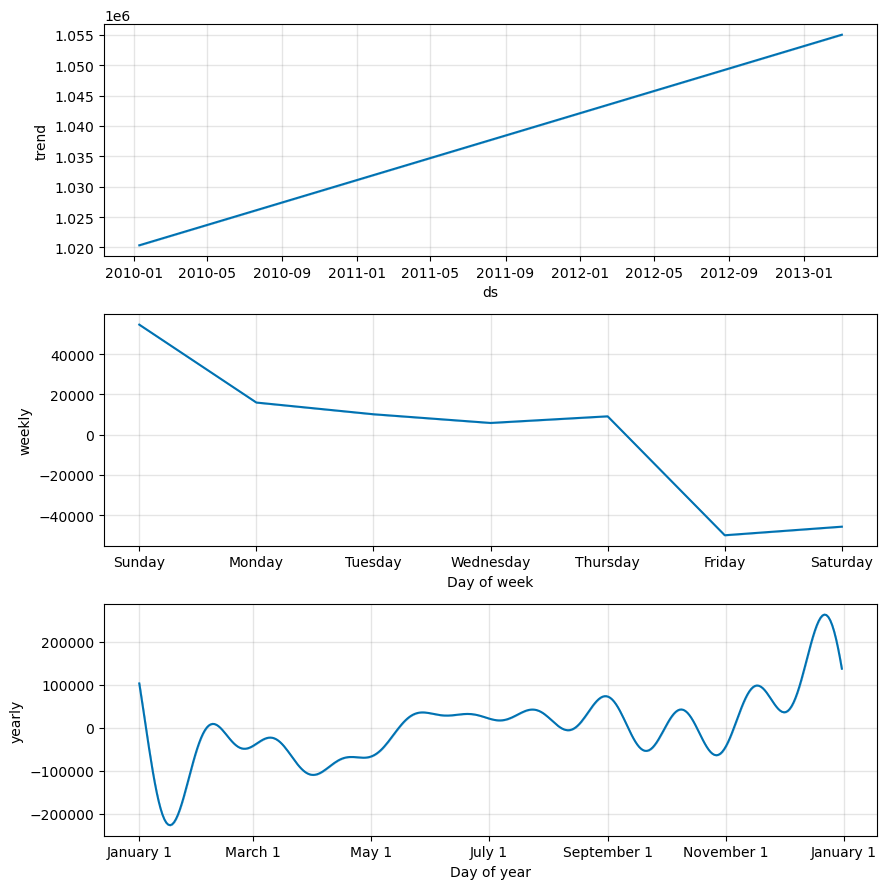

12:49:12 - cmdstanpy - INFO - Chain [1] start processing
12:49:12 - cmdstanpy - INFO - Chain [1] done processing


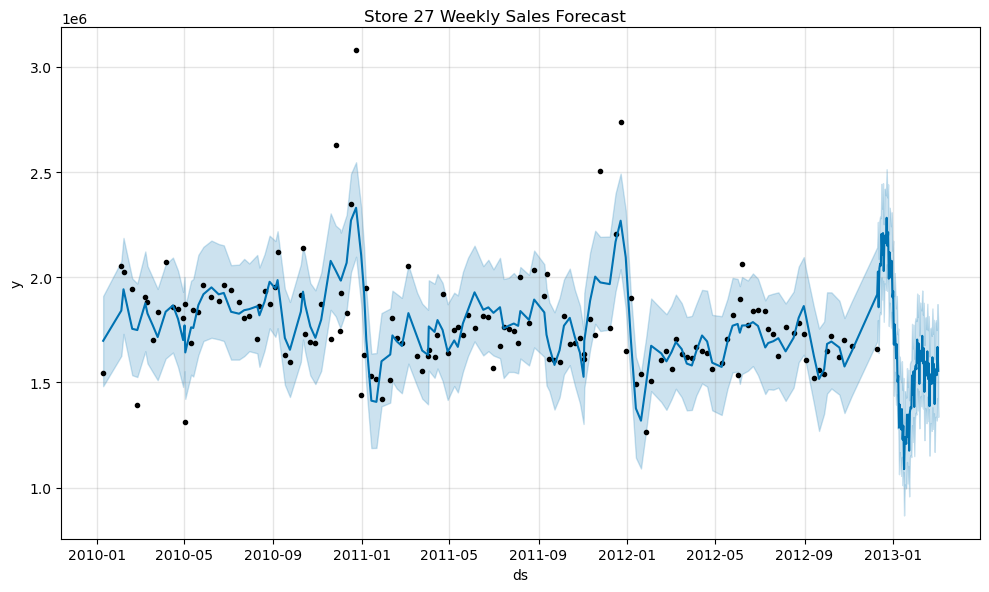

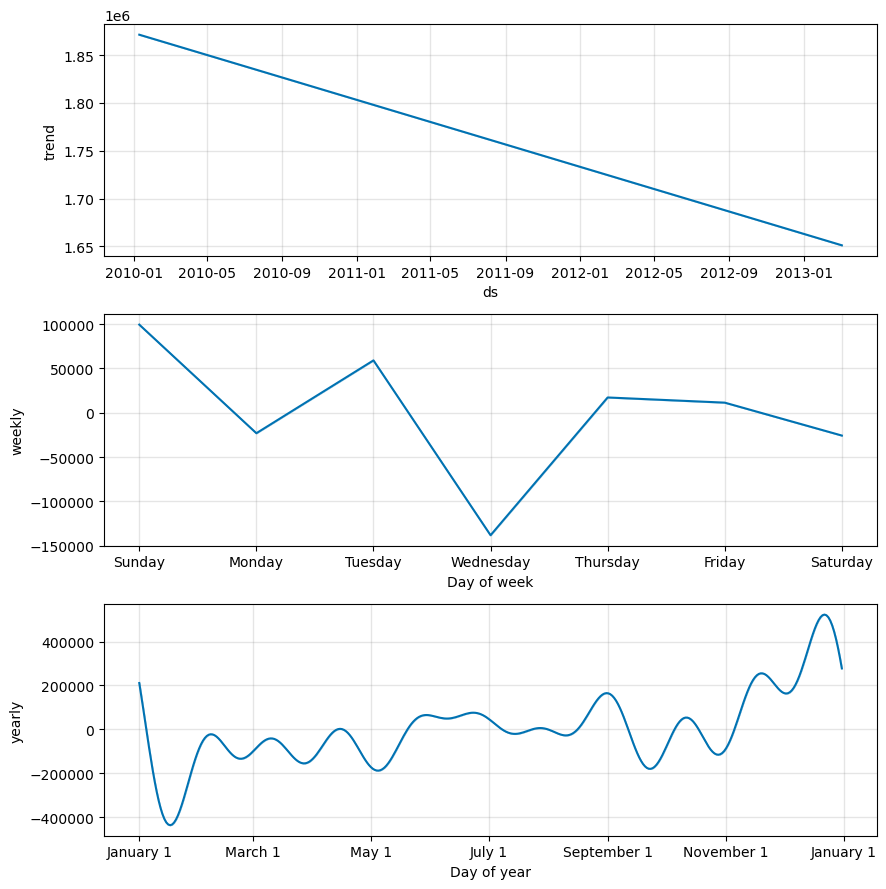

12:49:14 - cmdstanpy - INFO - Chain [1] start processing
12:49:14 - cmdstanpy - INFO - Chain [1] done processing


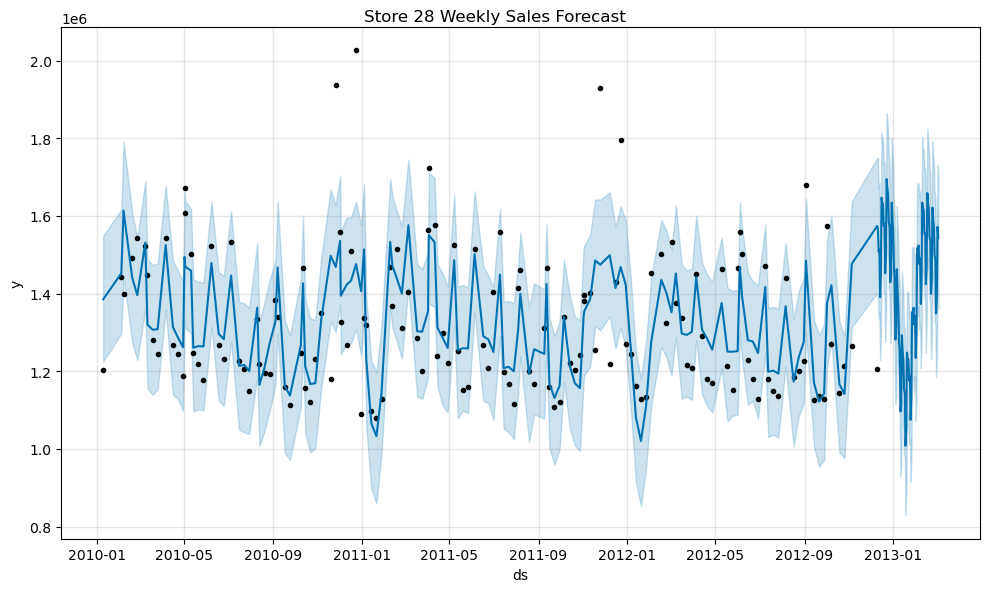

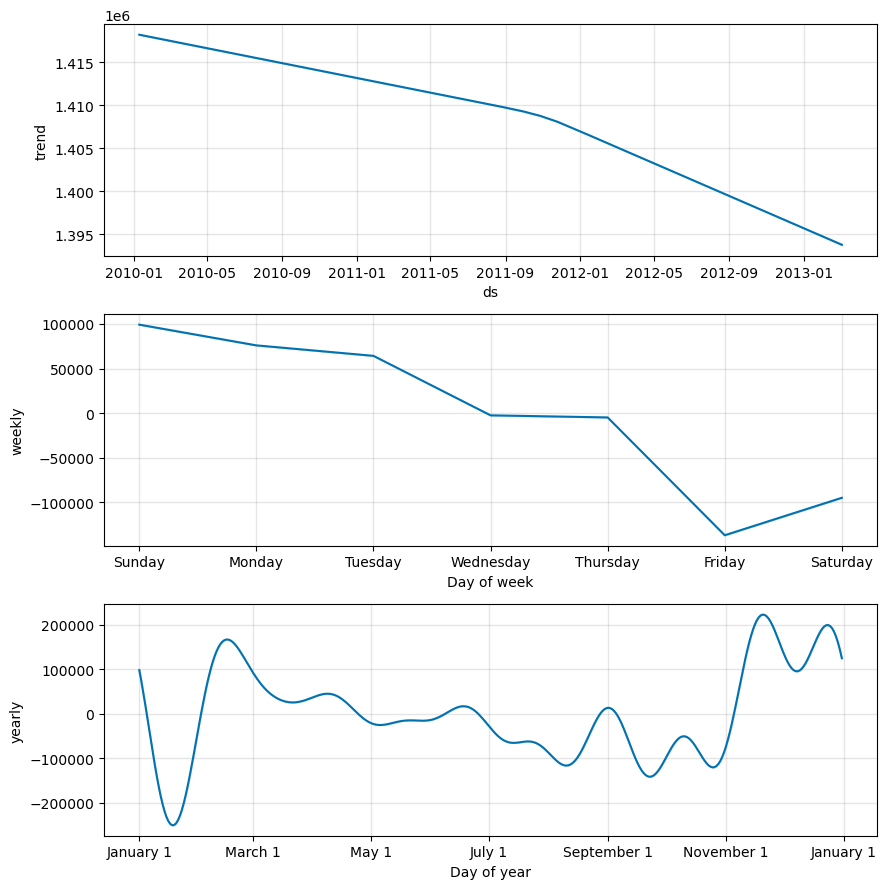

12:49:16 - cmdstanpy - INFO - Chain [1] start processing
12:49:16 - cmdstanpy - INFO - Chain [1] done processing


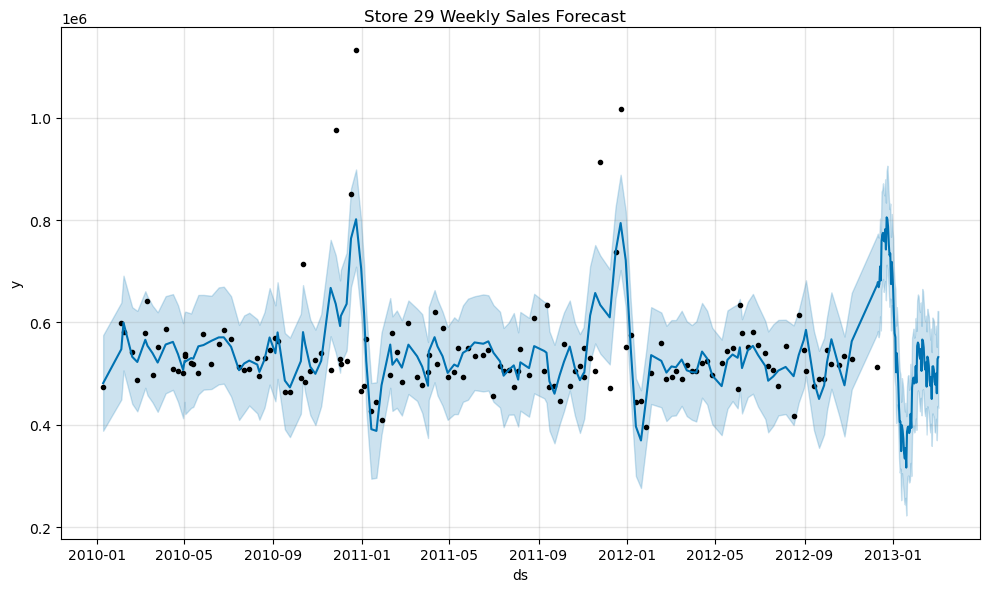

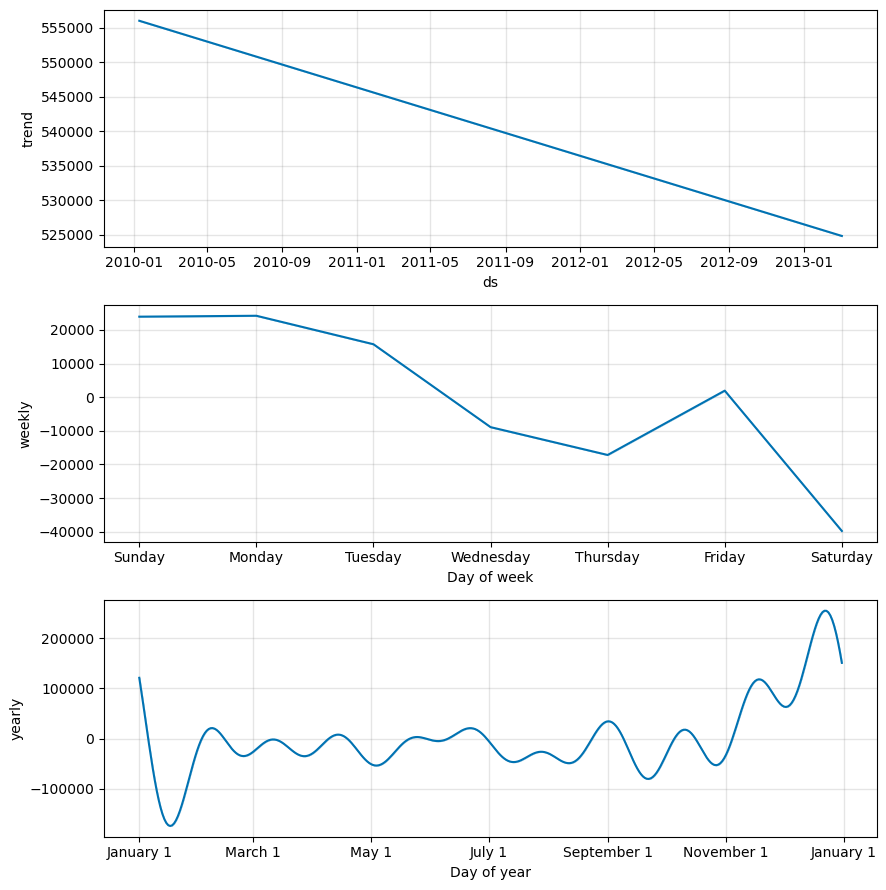

12:49:18 - cmdstanpy - INFO - Chain [1] start processing
12:49:18 - cmdstanpy - INFO - Chain [1] done processing


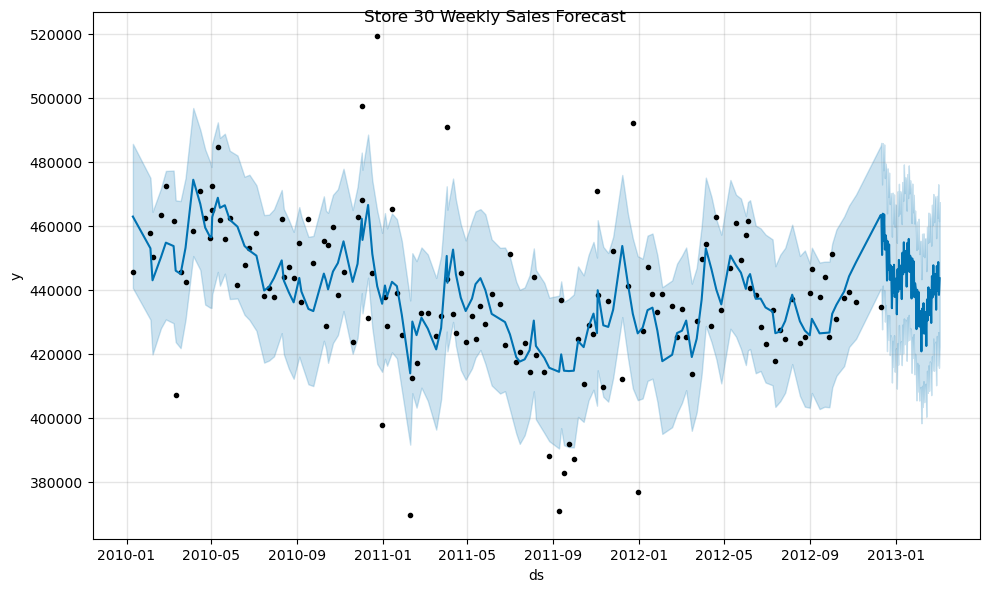

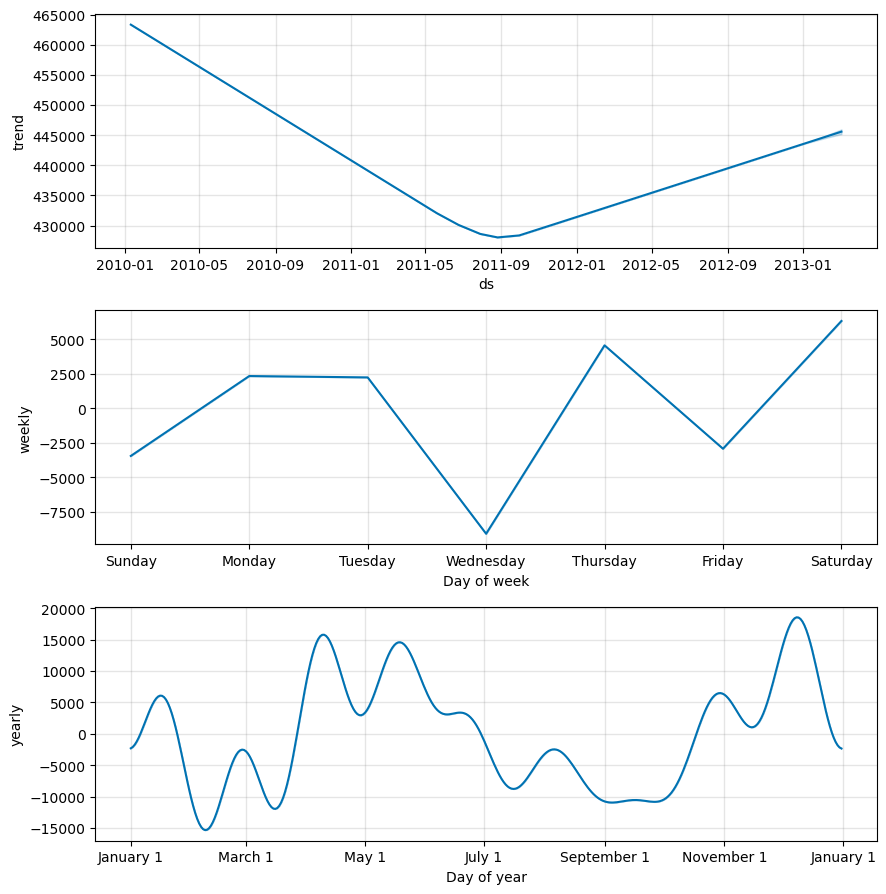

12:49:19 - cmdstanpy - INFO - Chain [1] start processing
12:49:19 - cmdstanpy - INFO - Chain [1] done processing


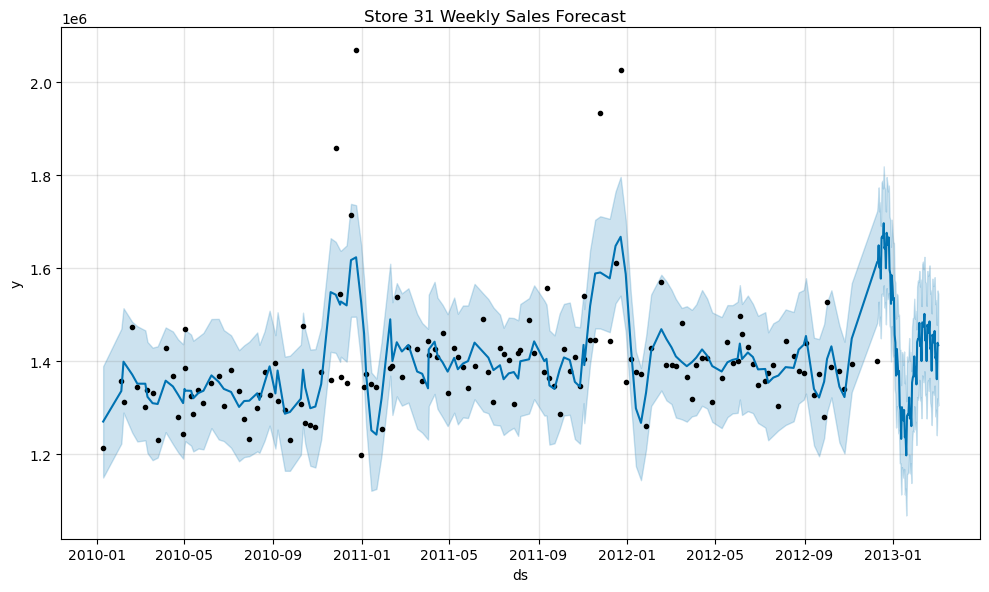

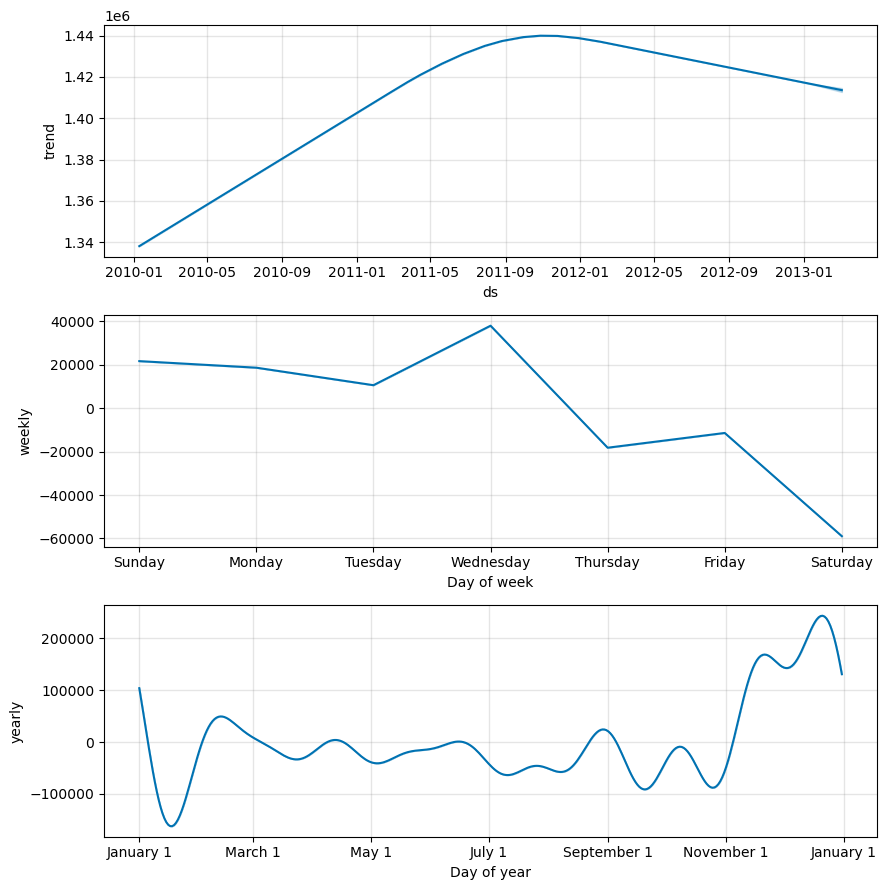

12:49:21 - cmdstanpy - INFO - Chain [1] start processing
12:49:21 - cmdstanpy - INFO - Chain [1] done processing


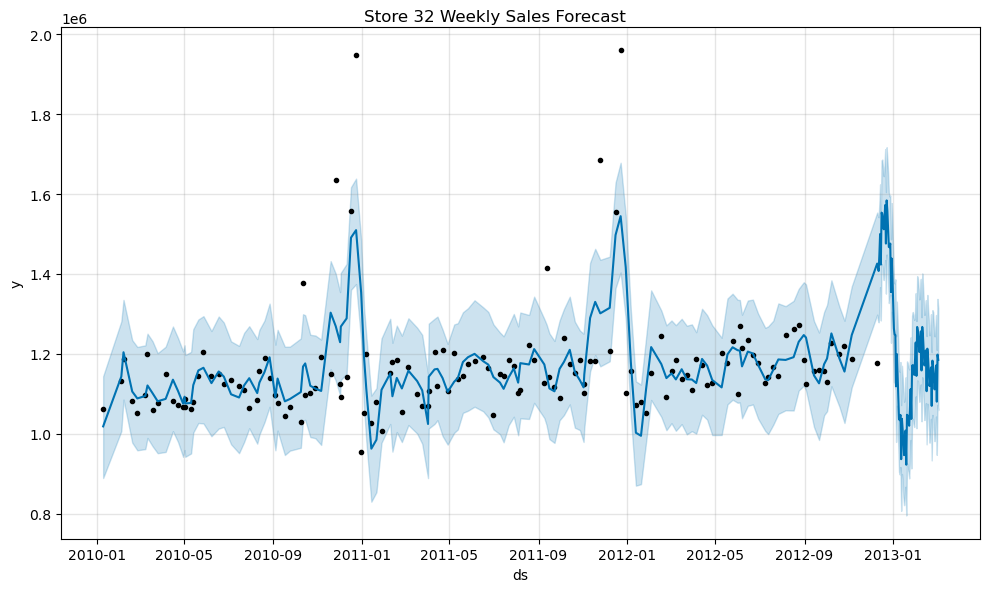

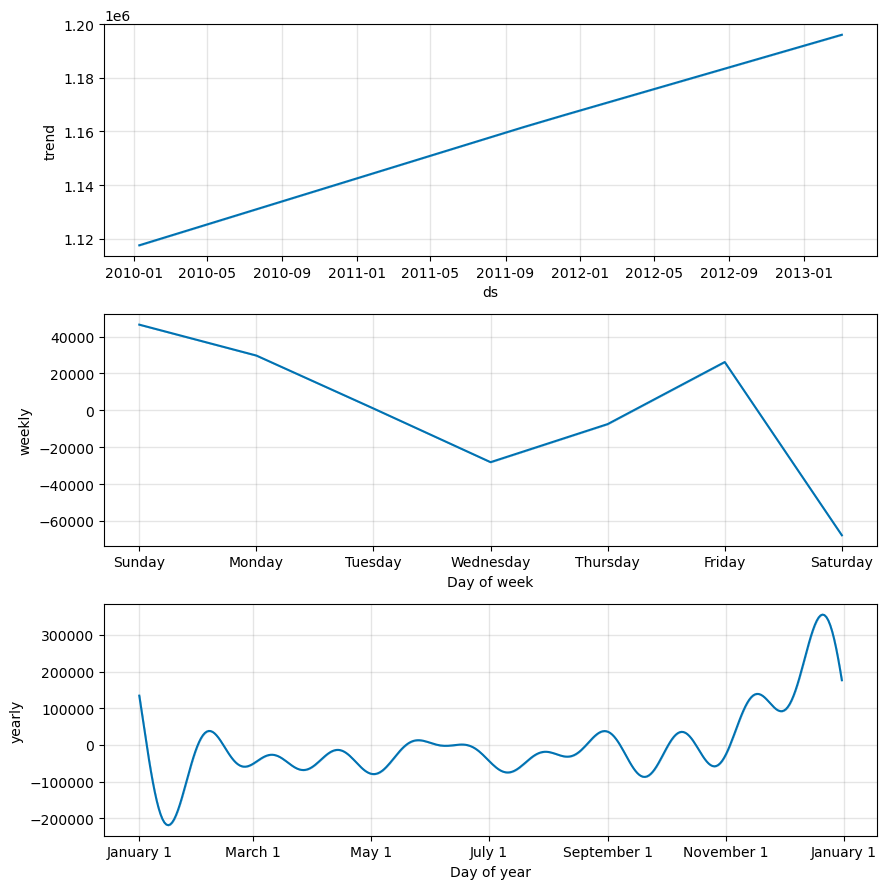

12:49:23 - cmdstanpy - INFO - Chain [1] start processing
12:49:23 - cmdstanpy - INFO - Chain [1] done processing


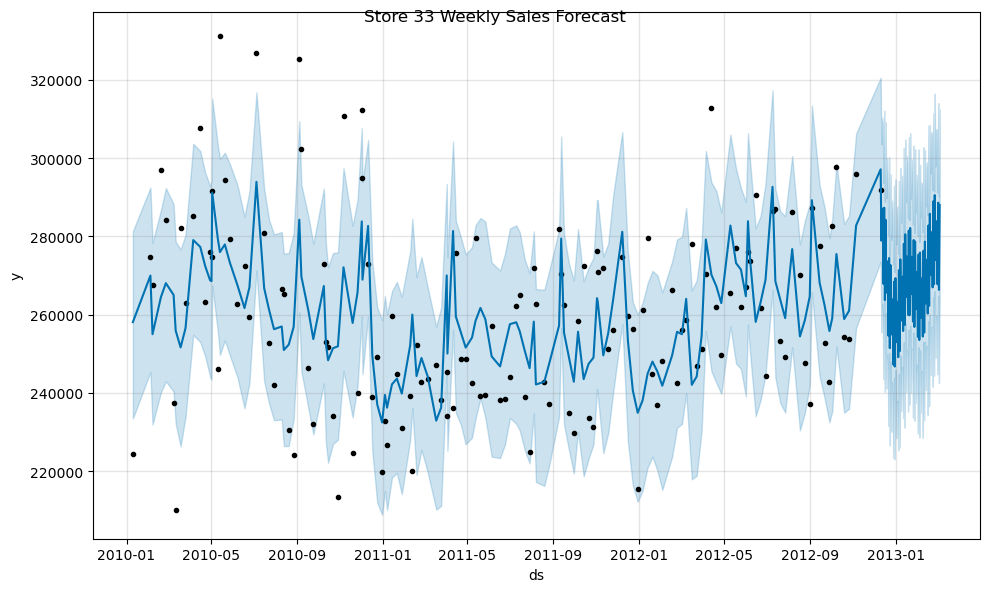

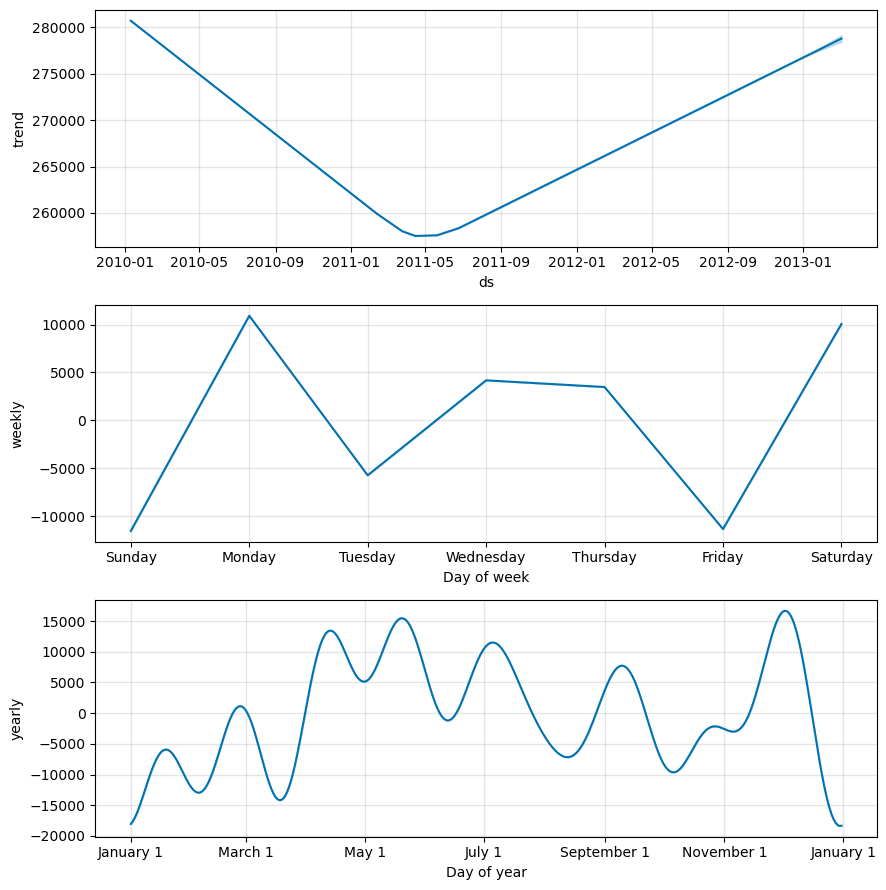

12:49:25 - cmdstanpy - INFO - Chain [1] start processing
12:49:25 - cmdstanpy - INFO - Chain [1] done processing


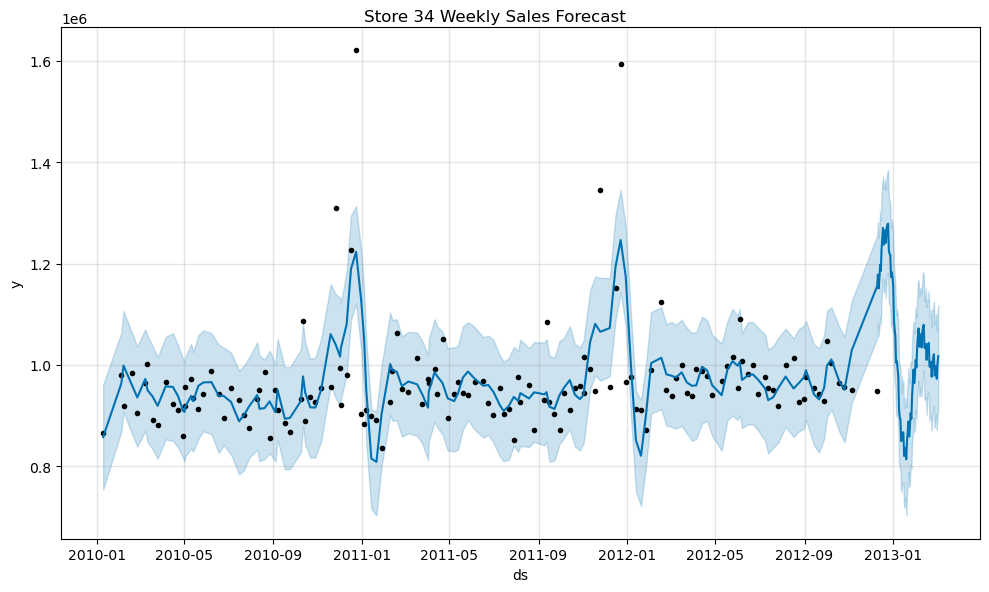

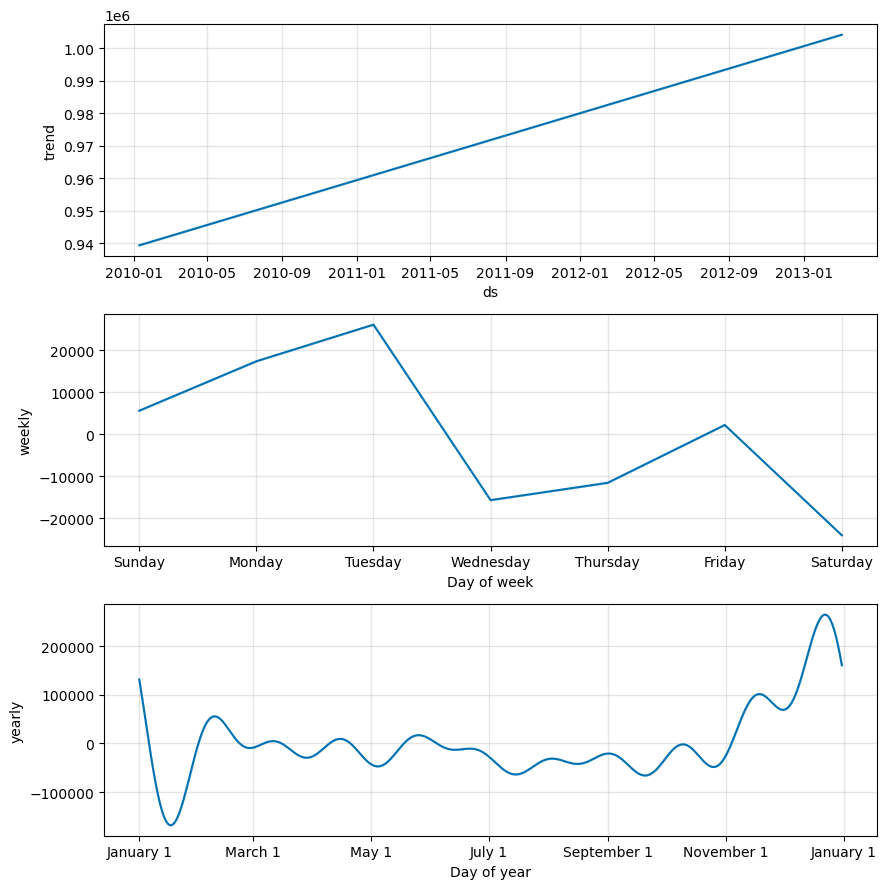

12:49:27 - cmdstanpy - INFO - Chain [1] start processing
12:49:27 - cmdstanpy - INFO - Chain [1] done processing


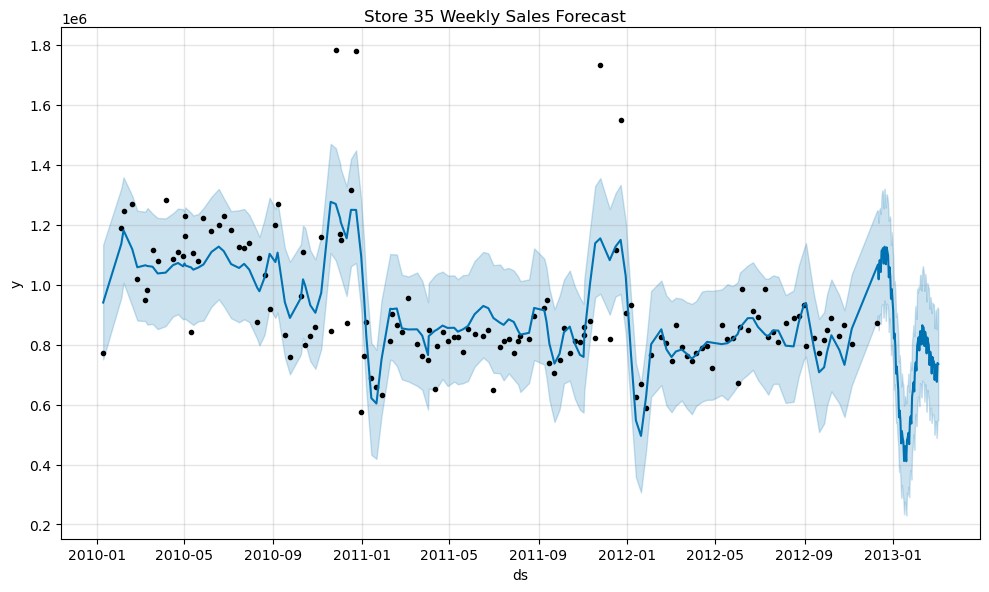

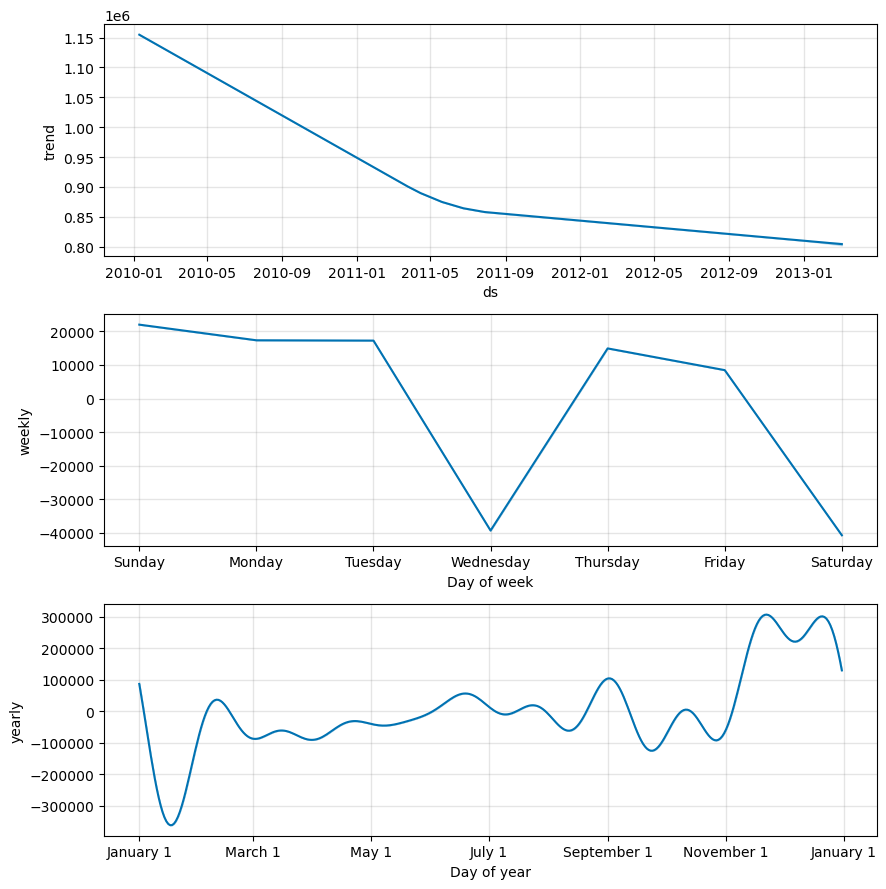

12:49:29 - cmdstanpy - INFO - Chain [1] start processing
12:49:29 - cmdstanpy - INFO - Chain [1] done processing


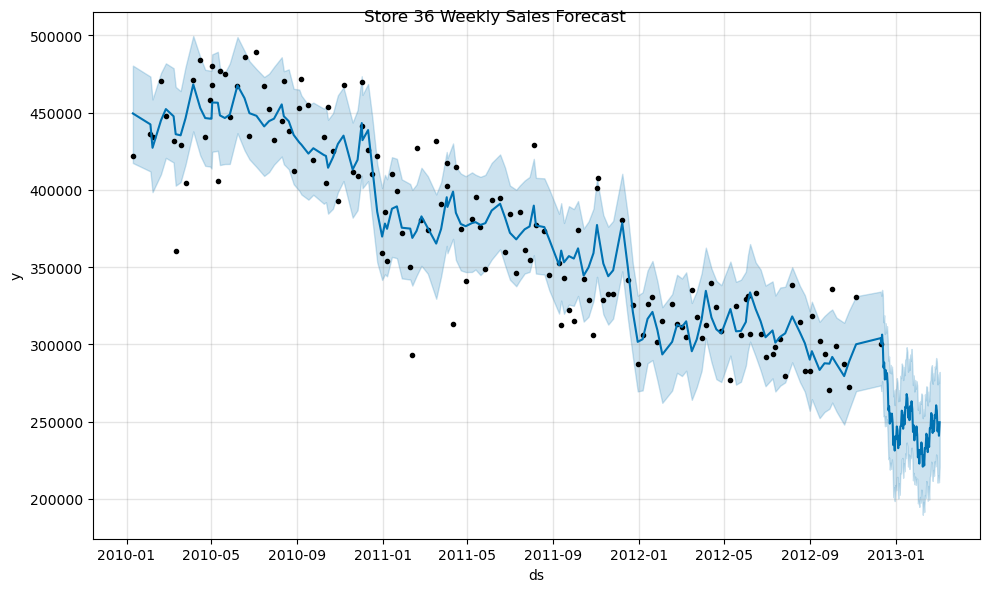

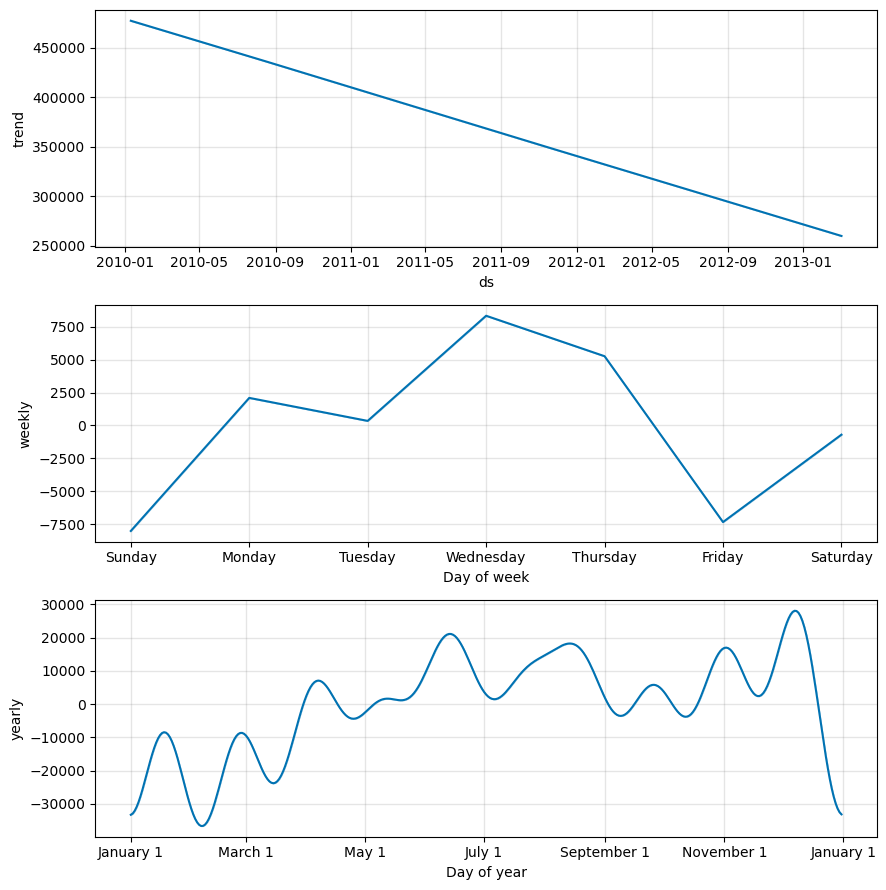

12:49:31 - cmdstanpy - INFO - Chain [1] start processing
12:49:31 - cmdstanpy - INFO - Chain [1] done processing


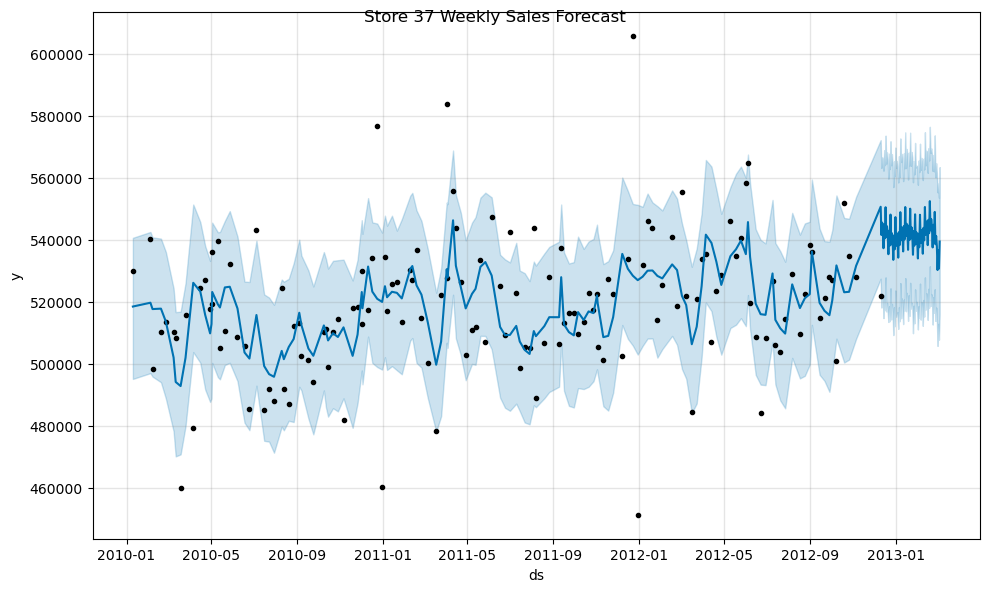

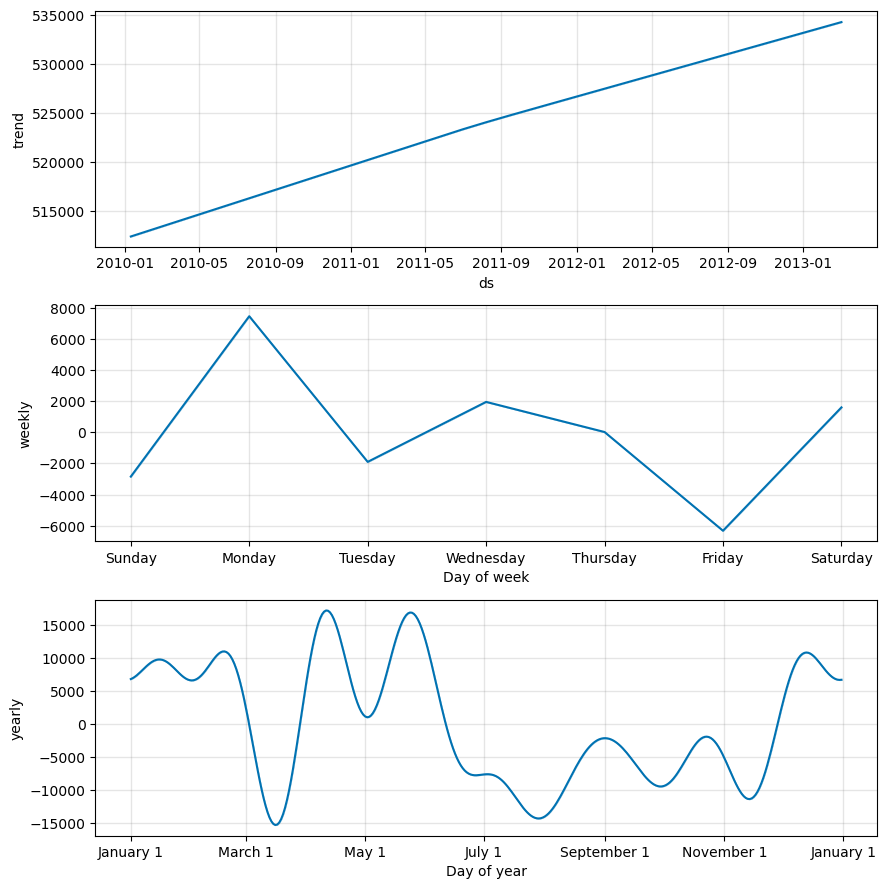

12:49:33 - cmdstanpy - INFO - Chain [1] start processing
12:49:33 - cmdstanpy - INFO - Chain [1] done processing


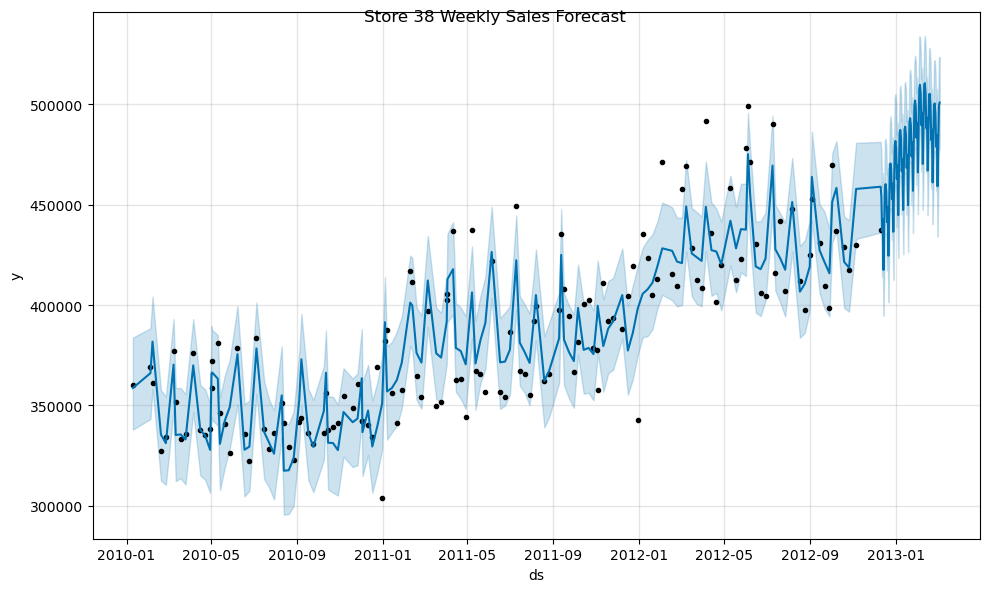

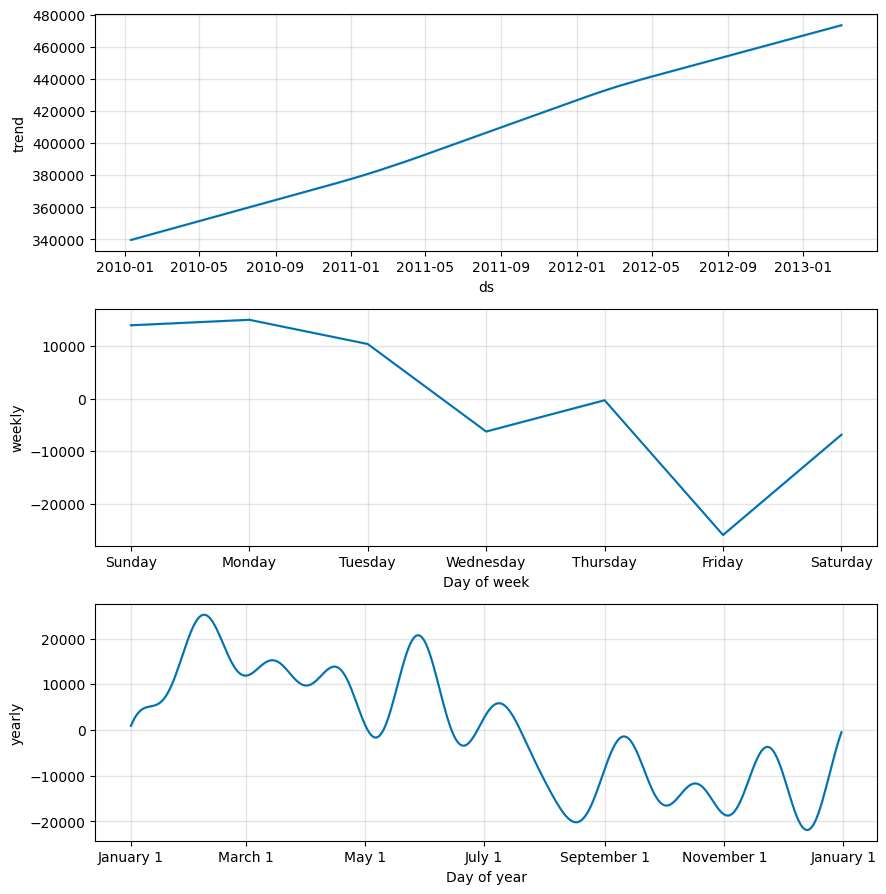

12:49:35 - cmdstanpy - INFO - Chain [1] start processing
12:49:35 - cmdstanpy - INFO - Chain [1] done processing


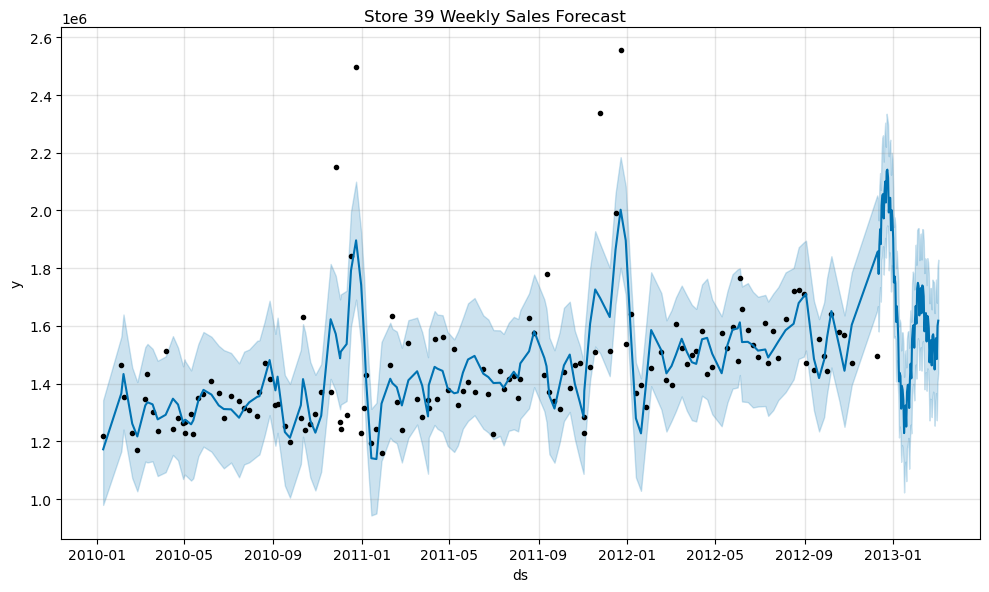

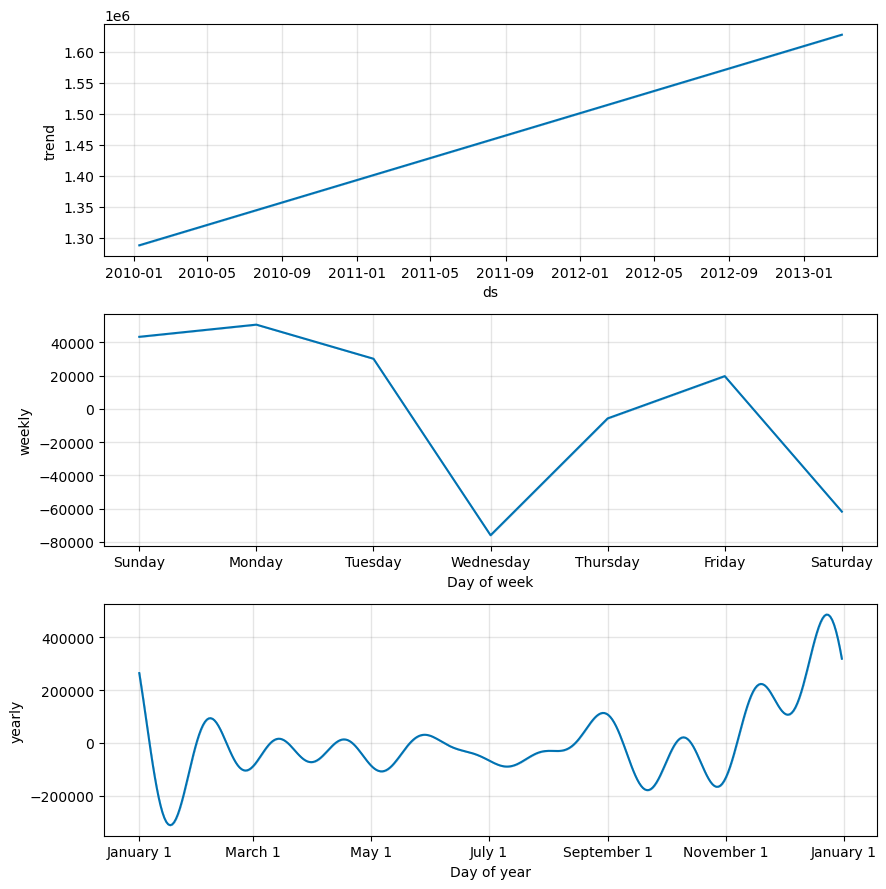

12:49:36 - cmdstanpy - INFO - Chain [1] start processing
12:49:37 - cmdstanpy - INFO - Chain [1] done processing


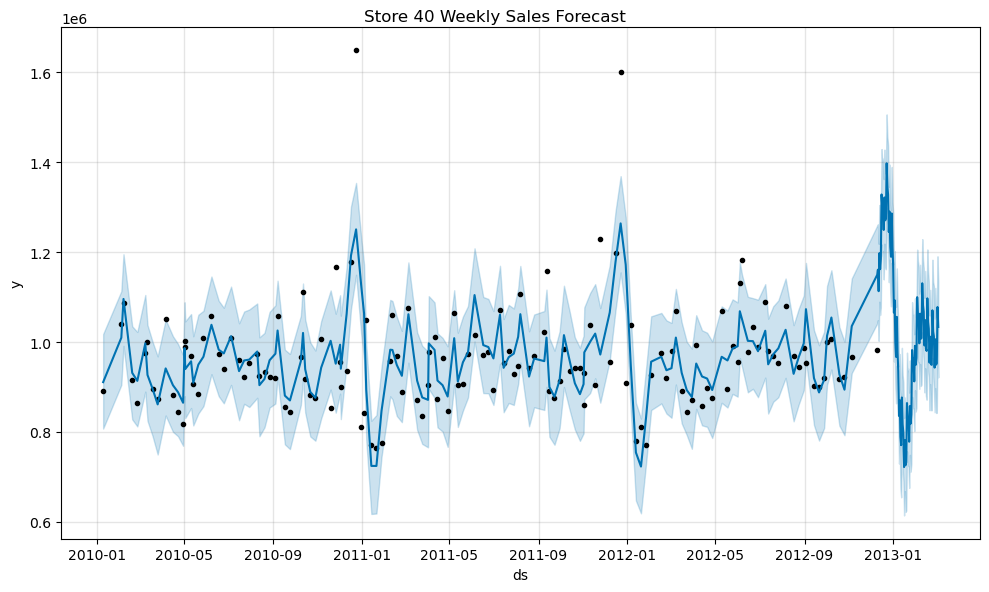

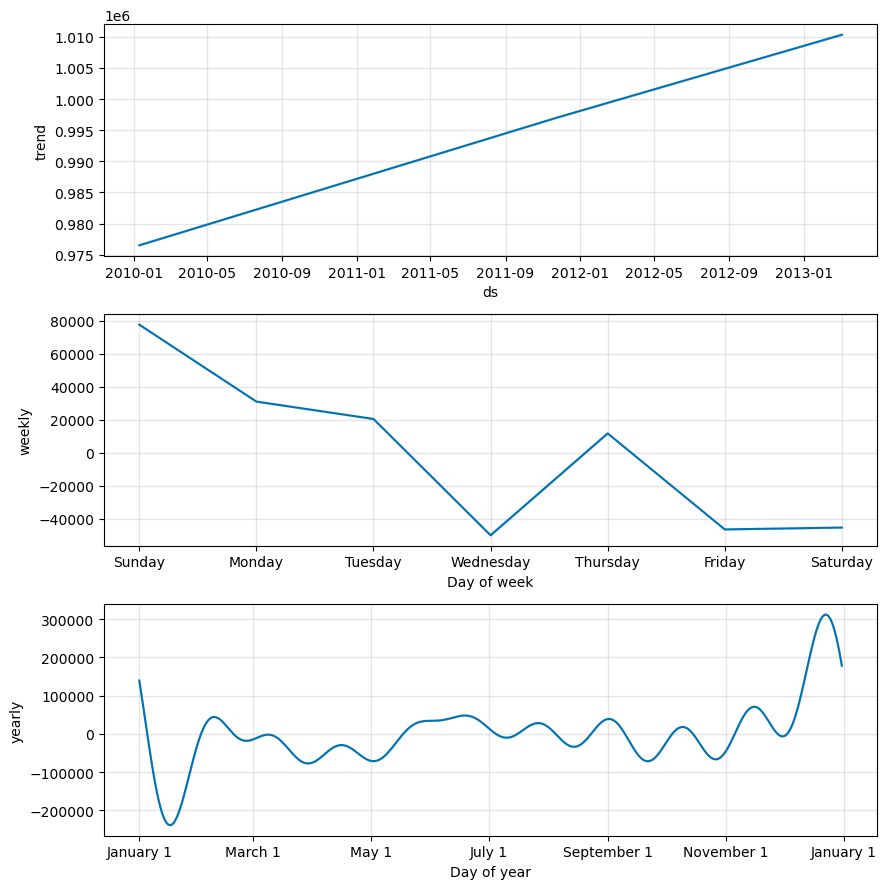

12:49:39 - cmdstanpy - INFO - Chain [1] start processing
12:49:39 - cmdstanpy - INFO - Chain [1] done processing


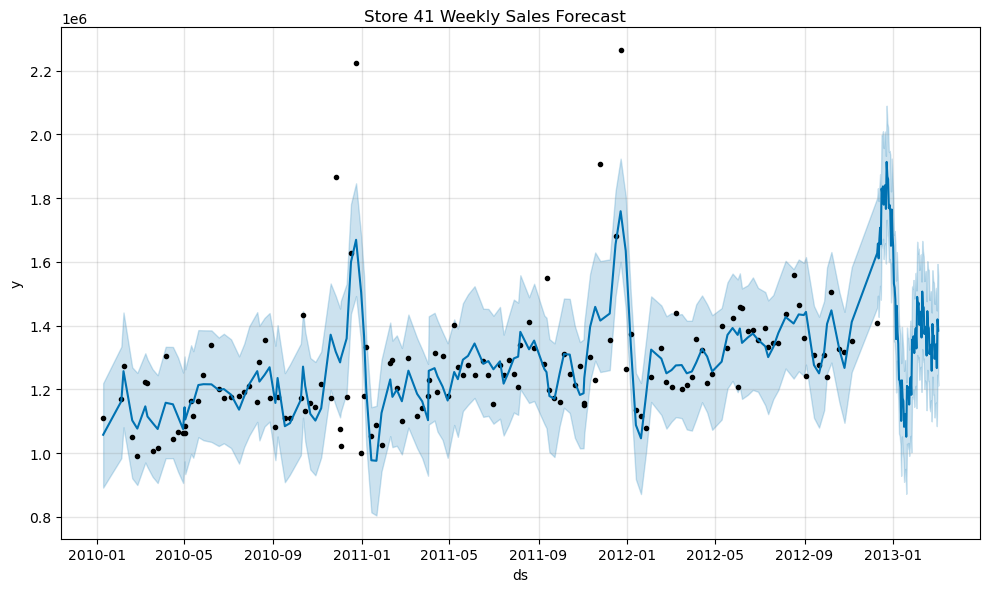

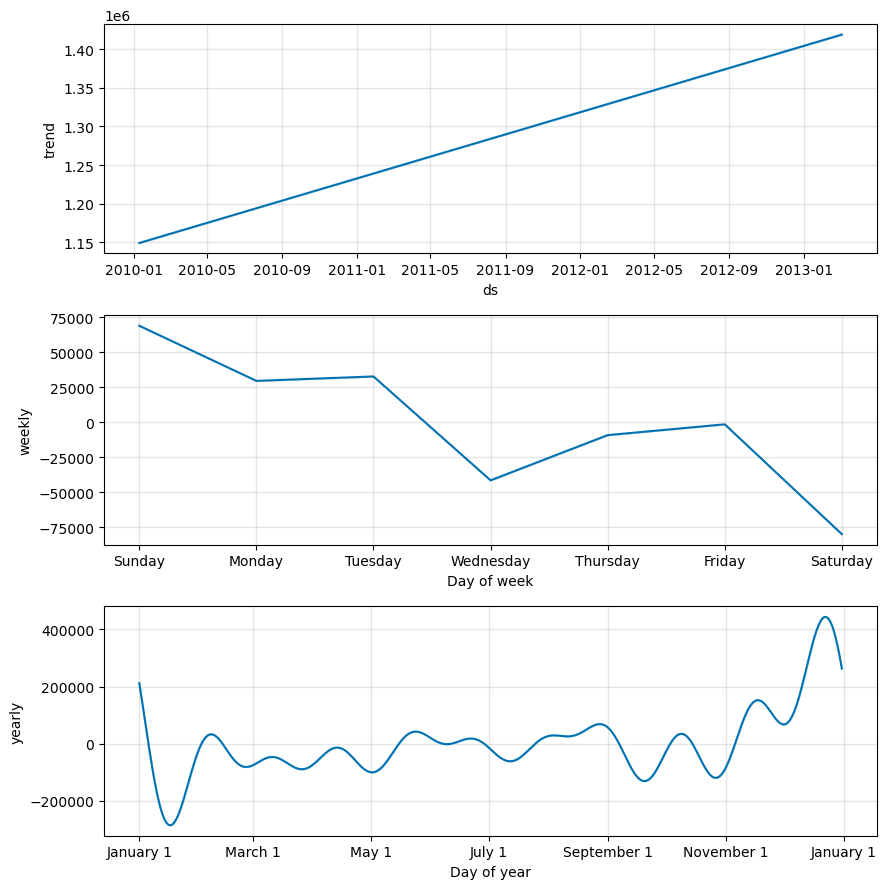

12:49:40 - cmdstanpy - INFO - Chain [1] start processing
12:49:40 - cmdstanpy - INFO - Chain [1] done processing


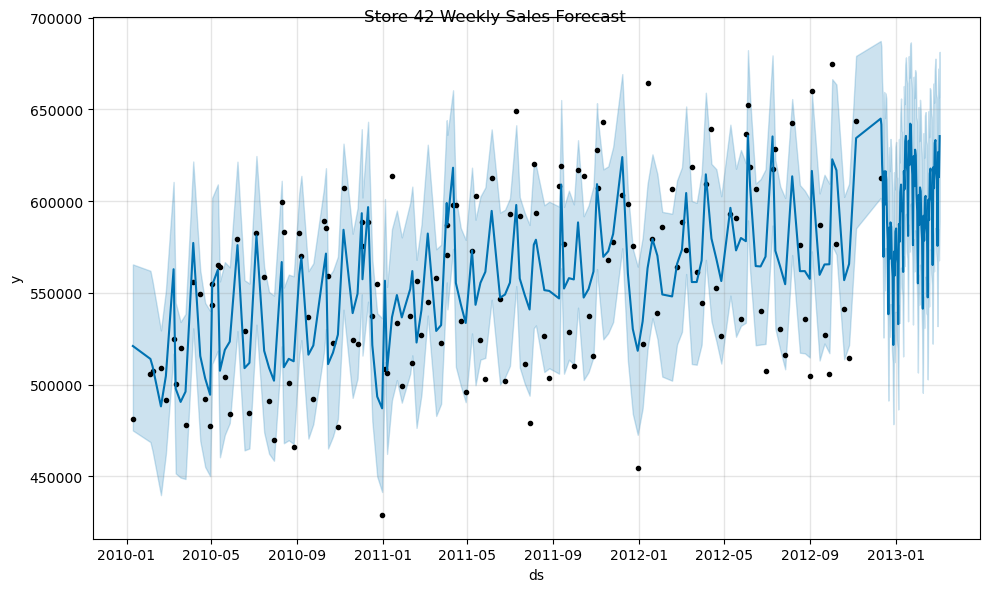

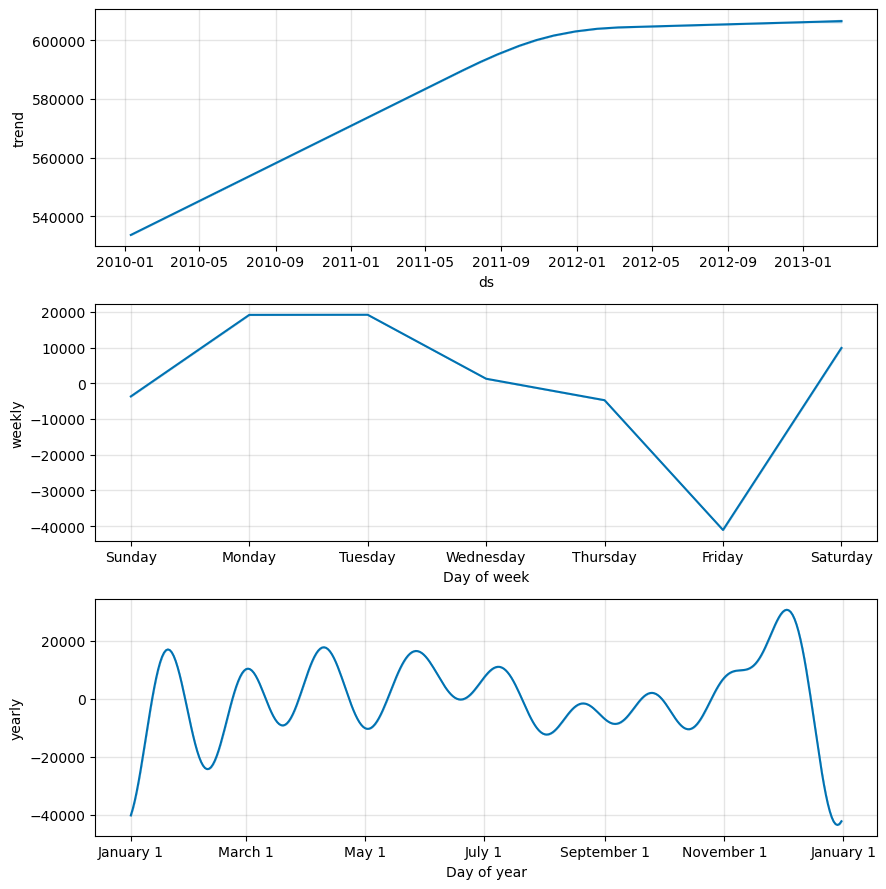

12:49:42 - cmdstanpy - INFO - Chain [1] start processing
12:49:42 - cmdstanpy - INFO - Chain [1] done processing


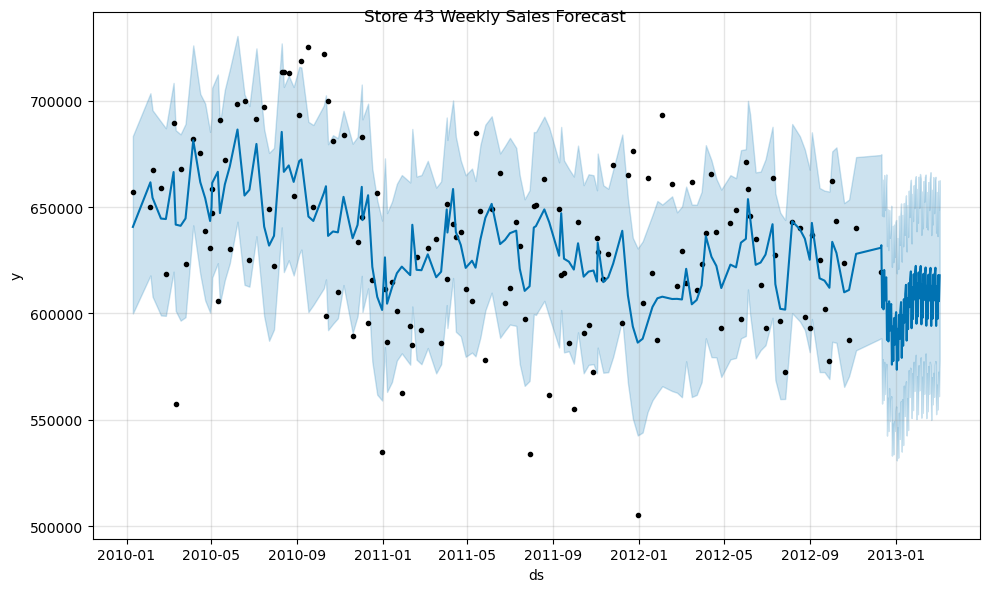

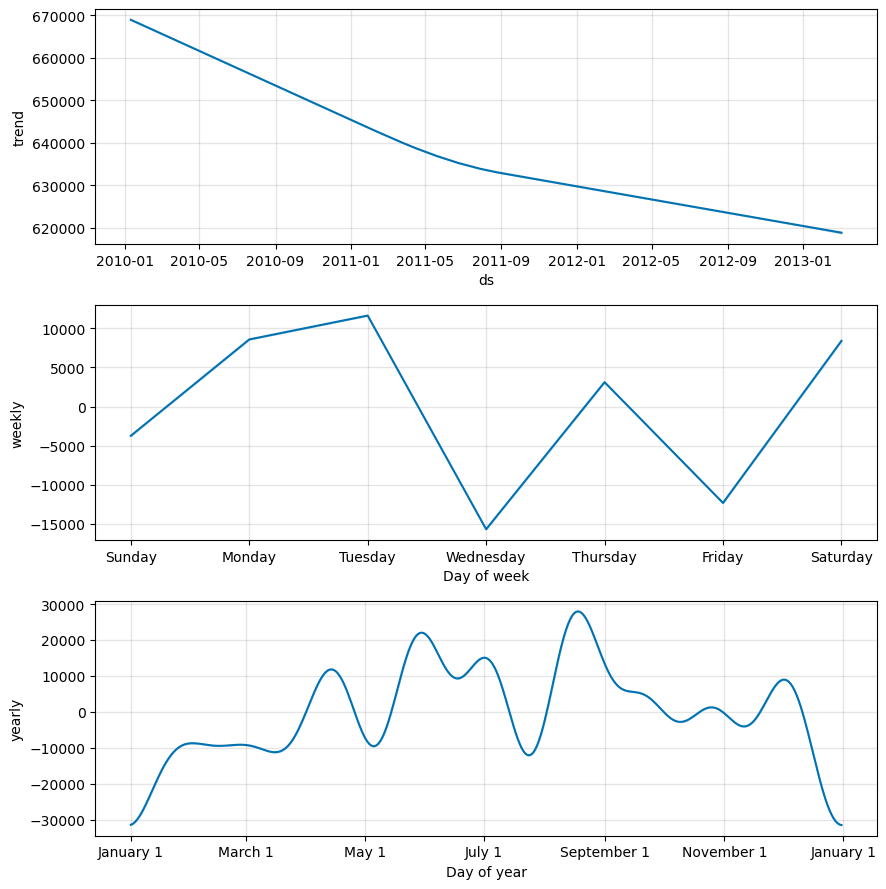

12:49:44 - cmdstanpy - INFO - Chain [1] start processing
12:49:44 - cmdstanpy - INFO - Chain [1] done processing


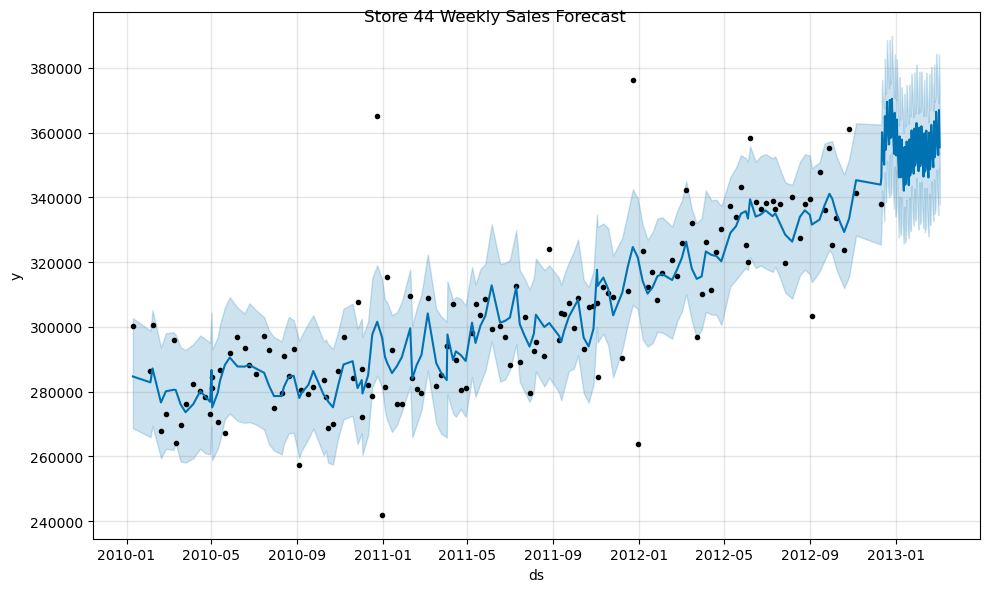

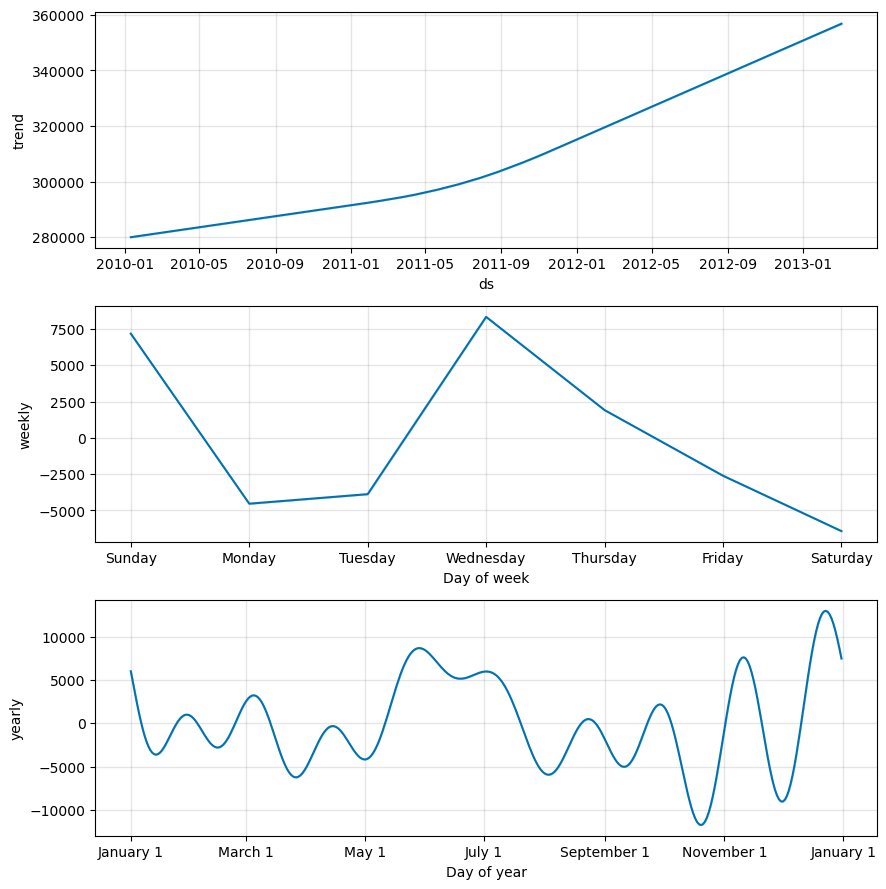

12:49:46 - cmdstanpy - INFO - Chain [1] start processing
12:49:46 - cmdstanpy - INFO - Chain [1] done processing


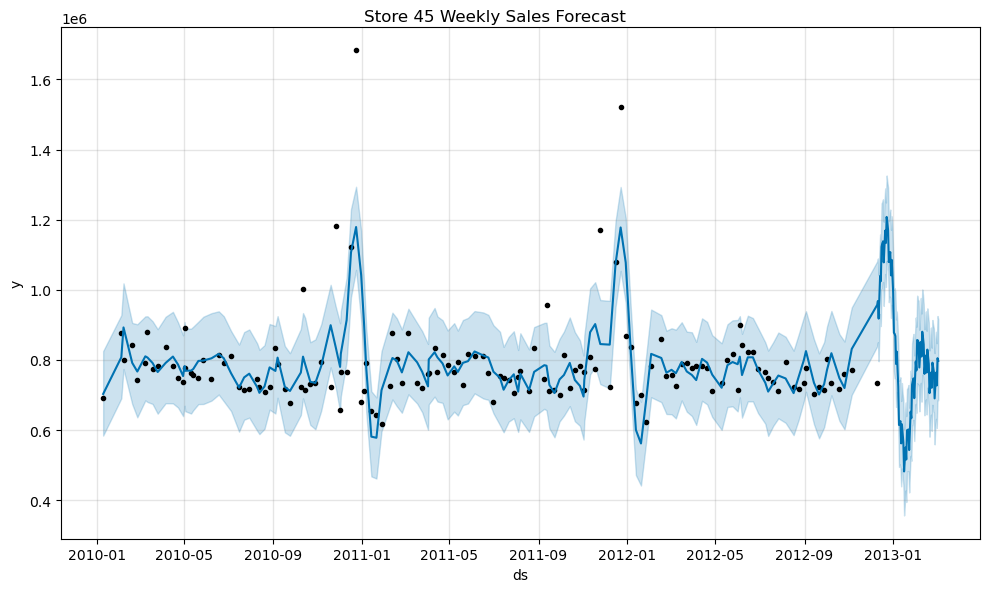

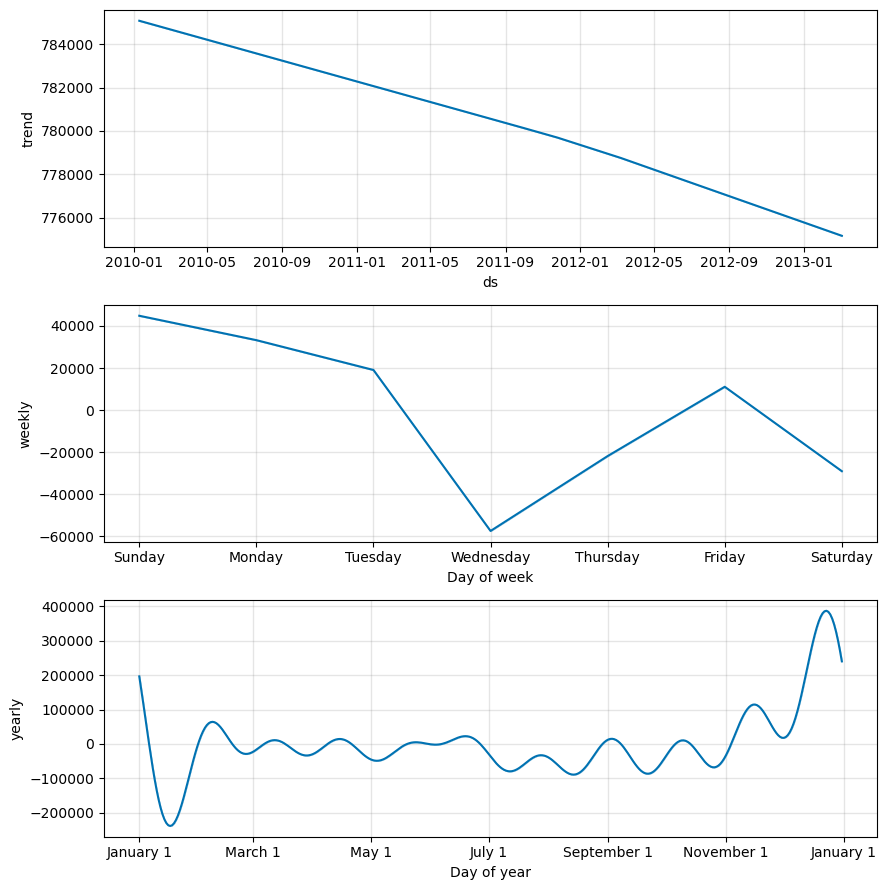

In [16]:
import os
forecast_list=[]
for store,wmr in grouped_data:
    prophet_data=wmr[['Date','Weekly_Sales']]
    prophet_data.columns=['ds','y']
    model=Prophet()
    model.fit(prophet_data)
    future=model.make_future_dataframe(periods=84,freq='d')
    forecast=model.predict(future)
    fig=model.plot(forecast)
    fig.suptitle(f'Store {store} Weekly Sales Forecast')
    folder_path = 'C:\\AL and ML course\\Projects\\code images\\Prophet\\main'
    if not os.path.exists(folder_path):
        os.makedirs(folder_path)
    plt.savefig(f'{folder_path}\\Store_{store}_Weekly_Sales_Forecast.png')
    
    forecasting_plot=model.plot_components(forecast)
    
   
    folder_path = 'C:\\AL and ML course\\Projects\\code images\\Prophet'
    if not os.path.exists(folder_path):
        os.makedirs(folder_path)
    plt.savefig(f'{folder_path}\\Store_{store}_Weekly_Sales_Forecast.png')
    plt.show()
    forecast['Store']=store
    forecast_list.append(forecast[['ds','yhat','yhat_lower','yhat_upper','Store']])

forecast_df=pd.concat(forecast_list)

In [17]:
forecast_df

,ds,yhat,yhat_lower,yhat_upper,Store
0,2010-01-10,1.436040e+06,1.284469e+06,1.583345e+06,1
1,2010-02-04,1.576836e+06,1.445912e+06,1.729316e+06,1
2,2010-02-07,1.651740e+06,1.502354e+06,1.790239e+06,1
3,2010-02-19,1.533404e+06,1.381871e+06,1.681107e+06,1
4,2010-02-26,1.486290e+06,1.341154e+06,1.621469e+06,1
...,...,...,...,...,...
222,2013-02-28,7.279773e+05,6.111371e+05,8.518149e+05,45
223,2013-03-01,7.637900e+05,6.319627e+05,8.802604e+05,45
224,2013-03-02,7.271411e+05,6.063342e+05,8.477279e+05,45
225,2013-03-03,8.049299e+05,6.856505e+05,9.251930e+05,45


# SECTION II 
This part of the code gets the store number from the user and it gives the sales forecast for that particular store only

When Run enter the store number which is from 1 to 45 stores

Enter the store number: 44


13:06:34 - cmdstanpy - INFO - Chain [1] start processing
13:06:34 - cmdstanpy - INFO - Chain [1] done processing


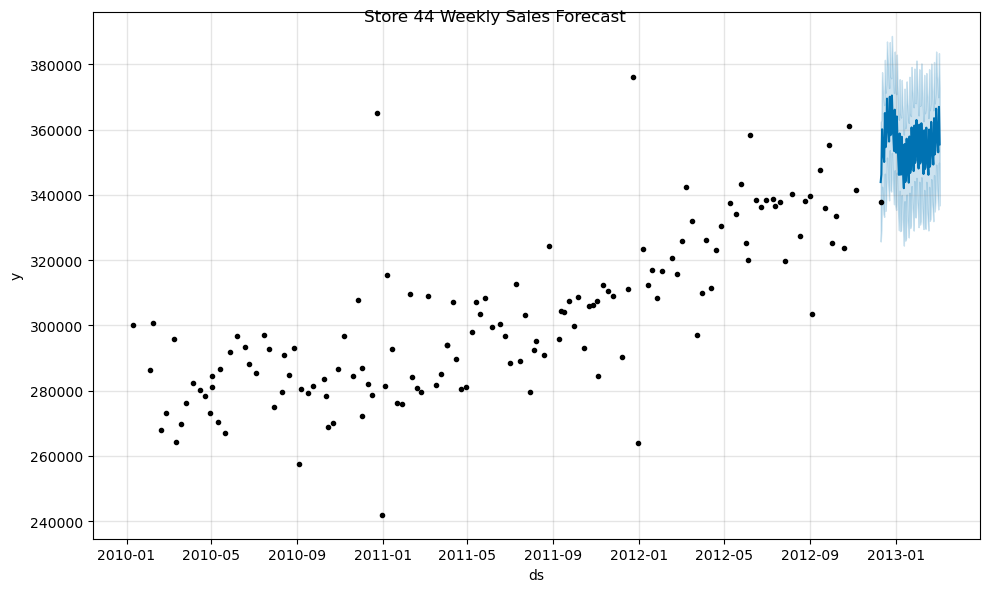

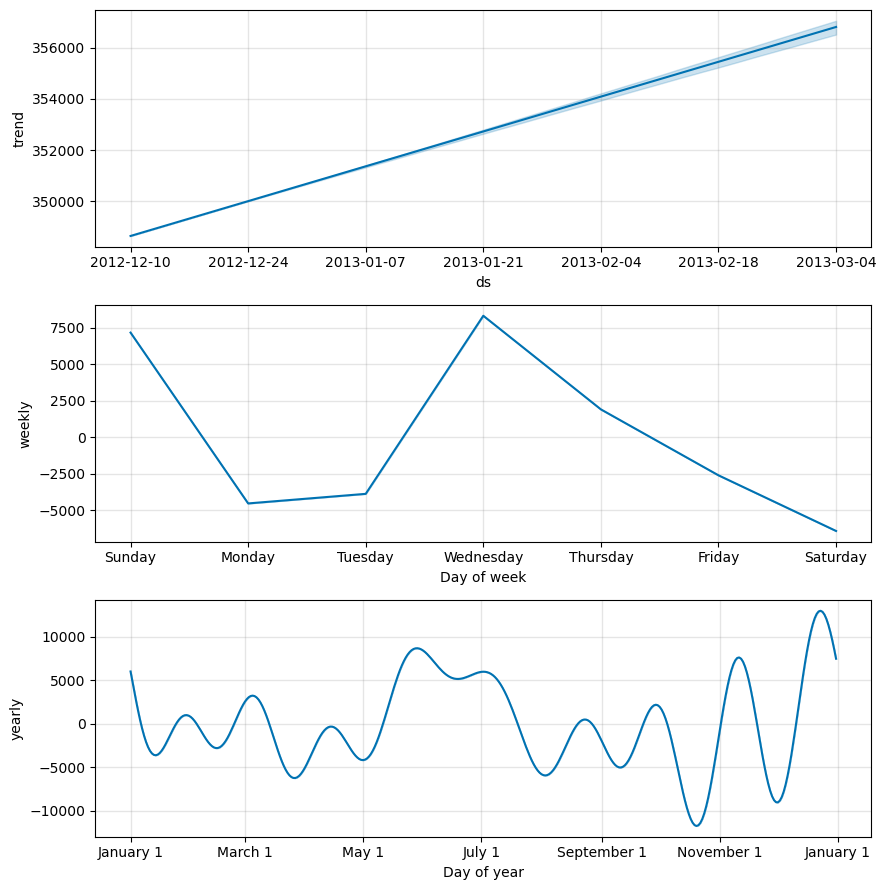

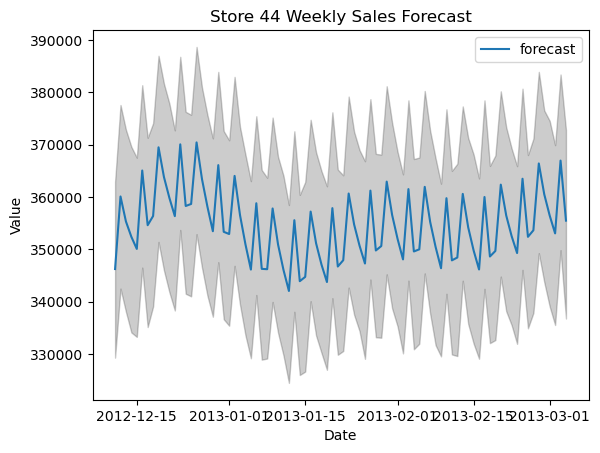

In [23]:
# Get the store number as input from the user
store = int(input('Enter the store number: '))

# Filter the data for the current store
wmr_store = wd[wd['Store'] == store]

# Prepare the data for Prophet
prophet_data = wmr_store[['Date', 'Weekly_Sales']]
prophet_data.columns = ['ds', 'y']
# Create and fit a Prophet model
model = Prophet()
model.fit(prophet_data)

# Generate future dates starting from the last date in the historical data
last_date = prophet_data['ds'].max()
future = pd.date_range(start=last_date, periods=85, freq='d')
future = pd.DataFrame({'ds': future})

# Generate forecasts
forecast = model.predict(future)

# Filter the forecast data to include only future dates
future_forecast = forecast[forecast['ds'] > last_date]

folder_path = 'C:\\AL and ML course\\Projects\\code images\\try'
if not os.path.exists(folder_path):
    os.makedirs(folder_path)

# Plot the full forecast
fig1 = model.plot(forecast)
fig1.suptitle(f'Store {store} Weekly Sales Forecast')
plt.savefig(f'{folder_path}\\Store_{store}_Full_Weekly_Sales_Forecast.png')

#Plot components
forecasting_plot = model.plot_components(forecast)

future_forecast = forecast[forecast['ds'] > last_date]

folder_path = 'C:\\AL and ML course\\Projects\\code images\\try'
if not os.path.exists(folder_path):
    os.makedirs(folder_path)
# Plot the future forecasts
plt.figure()
plt.plot(future_forecast['ds'], future_forecast['yhat'], label='forecast')
plt.fill_between(future_forecast['ds'],
                 future_forecast['yhat_lower'],
                 future_forecast['yhat_upper'], color='k', alpha=.2)

# Add title, labels and legend
plt.title(f'Store {store} Weekly Sales Forecast')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()

# Save the filtered plot
plt.savefig(f'{folder_path}\\Store_{store}_Filtered_Weekly_Sales_Forecast.png')

# Show the plots
plt.show()
# Add the store number to the forecast data
forecast['Store'] = store

# Select the columns of interest
forecast = forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper', 'Store']]

Store
20    3.013978e+08
4     2.995440e+08
14    2.889999e+08
13    2.865177e+08
2     2.753824e+08
10    2.716177e+08
27    2.538559e+08
6     2.237561e+08
1     2.224028e+08
39    2.074455e+08
Name: Weekly_Sales, dtype: float64


# Check the Future sales of Top 5 stores

13:24:40 - cmdstanpy - INFO - Chain [1] start processing
13:24:40 - cmdstanpy - INFO - Chain [1] done processing
13:24:40 - cmdstanpy - INFO - Chain [1] start processing
13:24:41 - cmdstanpy - INFO - Chain [1] done processing
13:24:41 - cmdstanpy - INFO - Chain [1] start processing
13:24:41 - cmdstanpy - INFO - Chain [1] done processing
13:24:41 - cmdstanpy - INFO - Chain [1] start processing
13:24:41 - cmdstanpy - INFO - Chain [1] done processing
13:24:42 - cmdstanpy - INFO - Chain [1] start processing
13:24:42 - cmdstanpy - INFO - Chain [1] done processing


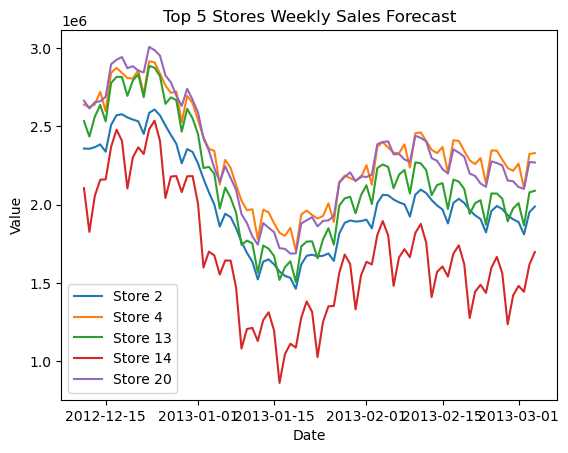

In [33]:

top_5_stores = wd.groupby('Store')['Weekly_Sales'].sum().sort_values(ascending=False).head(5).index
top_5_stores_data = wd[wd['Store'].isin(top_5_stores)]

for store, wmr in top_5_stores_data.groupby('Store'):
    prophet_data = wmr[['Date', 'Weekly_Sales']]
    prophet_data.columns = ['ds', 'y']
    model = Prophet()
    model.fit(prophet_data)
    future = model.make_future_dataframe(periods=84, freq='d')
    forecast = model.predict(future)
    
    # Filter the forecast data to include only future dates
    last_date = prophet_data['ds'].max()
    future_forecast = forecast[forecast['ds'] > last_date]
    
    # Plot the filtered forecast for the store
    plt.plot(future_forecast['ds'], future_forecast['yhat'], label=f'Store {store}')

# Add title, labels and legend
plt.title('Top 5 Stores Weekly Sales Forecast')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()

# Show the plot
plt.show()

# FUTURE SALES PREDICTION OF LAST 5 STORES

14:01:32 - cmdstanpy - INFO - Chain [1] start processing
14:01:32 - cmdstanpy - INFO - Chain [1] done processing
14:01:33 - cmdstanpy - INFO - Chain [1] start processing
14:01:33 - cmdstanpy - INFO - Chain [1] done processing
14:01:33 - cmdstanpy - INFO - Chain [1] start processing
14:01:33 - cmdstanpy - INFO - Chain [1] done processing
14:01:34 - cmdstanpy - INFO - Chain [1] start processing
14:01:34 - cmdstanpy - INFO - Chain [1] done processing
14:01:34 - cmdstanpy - INFO - Chain [1] start processing
14:01:34 - cmdstanpy - INFO - Chain [1] done processing


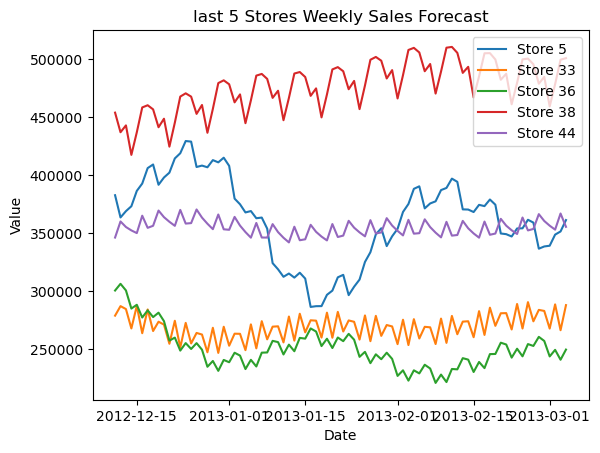

In [52]:
last_5_stores = wd.groupby('Store')['Weekly_Sales'].sum().sort_values(ascending=True).head(5).index
last_5_stores_data = wd[wd['Store'].isin(last_5_stores)]

for store, wmr in last_5_stores_data.groupby('Store'):
    prophet_data = wmr[['Date', 'Weekly_Sales']]
    prophet_data.columns = ['ds', 'y']
    model = Prophet()
    model.fit(prophet_data)
    future = model.make_future_dataframe(periods=84, freq='d')
    forecast = model.predict(future)
    
    # Filter the forecast data to include only future dates
    last_date = prophet_data['ds'].max()
    future_forecast = forecast[forecast['ds'] > last_date]
    
    # Plot the filtered forecast for the store
    plt.plot(future_forecast['ds'], future_forecast['yhat'], label=f'Store {store}')

# Add title, labels and legend
plt.title('last 5 Stores Weekly Sales Forecast')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()

# Show the plot
plt.show()

# FUTURE PREDICTION PERFORMANCE COMPARISION OF TOP 5 AND LAST 5 STORES

14:02:02 - cmdstanpy - INFO - Chain [1] start processing
14:02:02 - cmdstanpy - INFO - Chain [1] done processing
14:02:02 - cmdstanpy - INFO - Chain [1] start processing
14:02:02 - cmdstanpy - INFO - Chain [1] done processing
14:02:02 - cmdstanpy - INFO - Chain [1] start processing
14:02:02 - cmdstanpy - INFO - Chain [1] done processing
14:02:03 - cmdstanpy - INFO - Chain [1] start processing
14:02:03 - cmdstanpy - INFO - Chain [1] done processing
14:02:03 - cmdstanpy - INFO - Chain [1] start processing
14:02:03 - cmdstanpy - INFO - Chain [1] done processing
14:02:04 - cmdstanpy - INFO - Chain [1] start processing
14:02:04 - cmdstanpy - INFO - Chain [1] done processing
14:02:04 - cmdstanpy - INFO - Chain [1] start processing
14:02:04 - cmdstanpy - INFO - Chain [1] done processing
14:02:04 - cmdstanpy - INFO - Chain [1] start processing
14:02:05 - cmdstanpy - INFO - Chain [1] done processing
14:02:05 - cmdstanpy - INFO - Chain [1] start processing
14:02:05 - cmdstanpy - INFO - Chain [1]

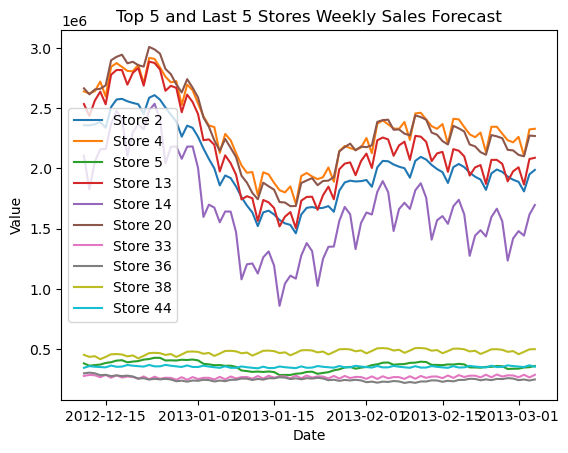

In [53]:

top_5_stores = wd.groupby('Store')['Weekly_Sales'].sum().sort_values(ascending=False).head(5).index
last_5_stores = wd.groupby('Store')['Weekly_Sales'].sum().sort_values(ascending=True).head(5).index
stores = list(top_5_stores) + list(last_5_stores)
stores_data = wd[wd['Store'].isin(stores)]

for store, wmr in stores_data.groupby('Store'):
    prophet_data = wmr[['Date', 'Weekly_Sales']]
    prophet_data.columns = ['ds', 'y']
    model = Prophet()
    model.fit(prophet_data)
    future = model.make_future_dataframe(periods=84, freq='d')
    forecast = model.predict(future)
    
    # Filter the forecast data to include only future dates
    last_date = prophet_data['ds'].max()
    future_forecast = forecast[forecast['ds'] > last_date]
    
    # Plot the filtered forecast for the store
    plt.plot(future_forecast['ds'], future_forecast['yhat'], label=f'Store {store}')

# Add title, labels and legend
plt.title('Top 5 and Last 5 Stores Weekly Sales Forecast')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()

# Show the plot
plt.show()

In [54]:
print('The top 5 stores are',top_5_stores)
print('The last 5 stores are',last_5_stores)

The top 5 stores are Int64Index([20, 4, 14, 13, 2], dtype='int64', name='Store')
The last 5 stores are Int64Index([33, 44, 5, 36, 38], dtype='int64', name='Store')


# Compare the performance of the stores- Enter the store number from 1 to 45 with commas

Enter store numbers separated by commas: 1,30,40


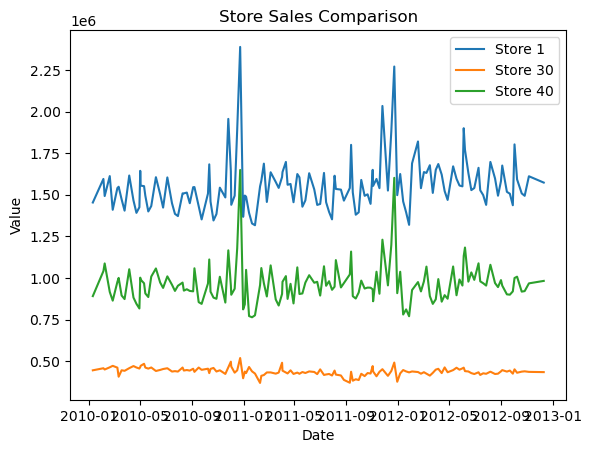

In [43]:
# Assuming your data is stored in a DataFrame called `df`
store_numbers = input('Enter store numbers separated by commas: ').split(',')
store_numbers = [int(store) for store in store_numbers]
stores_data = wd[wd['Store'].isin(store_numbers)]

for store, wmr in stores_data.groupby('Store'):
    # Plot the sales of the store
    plt.plot(wmr['Date'], wmr['Weekly_Sales'], label=f'Store {store}')

# Add title, labels and legend
plt.title('Store Sales Comparison')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()

# Show the plot
plt.show()

# FUTURE FORECAST of the different Stores, INPUT from 1 to 45 seperated by commas

Enter store numbers separated by commas: 10,20,30,40


13:40:56 - cmdstanpy - INFO - Chain [1] start processing
13:40:57 - cmdstanpy - INFO - Chain [1] done processing
13:40:57 - cmdstanpy - INFO - Chain [1] start processing
13:40:57 - cmdstanpy - INFO - Chain [1] done processing
13:40:57 - cmdstanpy - INFO - Chain [1] start processing
13:40:57 - cmdstanpy - INFO - Chain [1] done processing
13:40:58 - cmdstanpy - INFO - Chain [1] start processing
13:40:58 - cmdstanpy - INFO - Chain [1] done processing


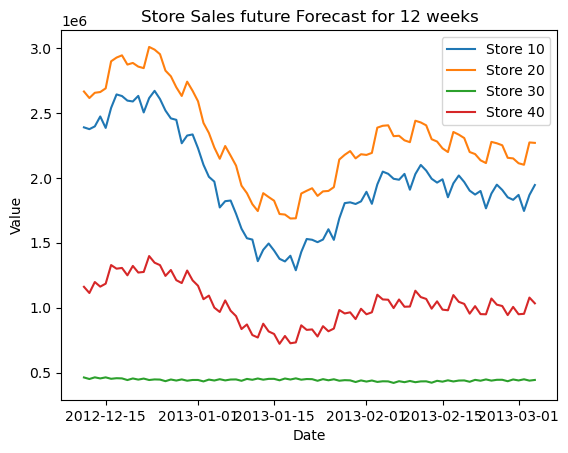

In [46]:
# Assuming your data is stored in a DataFrame called `df`
store_numbers = input('Enter store numbers separated by commas: ').split(',')
store_numbers = [int(store) for store in store_numbers]
stores_data = wd[wd['Store'].isin(store_numbers)]

for store, wmr in stores_data.groupby('Store'):
    prophet_data = wmr[['Date', 'Weekly_Sales']]
    prophet_data.columns = ['ds', 'y']
    model = Prophet()
    model.fit(prophet_data)
    future = model.make_future_dataframe(periods=84, freq='d')
    forecast = model.predict(future)
    
    # Filter the forecast data to include only future dates
    last_date = prophet_data['ds'].max()
    future_forecast = forecast[forecast['ds'] > last_date]
    
    # Plot the filtered forecast for the store
    plt.plot(future_forecast['ds'], future_forecast['yhat'], label=f'Store {store}')

# Add title, labels and legend
plt.title('Store Sales future Forecast for 12 weeks')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()

# Show the plot
plt.show()

In [58]:
# Assuming your data is stored in a DataFrame called `df`
top_stores_order = wd.groupby('Store')['Weekly_Sales'].sum().sort_values(ascending=False)

# Display the top 10 stores
print(top_stores_order)

Store
20    3.013978e+08
4     2.995440e+08
14    2.889999e+08
13    2.865177e+08
2     2.753824e+08
10    2.716177e+08
27    2.538559e+08
6     2.237561e+08
1     2.224028e+08
39    2.074455e+08
19    2.066349e+08
31    1.996139e+08
23    1.987506e+08
24    1.940160e+08
11    1.939628e+08
28    1.892637e+08
41    1.813419e+08
32    1.668192e+08
18    1.551147e+08
22    1.470756e+08
12    1.442872e+08
26    1.434164e+08
34    1.382498e+08
40    1.378703e+08
35    1.315207e+08
8     1.299512e+08
17    1.277821e+08
45    1.123953e+08
21    1.081179e+08
25    1.010612e+08
43    9.056544e+07
15    8.913368e+07
7     8.159828e+07
42    7.956575e+07
9     7.778922e+07
29    7.714155e+07
16    7.425243e+07
37    7.420274e+07
30    6.271689e+07
3     5.758674e+07
38    5.515963e+07
36    5.341221e+07
5     4.547569e+07
44    4.329309e+07
33    3.716022e+07
Name: Weekly_Sales, dtype: float64


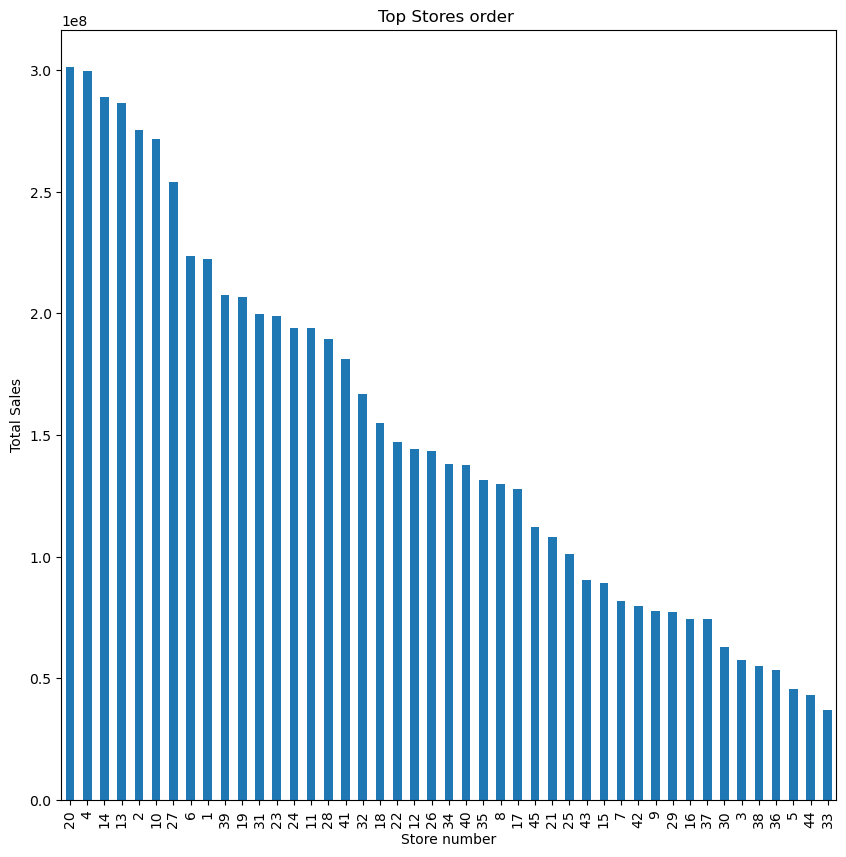

In [76]:
# Assuming your data is stored in a DataFrame called `df`
top_stores = wd.groupby('Store')['Weekly_Sales'].sum().sort_values(ascending=False)

# Set the figure size
plt.figure(figsize=(10, 10))

# Create a bar plot of the total sales for the top 10 stores
top_stores.plot(kind='bar', title='Top Stores order ')

# Add labels
plt.xlabel('Store number',fontsize=10)
plt.ylabel('Total Sales',fontsize=10)

# Show the plot
plt.show()